# IMPORT

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import pandas as pd
from n00ter_stats import * 
from n00_config_params import *
from n00bis_config_analysis_functions import *
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.formula.api as smf
import statsmodels.api as sm
from statsmodels.stats.proportion import proportions_ztest
import joblib


# FUNCTIONS

In [3]:
def get_ROI_counts(df):

    ROI_list = df['ROI'].unique()

    ROI_counts_plot = {}
    ROI_counts_sujet = {}

    for ROI in ROI_list:

        ROI_counts_plot[ROI] = 0
        ROI_counts_sujet[ROI] = len(df.query(f"ROI == '{ROI}'")['sujet'].unique())

        for sujet in df.query(f"ROI == '{ROI}'")['sujet'].unique():

            ROI_counts_plot[ROI] += df.query(f"ROI == '{ROI}' and sujet == '{sujet}'")['chan'].unique().shape[0]
        
    return ROI_counts_plot, ROI_counts_sujet

In [4]:
def get_pval(pval):

    if pval > 0.05:

        return pval

    elif pval < 0.001:

        return '***'

    elif pval < 0.01:

        return '**'

    elif pval < 0.05:

        return '*'

# LOAD DF

## Cxy

In [5]:
os.chdir(os.path.join(path_results, 'allplot', 'df', 'df_aggregates'))
df_Cxy_FR_CV = pd.read_excel(f'df_Cxy_FR_CV_filt.xlsx')
df_Cxy_ALLCOND = pd.read_excel(f'df_Cxy_ALLCOND_filt.xlsx')
df_Cxy_FR_CV_nofilt = pd.read_excel(f'df_Cxy.xlsx').query(f"cond == 'FR_CV'")
df_Cxy_ALLCOND_nofilt = pd.read_excel(f'df_Cxy.xlsx').query(f"sujet in {sujet_list}")

In [6]:
df_ROI_count_FR_CV = df_Cxy_FR_CV.groupby(['ROI']).size().reset_index(name='count_plot')
df_ROI_count_FR_CV['count_sujet'] = df_Cxy_FR_CV.groupby(['ROI', 'sujet']).size().reset_index(name='count_sujet').groupby('ROI').size().reset_index(name='count_sujet')['count_sujet'].values

Cxy_ROI_list_FR_CV_filt = df_Cxy_FR_CV['ROI'].unique()

In [7]:
df_ROI_count_allcond = df_Cxy_ALLCOND.query(f"cond == 'FR_CV'").groupby(['ROI']).size().reset_index(name='count_plot')
df_ROI_count_allcond['count_sujet'] = df_Cxy_ALLCOND.groupby(['ROI', 'sujet']).size().reset_index(name='count_sujet').groupby('ROI').size().reset_index(name='count_sujet')['count_sujet'].values

Cxy_ROI_list_ALLCOND_filt = df_Cxy_ALLCOND['ROI'].unique()

## Pxx

In [8]:
os.chdir(os.path.join(path_results, 'allplot', 'df', 'df_aggregates'))
df_Pxx_FR_CV = pd.read_excel(f'df_Pxx_FR_CV_filt.xlsx')
df_Pxx_ALLCOND = pd.read_excel(f'df_Pxx_ALLCOND_filt.xlsx')

In [9]:
Pxx_ROI_list_FR_CV_filt = df_Pxx_FR_CV['ROI'].unique()

In [10]:
Pxx_ROI_list_ALLCOND_filt = df_Pxx_ALLCOND['ROI'].unique()

In [11]:
df_ROI_count_ALLCOND_Pxx = df_Pxx_ALLCOND.query(f"cond == 'FR_CV' and band == 'alpha' and phase == 'whole'").groupby(['ROI']).size().reset_index(name='count_plot')
df_ROI_count_ALLCOND_Pxx['count_sujet'] = df_Pxx_ALLCOND.query(f"cond == 'FR_CV' and band == 'alpha' and phase == 'whole'").groupby(['ROI', 'sujet']).size().reset_index(name='count_sujet').groupby('ROI').size().reset_index(name='count_sujet')['count_sujet'].values

Pxx_ROI_list_ALLCOND_filt = df_Pxx_ALLCOND['ROI'].unique()

## MI

In [12]:
os.chdir(os.path.join(path_results, 'allplot', 'df', 'df_aggregates'))
df_MI_FR_CV = pd.read_excel(f'df_MI_FR_CV_filt.xlsx')
df_MI_ALLCOND = pd.read_excel(f'df_MI_ALLCOND_filt.xlsx')

In [13]:
MI_ROI_list_FR_CV_filt = df_MI_FR_CV['ROI'].unique()

In [14]:
MI_ROI_list_ALLCOND_filt = df_MI_ALLCOND['ROI'].unique()

## FC

In [15]:
os.chdir(os.path.join(path_results, 'allplot', 'df', 'df_aggregates'))
df_fc_FR_CV = pd.read_excel(f'df_WPLI_FC_FR_CV.xlsx')
df_fc_ALLCOND = pd.read_excel(f'df_WPLI_FC_ALLCOND.xlsx')

# ANATOMY

## Contact excluded

In [19]:
df_allcontact = pd.DataFrame()

for sujet in sujet_list_FR_CV:

    os.chdir(os.path.join(path_anatomy, sujet))
    df_allcontact_sujet = pd.read_excel(f"{sujet}_plot_loca.xlsx")
    df_allcontact = pd.concat([df_allcontact, df_allcontact_sujet])

In [29]:
n_sel = df_allcontact['select'].values.sum()
n_nosel = (df_allcontact['select'].values == 0).sum()
n_SOZ = df_allcontact.query(f"inSOZ == 1").shape[0]

print(f"tot = {df_allcontact.shape[0]}")
print(f"sel = {n_sel}")
print(f"no sel = {n_nosel}")
print(f"inSOZ = {n_SOZ}")

tot = 2510
sel = 1854
no sel = 656
inSOZ = 348


## FR_CV

### FILT

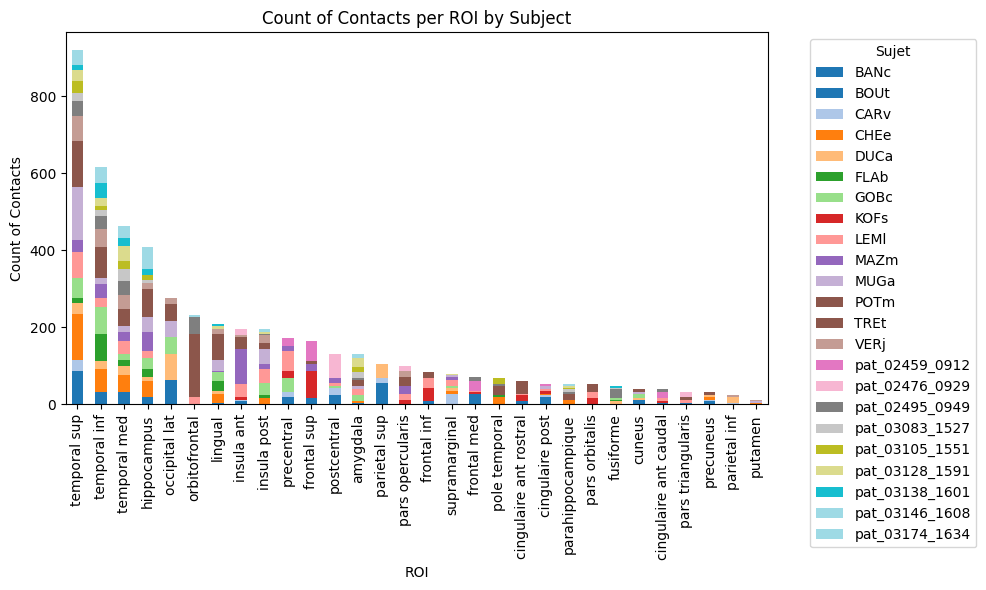

In [ ]:
roi_counts = df_Cxy_FR_CV.query("ROI != 'WM'").groupby(['ROI', 'sujet']).size().reset_index(name='count')
roi_pivot = roi_counts.pivot(index='ROI', columns='sujet', values='count').fillna(0)
roi_pivot = roi_pivot.loc[roi_pivot.sum(axis=1).sort_values(ascending=False).index]

ax = roi_pivot.plot(kind='bar', stacked=True, figsize=(10, 6), cmap='tab20')

plt.title('Count of Contacts per ROI by Subject')
plt.xlabel('ROI')
plt.ylabel('Count of Contacts')
plt.legend(title='Sujet', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

### NO FILT

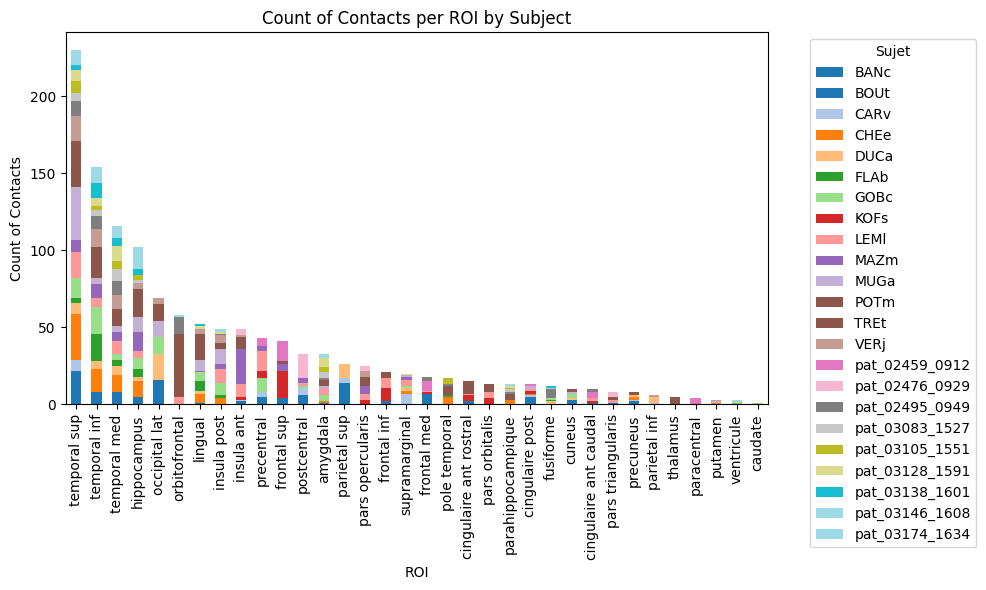

In [206]:
roi_counts = df_Cxy_FR_CV_nofilt.query("ROI != 'WM'").groupby(['ROI', 'sujet']).size().reset_index(name='count')
roi_pivot = roi_counts.pivot(index='ROI', columns='sujet', values='count').fillna(0)
roi_pivot = roi_pivot.loc[roi_pivot.sum(axis=1).sort_values(ascending=False).index]

ax = roi_pivot.plot(kind='bar', stacked=True, figsize=(10, 6), cmap='tab20')

plt.title('Count of Contacts per ROI by Subject')
plt.xlabel('ROI')
plt.ylabel('Count of Contacts')
plt.legend(title='Sujet', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [207]:
print('EXCLUDED AFTER FILT')
[ROI for ROI in df_Cxy_FR_CV_nofilt.query("ROI != 'WM'")['ROI'].unique() if ROI not in df_Cxy_FR_CV.query("ROI != 'WM'")['ROI'].unique()]

EXCLUDED AFTER FILT


['caudate', 'thalamus', 'paracentral', 'ventricule']

## ALLCOND

### FILT

In [208]:
df_Cxy_ALLCOND.query("ROI != 'WM'").groupby(['ROI', 'chan']).size().reset_index().groupby(['ROI']).size().reset_index(name='count')

,ROI,count
0,amygdala,5
1,cingulaire post,6
2,cuneus,6
3,frontal sup,9
4,fusiforme,4
5,hippocampus,34
6,insula ant,32
7,insula post,18
8,lingual,35
9,occipital lat,40


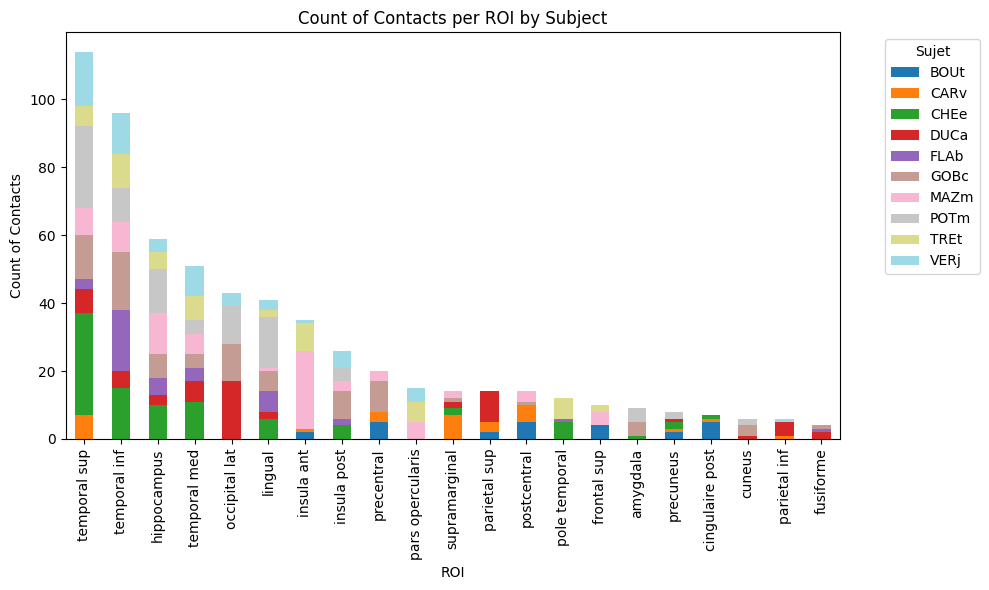

In [209]:
roi_counts = df_Cxy_ALLCOND.query("ROI != 'WM'").groupby(['ROI', 'sujet', 'chan']).size().reset_index(name='count').groupby(['ROI', 'sujet']).size().reset_index(name='count')
roi_pivot = roi_counts.pivot(index='ROI', columns='sujet', values='count').fillna(0)
roi_pivot = roi_pivot.loc[roi_pivot.sum(axis=1).sort_values(ascending=False).index]

ax = roi_pivot.plot(kind='bar', stacked=True, figsize=(10, 6), cmap='tab20')

plt.title('Count of Contacts per ROI by Subject')
plt.xlabel('ROI')
plt.ylabel('Count of Contacts')
plt.legend(title='Sujet', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

### NO FILT

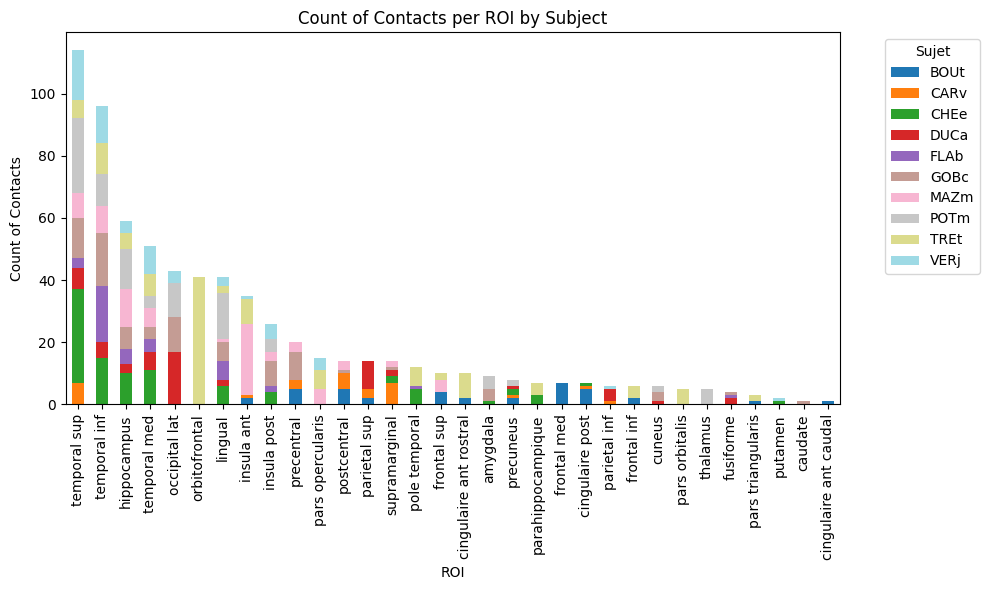

In [210]:
roi_counts = df_Cxy_ALLCOND_nofilt.query("ROI != 'WM'").groupby(['ROI', 'sujet', 'chan']).size().reset_index(name='count').groupby(['ROI', 'sujet']).size().reset_index(name='count')
roi_pivot = roi_counts.pivot(index='ROI', columns='sujet', values='count').fillna(0)
roi_pivot = roi_pivot.loc[roi_pivot.sum(axis=1).sort_values(ascending=False).index]

ax = roi_pivot.plot(kind='bar', stacked=True, figsize=(10, 6), cmap='tab20')

plt.title('Count of Contacts per ROI by Subject')
plt.xlabel('ROI')
plt.ylabel('Count of Contacts')
plt.legend(title='Sujet', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [211]:
print('EXCLUDED AFTER FILT')
[ROI for ROI in df_Cxy_ALLCOND_nofilt.query("ROI != 'WM'")['ROI'].unique() if ROI not in df_Cxy_ALLCOND.query("ROI != 'WM'")['ROI'].unique()]

EXCLUDED AFTER FILT


['parahippocampique',
 'putamen',
 'caudate',
 'orbitofrontal',
 'pars orbitalis',
 'pars triangularis',
 'cingulaire ant rostral',
 'frontal inf',
 'thalamus',
 'frontal med',
 'cingulaire ant caudal']

# Cxy

## FR_CV

### PROPORTION

In [35]:
data_df = {'ROI' : [], 'Cxy_p' : [], 'Cxy_val_signi' : [], 'Cxy_val_nosigni' : []}

for ROI in Cxy_ROI_list_FR_CV_filt:
    
    signi = (df_Cxy_FR_CV.query(f"ROI == '{ROI}'")['Cxy'] > df_Cxy_FR_CV.query(f"ROI == '{ROI}'")['Cxy_surr']).sum()
    _Cxy_signi = df_Cxy_FR_CV.query(f"ROI == '{ROI}'")[(df_Cxy_FR_CV.query(f"ROI == '{ROI}'")['Cxy'] > df_Cxy_FR_CV.query(f"ROI == '{ROI}'")['Cxy_surr'])]['Cxy'].median()
    _Cxy_nosigni = df_Cxy_FR_CV.query(f"ROI == '{ROI}'")[(df_Cxy_FR_CV.query(f"ROI == '{ROI}'")['Cxy'] < df_Cxy_FR_CV.query(f"ROI == '{ROI}'")['Cxy_surr'])]['Cxy'].median()
    prop_Cxy = signi/df_ROI_count_FR_CV.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
    
    data_df['ROI'].append(ROI)
    data_df['Cxy_val_signi'].append(_Cxy_signi)
    data_df['Cxy_val_nosigni'].append(_Cxy_nosigni)
    data_df['Cxy_p'].append(prop_Cxy)

df_Cxy_p = pd.DataFrame(data_df) 
df_Cxy_p

,ROI,Cxy_p,Cxy_val_signi,Cxy_val_nosigni
0,temporal sup,0.169565,0.209290,0.069557
1,amygdala,0.393939,0.289870,0.093662
2,temporal med,0.137931,0.214494,0.085187
3,hippocampus,0.156863,0.236233,0.063630
4,temporal inf,0.207792,0.241906,0.074023
5,parahippocampique,0.384615,0.216224,0.066914
6,pole temporal,0.117647,0.177409,0.074683
7,putamen,0.000000,NaN,0.188982
8,insula post,0.122449,0.289450,0.080351
9,lingual,0.115385,0.206575,0.060888


/tmp/ipykernel_3811780/1133523225.py:4: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  g = sns.pointplot(data=df_plot , x='Cxy_p', y='ROI', ax=ax, join=False, order=df_plot.sort_values('Cxy_p').ROI, label='Cxy_p')
/tmp/ipykernel_3811780/1133523225.py:5: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  g = sns.pointplot(data=df_plot , x='Cxy_val_signi', y='ROI', ax=ax, join=False, order=df_plot.sort_values('Cxy_p').ROI, label='Cxy_val_signi')
/tmp/ipykernel_3811780/1133523225.py:6: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  g = sns.pointplot(data=df_plot , x='Cxy_val_nosigni', y='ROI', ax=ax, join=False, order=df_plot.sort_values('Cxy_p').ROI, label='Cxy_val_nosigni')


(0.0, 1.0)

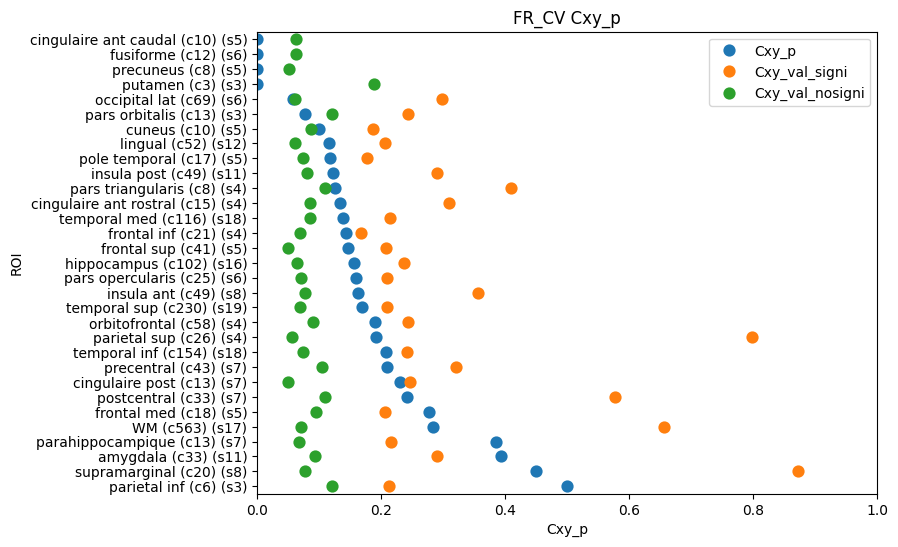

In [36]:
df_plot = df_Cxy_p

fig, ax = plt.subplots(figsize = (8,6))
g = sns.pointplot(data=df_plot , x='Cxy_p', y='ROI', ax=ax, join=False, order=df_plot.sort_values('Cxy_p').ROI, label='Cxy_p')
g = sns.pointplot(data=df_plot , x='Cxy_val_signi', y='ROI', ax=ax, join=False, order=df_plot.sort_values('Cxy_p').ROI, label='Cxy_val_signi')
g = sns.pointplot(data=df_plot , x='Cxy_val_nosigni', y='ROI', ax=ax, join=False, order=df_plot.sort_values('Cxy_p').ROI, label='Cxy_val_nosigni')

ROI_labels = []

for ROI in df_plot.sort_values('Cxy_p').ROI:

    _count_plot = df_ROI_count_FR_CV.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
    _count_sujet = df_ROI_count_FR_CV.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
    ROI_labels.append(f'{ROI} (c{_count_plot}) (s{_count_sujet})')

g.set_yticks(range(len(ROI_labels)))
g.set_yticklabels(ROI_labels)
ax.tick_params(axis='y')

ax.set_title('FR_CV Cxy_p')
ax.set_xlim(0,1)

### Spearman / OLS allplot

In [16]:
def single_permutation(_df, x_obs, i):

    _vec_perm = []

    for row_i, row in _df.iterrows():

        _sujet = row['sujet']
        _pos_allowed = np.where(_df['sujet'] != _sujet)[0]
        _pos_allowed = np.array([i for i in _pos_allowed if i not in _vec_perm])
        try:
            _vec_perm.append(_pos_allowed[np.random.randint(_pos_allowed.size)]) 
        except:
            _pos_missing = np.array([i for i in range(_df.shape[0]) if i not in _vec_perm])
            _vec_perm.append(_pos_missing[np.random.randint(_pos_missing.size)]) 

    _vec_perm = np.array(_vec_perm)   
    y_perm = _df['Cxy'].values[_vec_perm]
    _rho, _ = scipy.stats.spearmanr(x_obs, y_perm)
    
    return _rho

def spearman_permutation_test_parallel(_df, n_perm, percentile_thresh_list, n_jobs=20):
    x_obs, y_obs = _df['Cxy'].values, _df['resp'].values
    rho_obs, _ = scipy.stats.spearmanr(x_obs, y_obs)

    null_dist = joblib.Parallel(n_jobs=n_jobs)(
        joblib.delayed(single_permutation)(_df, x_obs, i)
        for i in range(n_perm)
    )

    null_dist = np.array(null_dist)
    lower, upper = np.percentile(null_dist, percentile_thresh_list)
    signi = rho_obs < lower or rho_obs > upper

    return rho_obs, signi

def run_one_roi(ROI, df, n_perm, percentile_thresh_list):
    _df = df.query(f"ROI == '{ROI}'")[['Cxy', 'resp', 'sujet']]
    rho, signi = spearman_permutation_test_parallel(_df, n_perm, percentile_thresh_list)
    print(f"{ROI} done")
    return {'ROI': ROI, 'rho': rho, 'signi': signi}

percentile_thresh_list = [2.5, 97.5]
n_perm_spearman = 1000

results = [run_one_roi(ROI, df_Cxy_FR_CV, n_perm_spearman, percentile_thresh_list)
           for ROI in Cxy_ROI_list_FR_CV_filt]

df_spearman_FR_CV = pd.DataFrame(results)


temporal sup done
amygdala done
temporal med done
hippocampus done
temporal inf done
parahippocampique done
pole temporal done
putamen done
insula post done
lingual done
WM done
cingulaire post done
precuneus done
supramarginal done
fusiforme done
cuneus done
occipital lat done
precentral done
postcentral done
insula ant done
pars opercularis done
frontal sup done
orbitofrontal done
pars orbitalis done
pars triangularis done
cingulaire ant rostral done
frontal inf done
parietal inf done
parietal sup done
frontal med done
cingulaire ant caudal done


In [17]:
data = {'ROI' : [], 'coeff' : [], 'intercept' : [], 'pval' : [], 'p' : []}

for ROI in Cxy_ROI_list_FR_CV_filt:

    _df_OLS = df_Cxy_FR_CV.query(f"ROI == '{ROI}'")[['Cxy', 'resp']]

    x = _df_OLS['resp']
    y = _df_OLS['Cxy']

    x = sm.add_constant(x)

    mdl = sm.OLS(y, x).fit()
    mdl_fit = mdl.predict(x) 

    coeff = pd.read_html(mdl.summary().tables[1].as_html(), header=0, index_col=0)[0]['coef'].values[-1]
    intercept = pd.read_html(mdl.summary().tables[1].as_html(), header=0, index_col=0)[0]['coef'].values[0]
    pval = pd.read_html(mdl.summary().tables[1].as_html(), header=0, index_col=0)[0]['P>|t|'].values[-1]

    if pval < 0.05:

        p = 1

    else:

        p = 0

    data['ROI'].append(ROI)
    data['coeff'].append(coeff)
    data['intercept'].append(intercept)
    data['pval'].append(pval)
    data['p'].append(p)


df_OLS = pd.DataFrame(data)

/tmp/ipykernel_3811780/1212554873.py:15: FutureWarning: Passing literal html to 'read_html' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  coeff = pd.read_html(mdl.summary().tables[1].as_html(), header=0, index_col=0)[0]['coef'].values[-1]
/tmp/ipykernel_3811780/1212554873.py:16: FutureWarning: Passing literal html to 'read_html' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  intercept = pd.read_html(mdl.summary().tables[1].as_html(), header=0, index_col=0)[0]['coef'].values[0]
/tmp/ipykernel_3811780/1212554873.py:17: FutureWarning: Passing literal html to 'read_html' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  pval = pd.read_html(mdl.summary().tables[1].as_html(), header=0, index_col=0)[0]['P>|t|'].values[-1]
/tmp/ipykernel_3811780/1212554873.py:15: FutureWarning: Pa

In [21]:
df_OLSSP_FR_CV = df_spearman_FR_CV.copy()
df_OLSSP_FR_CV['OLS_a'] = df_OLS['coeff']

In [215]:
df_spearman_FR_CV.sort_values('rho', ascending=False).query(f"signi == True")

,ROI,rho,signi
26,frontal inf,0.429661,True
1,amygdala,0.399034,True
2,temporal med,0.160042,True
3,hippocampus,-0.345009,True
22,orbitofrontal,-0.428323,True
10,WM,-0.450176,True
23,pars orbitalis,-0.687209,True


/tmp/ipykernel_733452/3100301525.py:16: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ROI_labels)


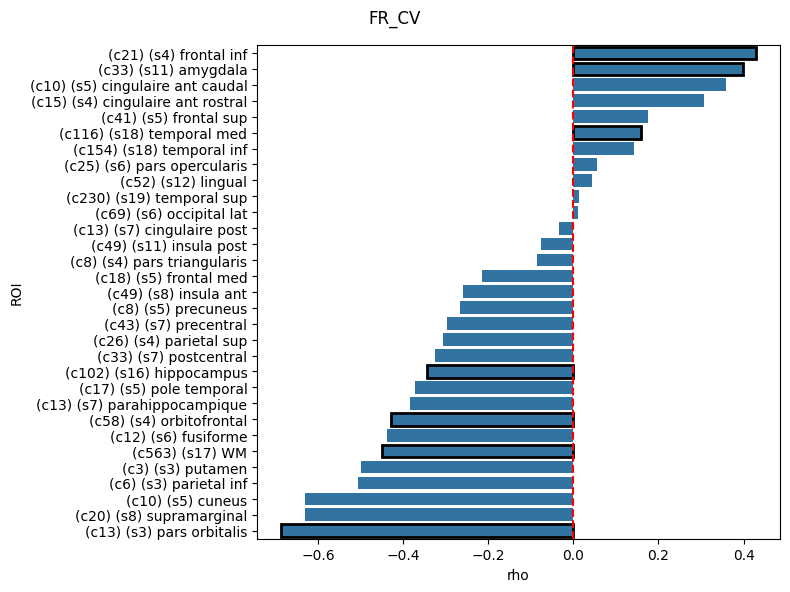

In [216]:
df_plot = df_spearman_FR_CV.sort_values('rho', ascending=False)

ROI_labels = []
for ROI in df_plot['ROI'].unique():
    _count_plot = df_ROI_count_FR_CV.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
    _count_sujet = df_ROI_count_FR_CV.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
    ROI_labels.append(f"(c{_count_plot}) (s{_count_sujet}) {ROI}")

plt.figure(figsize=(8, 6))
ax = sns.barplot(data=df_plot, x='rho', y='ROI', order=df_plot['ROI'])

# Horizontal line at 0
ax.axvline(0, color='r', linestyle='--')

# Set custom x-tick labels
ax.set_yticklabels(ROI_labels)

# Add black border to bars where p == 1
for patch, (_, row) in zip(ax.patches, df_plot.iterrows()):
    if row['signi'] == True:
        patch.set_edgecolor('black')
        patch.set_linewidth(2)
    else:
        patch.set_edgecolor('none')  # no border for non-significant bars

plt.suptitle(f"FR_CV")
plt.tight_layout()
plt.show()

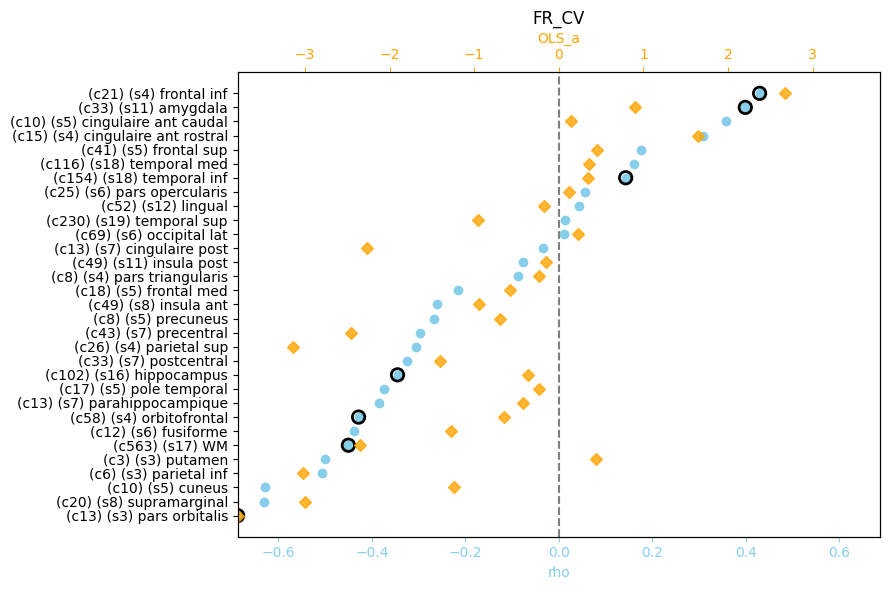

In [34]:
# Sort DataFrame
df_plot = df_OLSSP_FR_CV.sort_values('rho', ascending=True).reset_index(drop=True)

# Build y labels
ROI_labels = []
for ROI in df_plot['ROI']:
    _count_plot = df_ROI_count_FR_CV.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
    _count_sujet = df_ROI_count_FR_CV.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
    ROI_labels.append(f"(c{_count_plot}) (s{_count_sujet}) {ROI}")

# Create figure
fig, ax1 = plt.subplots(figsize=(9, 6))
ax2 = ax1.twiny()

y_pos = range(len(df_plot))

# Plot rho
ax1.scatter(df_plot['rho'], y_pos, color='skyblue', label='rho', zorder=3)

# Highlight significant points
for i, signi in enumerate(df_plot['signi']):
    if signi:
        ax1.scatter(df_plot['rho'].iloc[i], y_pos[i], facecolors='none', edgecolors='black', s=80, linewidths=2, zorder=4)

# Plot OLS_a
ax2.scatter(df_plot['OLS_a'], y_pos, color='orange', alpha=0.8, label='OLS_a', zorder=2, marker='D')

# Align 0 by setting symmetric limits on both axes
# Use the max absolute value across both axes
x1_vals = df_plot['rho']
x2_vals = df_plot['OLS_a']
max_range_x1 = max(abs(x1_vals).min(), abs(x1_vals).max())
max_range_x2 = max(abs(x2_vals).min(), abs(x2_vals).max())

ax1.set_xlim(-max_range_x1, max_range_x1)
ax2.set_xlim(-max_range_x2, max_range_x2)

# Add zero lines
ax1.axvline(0, color='gray', linestyle='--')
ax2.axvline(0, color='gray', linestyle='--', alpha=0.5)

# Formatting
ax1.set_yticks(y_pos)
ax1.set_yticklabels(ROI_labels)
ax1.set_xlabel("rho", color='skyblue')
ax2.set_xlabel("OLS_a", color='orange')

ax1.tick_params(axis='x', colors='skyblue')
ax2.tick_params(axis='x', colors='orange')
ax1.set_title("FR_CV")

plt.tight_layout()
plt.show()


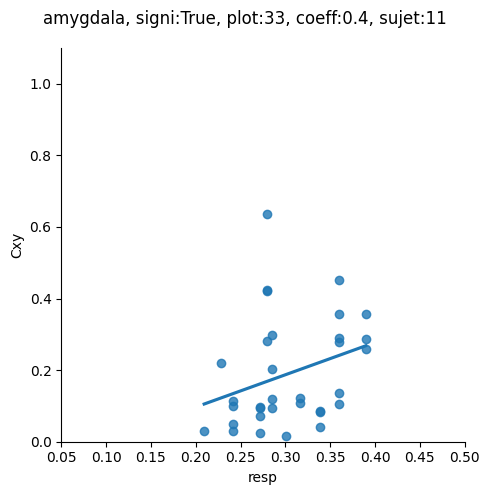

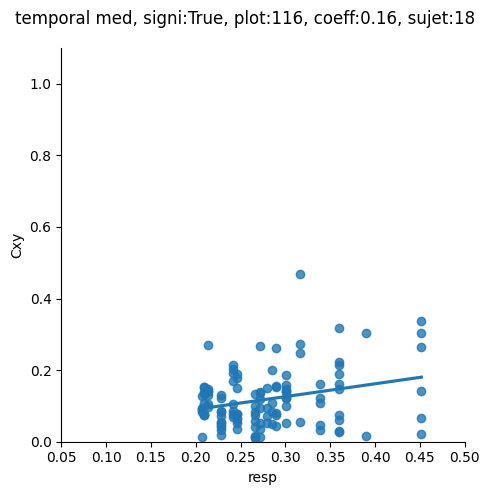

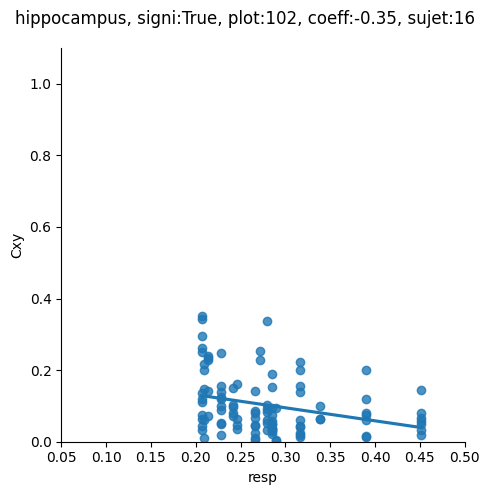

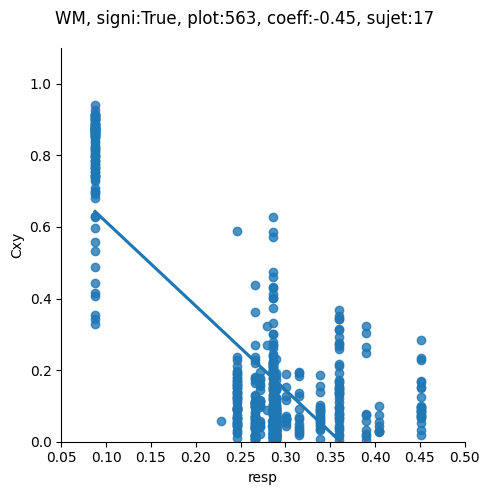

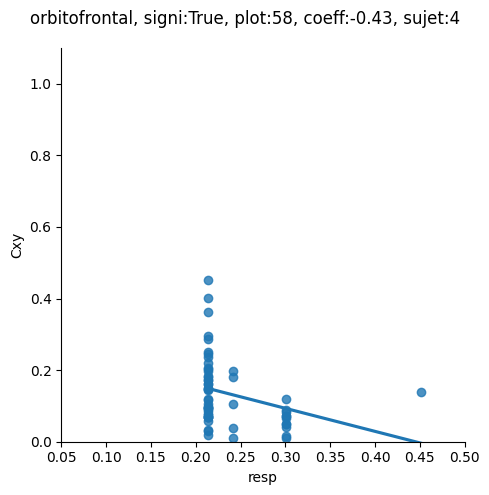

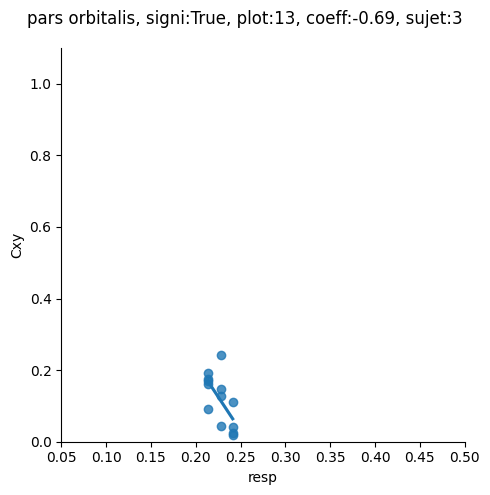

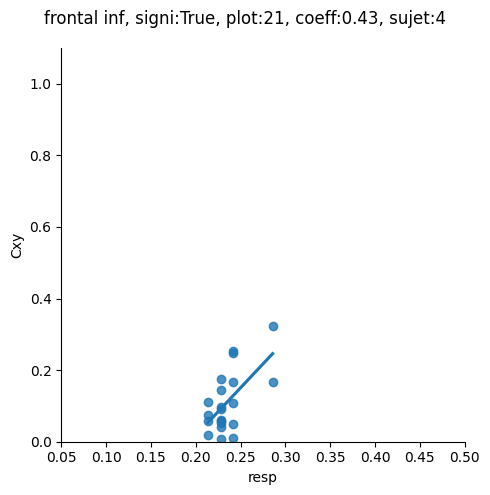

In [217]:
for ROI in Cxy_ROI_list_FR_CV_filt:

    if df_spearman_FR_CV.query(f"ROI == '{ROI}'")['signi'].values == False:
        continue
    
    pval = df_spearman_FR_CV.query(f"ROI == '{ROI}'")['signi'].values[0]
    sns.lmplot(x="resp", y="Cxy", data=df_Cxy_FR_CV.query(f"ROI == '{ROI}'"),  ci=None)
    _coeff = df_spearman_FR_CV.query(f"ROI == '{ROI}'")['rho'].values[0]
    plt.ylim(0,1.1)
    plt.xlim(0.05,0.5)
    _count_plot = df_ROI_count_FR_CV.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
    _count_sujet = df_ROI_count_FR_CV.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
    plt.suptitle(f"{ROI}, signi:{pval}, plot:{_count_plot}, coeff:{np.round(_coeff, 2)}, sujet:{_count_sujet}")
    plt.tight_layout()

/home/jules.granget/myenvs/py311/lib/python3.11/site-packages/seaborn/axisgrid.py:453: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=figsize)


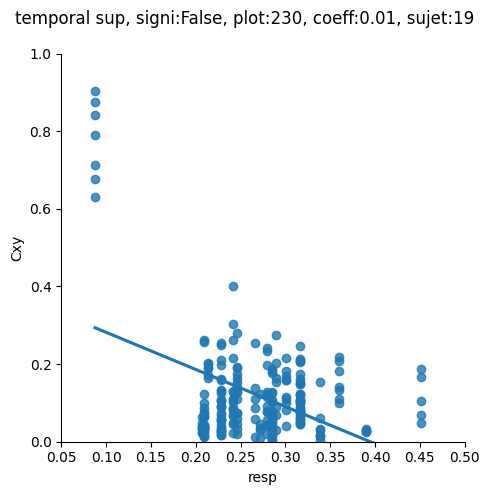

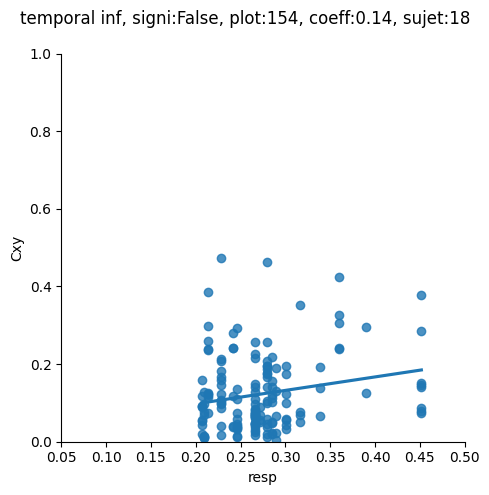

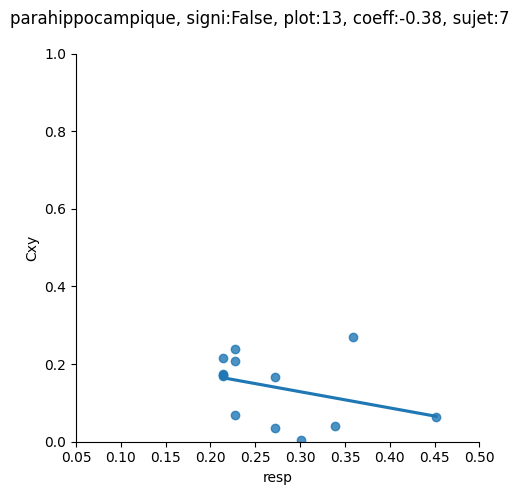

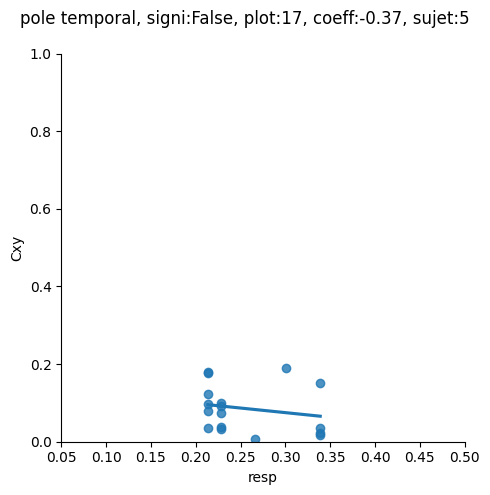

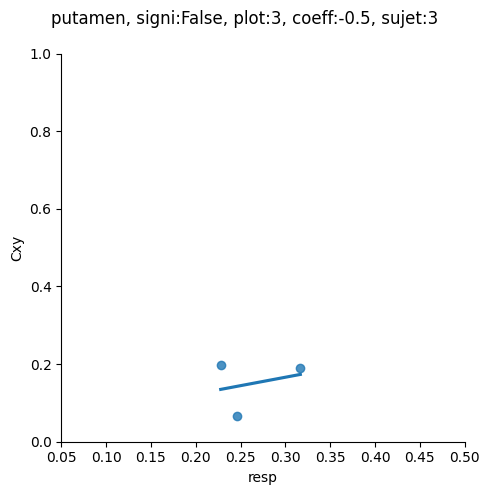

...

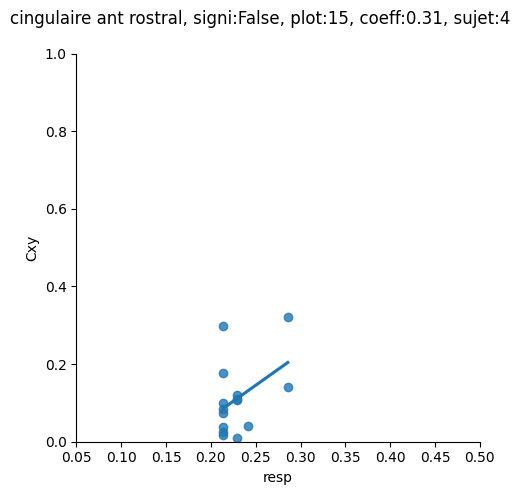

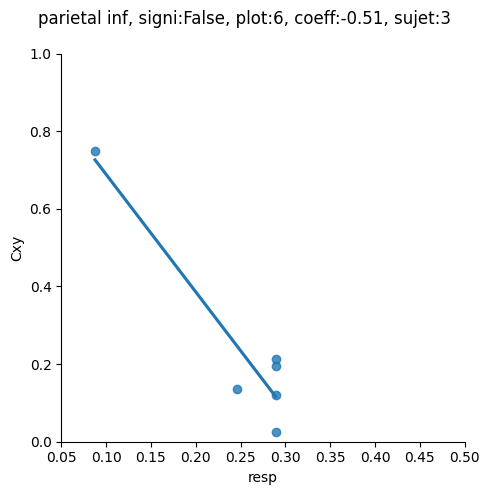

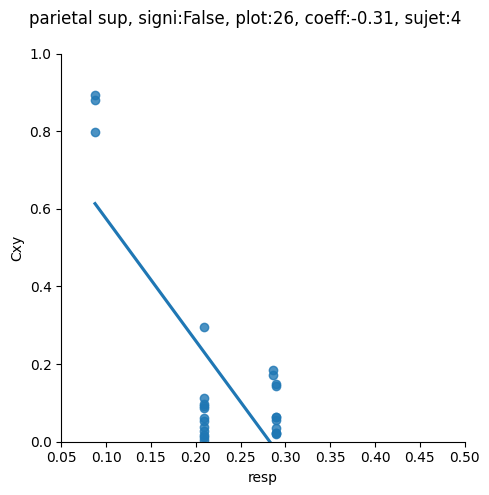

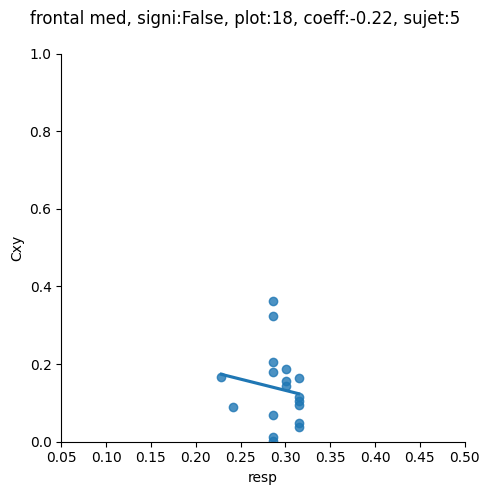

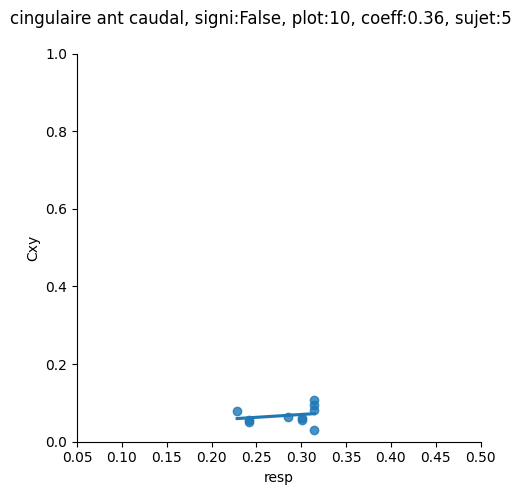

In [218]:
for ROI in Cxy_ROI_list_FR_CV_filt:

    if df_spearman_FR_CV.query(f"ROI == '{ROI}'")['signi'].values == True:
        continue
    
    pval = df_spearman_FR_CV.query(f"ROI == '{ROI}'")['signi'].values[0]
    sns.lmplot(x="resp", y="Cxy", data=df_Cxy_FR_CV.query(f"ROI == '{ROI}'"),  ci=None)
    _coeff = df_spearman_FR_CV.query(f"ROI == '{ROI}'")['rho'].values[0]
    plt.ylim(0,1)
    plt.xlim(0.05,0.5)
    _count_plot = df_ROI_count_FR_CV.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
    _count_sujet = df_ROI_count_FR_CV.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
    plt.suptitle(f"{ROI}, signi:{pval}, plot:{_count_plot}, coeff:{np.round(_coeff, 2)}, sujet:{_count_sujet}")
    plt.tight_layout()

## ATTENTION

### Z stats

In [37]:
data_df = {'cond' : [], 'ROI' : [], 'Cxy_p' : [], 'pval' : []}

for cond in ['FR_CV', 'RD_CV']:

    for ROI in Cxy_ROI_list_ALLCOND_filt:
        
        signi = (df_Cxy_ALLCOND.query(f"cond == '{cond}' and ROI == '{ROI}'")['Cxy'] > df_Cxy_ALLCOND.query(f"cond == '{cond}' and ROI == '{ROI}'")['Cxy_surr']).sum()
        prop_Cxy = signi/df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]

        counts = [(df_Cxy_ALLCOND.query(f"cond == 'FR_CV' and ROI == '{ROI}'")['Cxy'] > df_Cxy_ALLCOND.query(f"cond == 'FR_CV' and ROI == '{ROI}'")['Cxy_surr']).sum(), 
          (df_Cxy_ALLCOND.query(f"cond == 'RD_CV' and ROI == '{ROI}'")['Cxy'] > df_Cxy_ALLCOND.query(f"cond == 'RD_CV' and ROI == '{ROI}'")['Cxy_surr']).sum()]
        nobs = [df_Cxy_ALLCOND.query(f"cond == 'FR_CV' and ROI == '{ROI}'").shape[0], df_Cxy_ALLCOND.query(f"cond == 'FR_CV' and ROI == '{ROI}'").shape[0]]
        stat, pval = proportions_ztest(count=counts, nobs=nobs)
        
        data_df['cond'].append(cond)
        data_df['ROI'].append(ROI)
        data_df['Cxy_p'].append(prop_Cxy)
        data_df['pval'].append(pval)

df_Cxy_p = pd.DataFrame(data_df) 

Text(0.5, 1.0, 'Z = -2.653, p = 0.008')

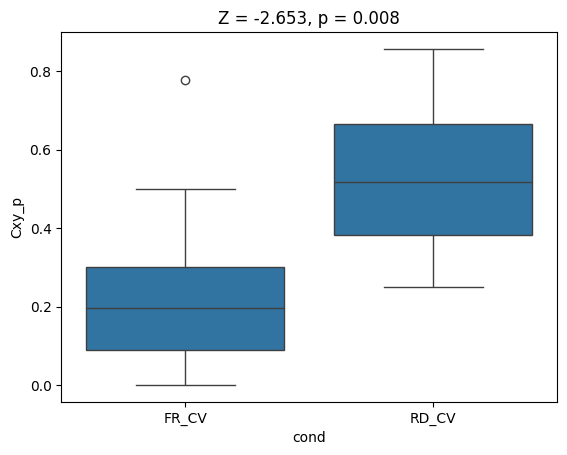

In [220]:
sns.boxplot(data=df_Cxy_p, x="cond", y="Cxy_p")
plt.title(f"Z = {stat:.3f}, p = {pval:.3f}")

In [221]:
df_Cxy_p.query(f"cond == 'RD_CV' and pval < 0.05")

,cond,ROI,Cxy_p,pval
22,RD_CV,temporal sup,0.377193,2.065794e-03
24,RD_CV,temporal med,0.352941,7.507956e-04
25,RD_CV,hippocampus,0.440678,1.095518e-02
26,RD_CV,temporal inf,0.364583,6.061370e-03
28,RD_CV,insula post,0.576923,2.593831e-05
29,RD_CV,lingual,0.536585,6.475497e-05
30,RD_CV,WM,0.646617,1.959860e-17
31,RD_CV,cingulaire post,0.857143,3.075356e-02
35,RD_CV,cuneus,0.833333,3.414791e-03
36,RD_CV,occipital lat,0.372093,9.265630e-06


/tmp/ipykernel_733452/3132109093.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ROI_labels)


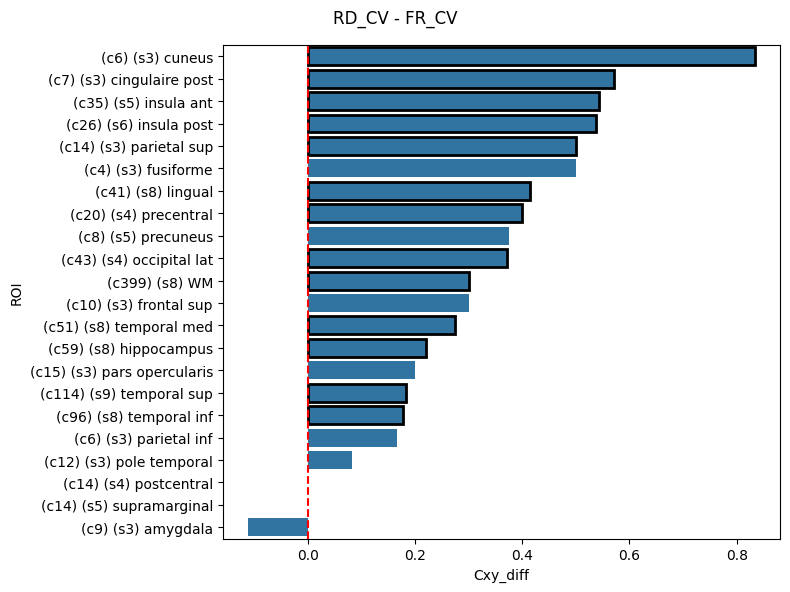

In [222]:
df_Cxy_diff = pd.DataFrame({'ROI' : df_Cxy_p.query(f"cond == 'RD_CV'")['ROI'].values, 
                            'Cxy_diff' : df_Cxy_p.query(f"cond == 'RD_CV'")['Cxy_p'].values - df_Cxy_p.query(f"cond == 'FR_CV'")['Cxy_p'].values,
                            'pval' : df_Cxy_p.query(f"cond == 'RD_CV'")['pval'].values})
df_plot = df_Cxy_diff.sort_values('Cxy_diff', ascending=False)

pval_thresh = 0.05

ROI_labels = []
for ROI in df_plot['ROI'].unique():
    _count_plot = df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
    _count_sujet = df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
    ROI_labels.append(f"(c{_count_plot}) (s{_count_sujet}) {ROI}")

plt.figure(figsize=(8, 6))
ax = sns.barplot(data=df_plot, x='Cxy_diff', y='ROI')

# Horizontal line at 0
ax.axvline(0, color='r', linestyle='--')

# Set custom x-tick labels
ax.set_yticklabels(ROI_labels)

# Add black border to bars where p == 1
for patch, (_, row) in zip(ax.patches, df_plot.iterrows()):
    if row['pval'] < pval_thresh:
        patch.set_edgecolor('black')
        patch.set_linewidth(2)
    else:
        patch.set_edgecolor('none')  # no border for non-significant bars

plt.suptitle(f"RD_CV - FR_CV")
plt.tight_layout()
plt.show()

### RESPI FOLLOW SPEARMAN/OLS

In [38]:
def single_permutation(_df, x_obs, i):

    _vec_perm = []

    for row_i, row in _df.iterrows():

        _sujet = row['sujet']
        _pos_allowed = np.where(_df['sujet'] != _sujet)[0]
        _pos_allowed = np.array([i for i in _pos_allowed if i not in _vec_perm])
        try:
            _vec_perm.append(_pos_allowed[np.random.randint(_pos_allowed.size)]) 
        except:
            _pos_missing = np.array([i for i in range(_df.shape[0]) if i not in _vec_perm])
            _vec_perm.append(_pos_missing[np.random.randint(_pos_missing.size)]) 

    _vec_perm = np.array(_vec_perm)   
    y_perm = _df['Cxy'].values[_vec_perm]
    _rho, _ = scipy.stats.spearmanr(x_obs, y_perm)
    
    return _rho

def spearman_permutation_test_parallel(_df, n_perm, percentile_thresh_list, n_jobs=20):
    x_obs, y_obs = _df['Cxy'].values, _df['resp'].values
    rho_obs, _ = scipy.stats.spearmanr(x_obs, y_obs)

    null_dist = joblib.Parallel(n_jobs=n_jobs)(
        joblib.delayed(single_permutation)(_df, x_obs, i)
        for i in range(n_perm)
    )

    null_dist = np.array(null_dist)
    lower, upper = np.percentile(null_dist, percentile_thresh_list)
    signi = rho_obs < lower or rho_obs > upper

    return rho_obs, signi

def run_one_roi(ROI, df, n_perm, percentile_thresh_list):
    _df = df.query(f"ROI == '{ROI}'")[['Cxy', 'resp', 'sujet']]
    rho, signi = spearman_permutation_test_parallel(_df, n_perm, percentile_thresh_list)
    print(f"{ROI} done")
    return {'ROI': ROI, 'rho': rho, 'signi': signi}

percentile_thresh_list = [2.5, 97.5]
n_perm_spearman = 1000

results = [run_one_roi(ROI, df_Cxy_FR_CV, n_perm_spearman, percentile_thresh_list)
           for ROI in Cxy_ROI_list_FR_CV_filt]

df_spearman_FR_CV = pd.DataFrame(results)


temporal sup done
amygdala done
temporal med done
hippocampus done
temporal inf done
parahippocampique done
pole temporal done
putamen done
insula post done
lingual done
WM done
cingulaire post done
precuneus done
supramarginal done
fusiforme done
cuneus done
occipital lat done
precentral done
postcentral done
insula ant done
pars opercularis done
frontal sup done
orbitofrontal done
pars orbitalis done
pars triangularis done
cingulaire ant rostral done
frontal inf done
parietal inf done
parietal sup done
frontal med done
cingulaire ant caudal done


In [40]:
data = {'ROI' : [], 'coeff' : [], 'intercept' : [], 'pval' : [], 'p' : []}

for ROI in Cxy_ROI_list_FR_CV_filt:

    _df_OLS = df_Cxy_FR_CV.query(f"ROI == '{ROI}'")[['Cxy', 'resp']]

    x = _df_OLS['resp']
    y = _df_OLS['Cxy']

    x = sm.add_constant(x)

    mdl = sm.OLS(y, x).fit()
    mdl_fit = mdl.predict(x) 

    coeff = pd.read_html(mdl.summary().tables[1].as_html(), header=0, index_col=0)[0]['coef'].values[-1]
    intercept = pd.read_html(mdl.summary().tables[1].as_html(), header=0, index_col=0)[0]['coef'].values[0]
    pval = pd.read_html(mdl.summary().tables[1].as_html(), header=0, index_col=0)[0]['P>|t|'].values[-1]

    if pval < 0.05:

        p = 1

    else:

        p = 0

    data['ROI'].append(ROI)
    data['coeff'].append(coeff)
    data['intercept'].append(intercept)
    data['pval'].append(pval)
    data['p'].append(p)


df_OLS_FR_CV = pd.DataFrame(data)

/tmp/ipykernel_3811780/2759471597.py:15: FutureWarning: Passing literal html to 'read_html' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  coeff = pd.read_html(mdl.summary().tables[1].as_html(), header=0, index_col=0)[0]['coef'].values[-1]
/tmp/ipykernel_3811780/2759471597.py:16: FutureWarning: Passing literal html to 'read_html' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  intercept = pd.read_html(mdl.summary().tables[1].as_html(), header=0, index_col=0)[0]['coef'].values[0]
/tmp/ipykernel_3811780/2759471597.py:17: FutureWarning: Passing literal html to 'read_html' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  pval = pd.read_html(mdl.summary().tables[1].as_html(), header=0, index_col=0)[0]['P>|t|'].values[-1]
/tmp/ipykernel_3811780/2759471597.py:15: FutureWarning: Pa

In [39]:
def single_permutation(_df, x_obs, i):

    _vec_perm = []

    for row_i, row in _df.iterrows():

        _sujet = row['sujet']
        _pos_allowed = np.where(_df['sujet'] != _sujet)[0]
        _pos_allowed = np.array([i for i in _pos_allowed if i not in _vec_perm])
        try:
            _vec_perm.append(_pos_allowed[np.random.randint(_pos_allowed.size)]) 
        except:
            _pos_missing = np.array([i for i in range(_df.shape[0]) if i not in _vec_perm])
            _vec_perm.append(_pos_missing[np.random.randint(_pos_missing.size)]) 

    _vec_perm = np.array(_vec_perm)   
    y_perm = _df['Cxy'].values[_vec_perm]
    _rho, _ = scipy.stats.spearmanr(x_obs, y_perm)
    
    return _rho

def spearman_permutation_test_parallel(_df, n_perm, percentile_thresh_list, n_jobs=20):
    x_obs, y_obs = _df['Cxy'].values, _df['resp'].values
    rho_obs, _ = scipy.stats.spearmanr(x_obs, y_obs)

    null_dist = joblib.Parallel(n_jobs=n_jobs)(
        joblib.delayed(single_permutation)(_df, x_obs, i)
        for i in range(n_perm)
    )

    null_dist = np.array(null_dist)
    lower, upper = np.percentile(null_dist, percentile_thresh_list)
    signi = rho_obs < lower or rho_obs > upper

    return rho_obs, signi

def run_one_roi(ROI, df, n_perm, percentile_thresh_list):
    _df = df.query(f"ROI == '{ROI}'")[['Cxy', 'resp', 'sujet']]
    rho, signi = spearman_permutation_test_parallel(_df, n_perm, percentile_thresh_list)
    print(f"{ROI} done")
    return {'ROI': ROI, 'rho': rho, 'signi': signi}

percentile_thresh_list = [2.5, 97.5]
n_perm_spearman = 1000

results = [run_one_roi(ROI, df_Cxy_ALLCOND.query(f"cond == 'RD_CV'"), n_perm_spearman, percentile_thresh_list)
           for ROI in Cxy_ROI_list_ALLCOND_filt]

df_spearman_RD_CV = pd.DataFrame(results)


temporal sup done
amygdala done
temporal med done
hippocampus done
temporal inf done
pole temporal done
insula post done
lingual done
WM done
cingulaire post done
precuneus done
supramarginal done
fusiforme done
cuneus done
occipital lat done
precentral done
postcentral done
insula ant done
pars opercularis done
frontal sup done
parietal inf done
parietal sup done


In [41]:
data = {'ROI' : [], 'coeff' : [], 'intercept' : [], 'pval' : [], 'p' : []}

for ROI in Cxy_ROI_list_ALLCOND_filt:

    _df_OLS = df_Cxy_ALLCOND.query(f"ROI == '{ROI}' and cond == 'RD_CV'")[['Cxy', 'resp']]

    x = _df_OLS['resp']
    y = _df_OLS['Cxy']

    x = sm.add_constant(x)

    mdl = sm.OLS(y, x).fit()
    mdl_fit = mdl.predict(x) 

    coeff = pd.read_html(mdl.summary().tables[1].as_html(), header=0, index_col=0)[0]['coef'].values[-1]
    intercept = pd.read_html(mdl.summary().tables[1].as_html(), header=0, index_col=0)[0]['coef'].values[0]
    pval = pd.read_html(mdl.summary().tables[1].as_html(), header=0, index_col=0)[0]['P>|t|'].values[-1]

    if pval < 0.05:

        p = 1

    else:

        p = 0

    data['ROI'].append(ROI)
    data['coeff'].append(coeff)
    data['intercept'].append(intercept)
    data['pval'].append(pval)
    data['p'].append(p)


df_OLS_RD_CV = pd.DataFrame(data)

/tmp/ipykernel_3811780/4015157719.py:15: FutureWarning: Passing literal html to 'read_html' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  coeff = pd.read_html(mdl.summary().tables[1].as_html(), header=0, index_col=0)[0]['coef'].values[-1]
/tmp/ipykernel_3811780/4015157719.py:16: FutureWarning: Passing literal html to 'read_html' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  intercept = pd.read_html(mdl.summary().tables[1].as_html(), header=0, index_col=0)[0]['coef'].values[0]
/tmp/ipykernel_3811780/4015157719.py:17: FutureWarning: Passing literal html to 'read_html' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  pval = pd.read_html(mdl.summary().tables[1].as_html(), header=0, index_col=0)[0]['P>|t|'].values[-1]
/home/jules.granget/myenvs/py311/lib/python3.11/site-packa

In [225]:
df_spearman_FR_CV.sort_values('rho', ascending=False).query(f"signi == True")

,ROI,rho,signi
26,frontal inf,0.429661,True
1,amygdala,0.399034,True
4,temporal inf,0.143069,True
3,hippocampus,-0.345009,True
22,orbitofrontal,-0.428323,True
10,WM,-0.450176,True
13,supramarginal,-0.630096,True
23,pars orbitalis,-0.687209,True


In [226]:
df_spearman_RD_CV.sort_values('rho', ascending=False).query(f"signi == True")

,ROI,rho,signi
1,amygdala,0.730297,True
13,cuneus,0.493771,True
14,occipital lat,0.309803,True
19,frontal sup,0.259500,True
7,lingual,-0.012568,True
8,WM,-0.432536,True
11,supramarginal,-0.718533,True
21,parietal sup,-0.794855,True
20,parietal inf,-0.845154,True


/tmp/ipykernel_733452/2714550717.py:16: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ROI_labels)


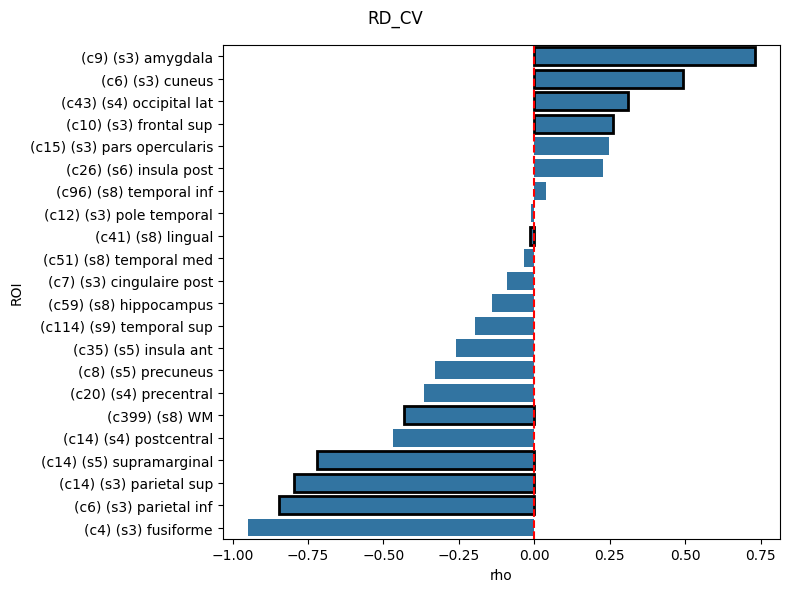

In [227]:
df_plot = df_spearman_RD_CV.sort_values('rho', ascending=False)

ROI_labels = []
for ROI in df_plot['ROI'].unique():
    _count_plot = df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
    _count_sujet = df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
    ROI_labels.append(f"(c{_count_plot}) (s{_count_sujet}) {ROI}")

plt.figure(figsize=(8, 6))
ax = sns.barplot(data=df_plot, x='rho', y='ROI')

# Horizontal line at 0
ax.axvline(0, color='r', linestyle='--')

# Set custom x-tick labels
ax.set_yticklabels(ROI_labels)

# Add black border to bars where p == 1
for patch, (_, row) in zip(ax.patches, df_plot.iterrows()):
    if row['signi'] == True:
        patch.set_edgecolor('black')
        patch.set_linewidth(2)
    else:
        patch.set_edgecolor('none')  # no border for non-significant bars

plt.suptitle(f"RD_CV")
plt.tight_layout()
plt.show()

In [45]:
df_OLSSP_FR_CV = df_spearman_FR_CV.copy()
df_OLSSP_FR_CV['OLS_a'] = df_OLS_FR_CV['coeff']

In [46]:
df_OLSSP_RD_CV = df_spearman_RD_CV.copy()
df_OLSSP_RD_CV['OLS_a'] = df_OLS_RD_CV['coeff']

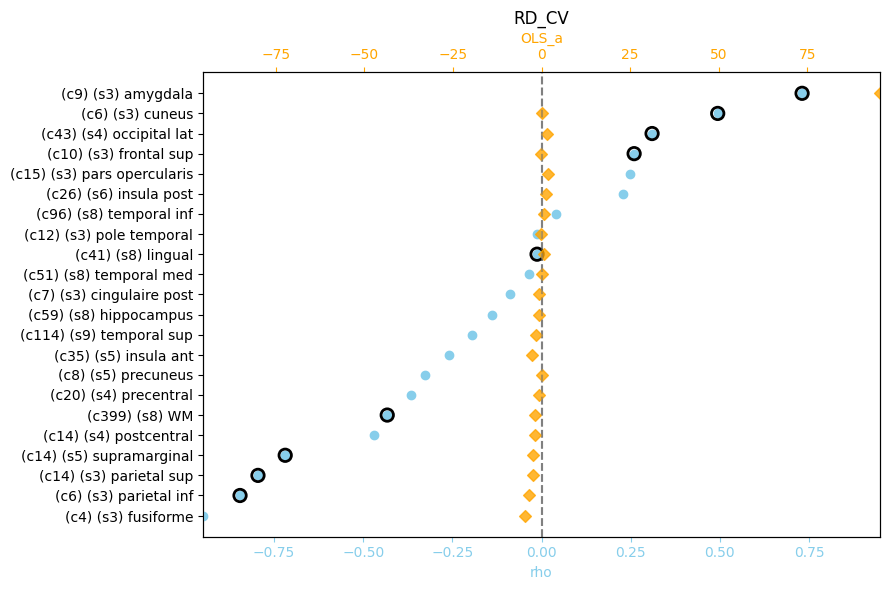

In [48]:
# Sort DataFrame
df_plot = df_OLSSP_RD_CV.sort_values('rho', ascending=True).reset_index(drop=True)

# Build y labels
ROI_labels = []
for ROI in df_plot['ROI']:
    _count_plot = df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
    _count_sujet = df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
    ROI_labels.append(f"(c{_count_plot}) (s{_count_sujet}) {ROI}")

# Create figure
fig, ax1 = plt.subplots(figsize=(9, 6))
ax2 = ax1.twiny()

y_pos = range(len(df_plot))

# Plot rho
ax1.scatter(df_plot['rho'], y_pos, color='skyblue', label='rho', zorder=3)

# Highlight significant points
for i, signi in enumerate(df_plot['signi']):
    if signi:
        ax1.scatter(df_plot['rho'].iloc[i], y_pos[i], facecolors='none', edgecolors='black', s=80, linewidths=2, zorder=4)

# Plot OLS_a
ax2.scatter(df_plot['OLS_a'], y_pos, color='orange', alpha=0.8, label='OLS_a', zorder=2, marker='D')

# Align 0 by setting symmetric limits on both axes
# Use the max absolute value across both axes
x1_vals = df_plot['rho']
x2_vals = df_plot['OLS_a']
max_range_x1 = max(abs(x1_vals).min(), abs(x1_vals).max())
max_range_x2 = max(abs(x2_vals).min(), abs(x2_vals).max())

ax1.set_xlim(-max_range_x1, max_range_x1)
ax2.set_xlim(-max_range_x2, max_range_x2)

# Add zero lines
ax1.axvline(0, color='gray', linestyle='--')
ax2.axvline(0, color='gray', linestyle='--', alpha=0.5)

# Formatting
ax1.set_yticks(y_pos)
ax1.set_yticklabels(ROI_labels)
ax1.set_xlabel("rho", color='skyblue')
ax2.set_xlabel("OLS_a", color='orange')

ax1.tick_params(axis='x', colors='skyblue')
ax2.tick_params(axis='x', colors='orange')
ax1.set_title("RD_CV")

plt.tight_layout()
plt.show()


In [52]:
df_OLS_FR_CV['cond'] = ['FR_CV'] * df_OLS_FR_CV.shape[0]
df_OLS_RD_CV['cond'] = ['RD_CV'] * df_OLS_RD_CV.shape[0]
df_OLS_both_CV = pd.concat([df_OLS_FR_CV, df_OLS_RD_CV])

In [58]:
df_spearman_FR_CV['cond'] = ['FR_CV'] * df_spearman_FR_CV.shape[0]
df_spearman_RD_CV['cond'] = ['RD_CV'] * df_spearman_RD_CV.shape[0]
df_spearman_both_CV = pd.concat([df_spearman_FR_CV, df_spearman_RD_CV])

In [59]:
ROI_FR_CV_not_in_RD_CV = [ROI for ROI in df_spearman_FR_CV['ROI'].unique() if ROI not in df_spearman_RD_CV['ROI'].unique()]

In [60]:
df_spearman_both_CV = df_spearman_both_CV.query(f"ROI not in {ROI_FR_CV_not_in_RD_CV}")
df_OLS_both_CV = df_OLS_both_CV.query(f"ROI not in {ROI_FR_CV_not_in_RD_CV}")

In [231]:
df_spearman_both_CV.query(f"signi == True")

,ROI,rho,signi,cond
1,amygdala,0.399034,True,FR_CV
3,hippocampus,-0.345009,True,FR_CV
4,temporal inf,0.143069,True,FR_CV
10,WM,-0.450176,True,FR_CV
13,supramarginal,-0.630096,True,FR_CV
1,amygdala,0.730297,True,RD_CV
7,lingual,-0.012568,True,RD_CV
8,WM,-0.432536,True,RD_CV
11,supramarginal,-0.718533,True,RD_CV
13,cuneus,0.493771,True,RD_CV


/tmp/ipykernel_733452/2001197675.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ROI_labels)


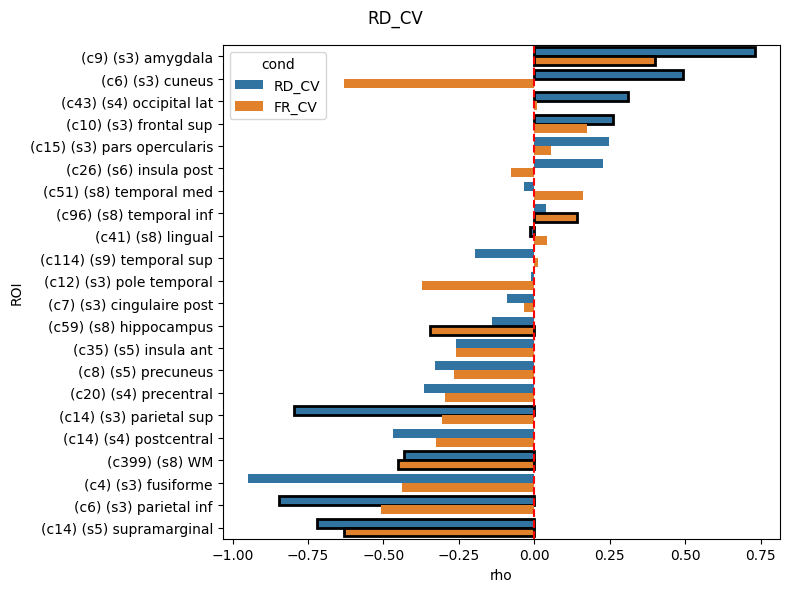

In [232]:
# Sort the data
df_plot = df_spearman_both_CV.sort_values('rho', ascending=False)

# Build ROI labels
ROI_labels = []
for ROI in df_plot['ROI'].unique():
    _count_plot = df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
    _count_sujet = df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
    ROI_labels.append(f"(c{_count_plot}) (s{_count_sujet}) {ROI}")

# Plot
plt.figure(figsize=(8, 6))
ax = sns.barplot(data=df_plot, x='rho', y='ROI', hue='cond', dodge=True)

# Vertical line at 0
ax.axvline(0, color='r', linestyle='--')

# Set custom labels
ax.set_yticklabels(ROI_labels)

# Loop through bars and highlight significant ones
for patch in ax.patches:
    rho = patch.get_width()

    # Match row in df_plot based on exact rho value
    match = df_plot[df_plot['rho'] == rho]

    if not match.empty and match.iloc[0]['signi']:
        patch.set_edgecolor('black')
        patch.set_linewidth(2)
    else:
        patch.set_edgecolor('none')

plt.suptitle("RD_CV")
plt.tight_layout()
plt.show()


/tmp/ipykernel_3811780/1302222403.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ROI_labels)


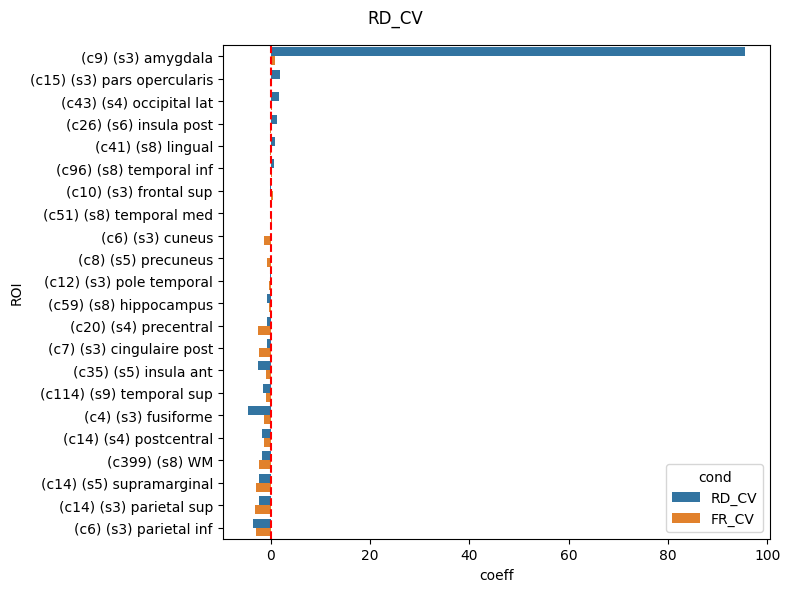

In [62]:
# Sort the data
df_plot = df_OLS_both_CV.sort_values('coeff', ascending=False)

# Build ROI labels
ROI_labels = []
for ROI in df_plot['ROI'].unique():
    _count_plot = df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
    _count_sujet = df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
    ROI_labels.append(f"(c{_count_plot}) (s{_count_sujet}) {ROI}")

# Plot
plt.figure(figsize=(8, 6))
ax = sns.barplot(data=df_plot, x='coeff', y='ROI', hue='cond', dodge=True)

# Vertical line at 0
ax.axvline(0, color='r', linestyle='--')

# Set custom labels
ax.set_yticklabels(ROI_labels)

# Loop through bars and highlight significant ones
# for patch in ax.patches:
#     coeff = patch.get_width()

#     # Match row in df_plot based on exact coeff value
#     match = df_plot[df_plot['coeff'] == coeff]

#     if not match.empty and match.iloc[0]['signi']:
#         patch.set_edgecolor('black')
#         patch.set_linewidth(2)
#     else:
#         patch.set_edgecolor('none')

plt.suptitle("RD_CV")
plt.tight_layout()
plt.show()


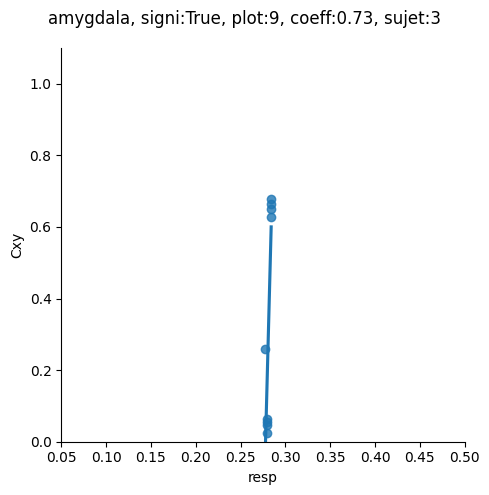

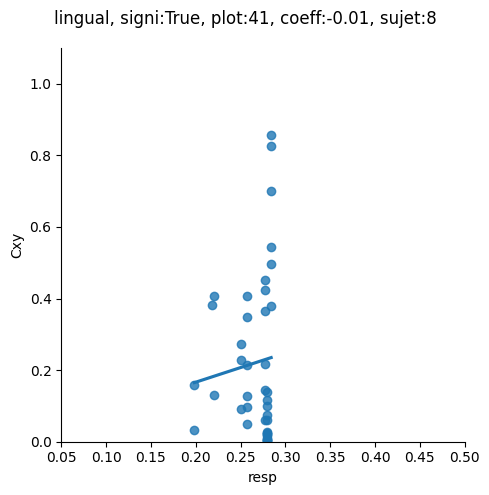

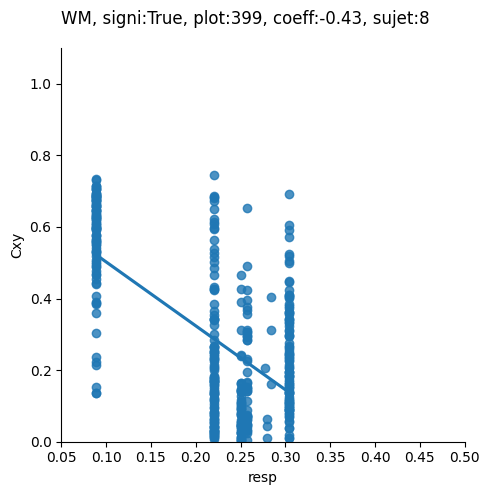

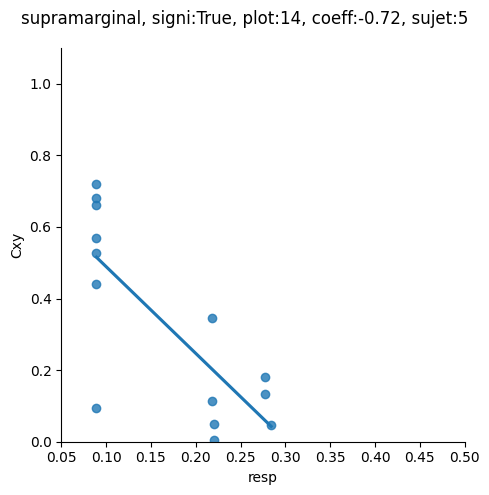

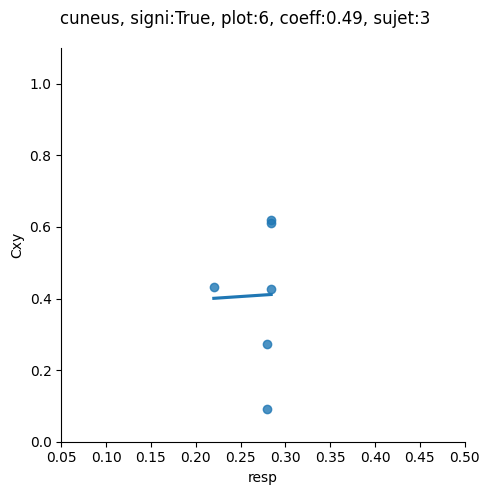

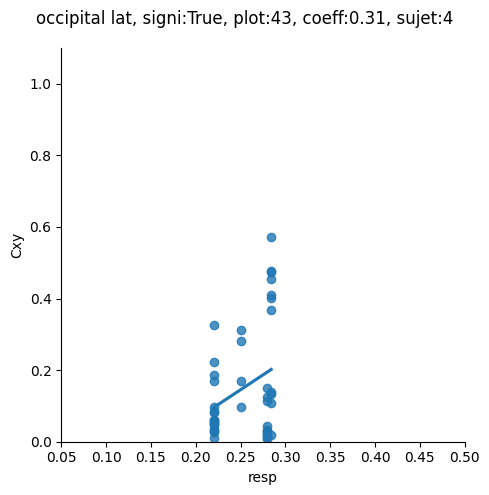

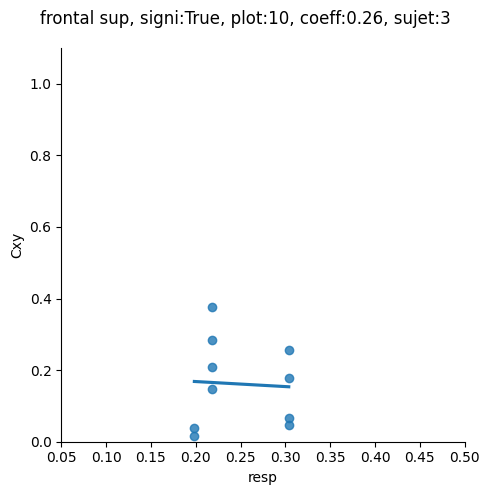

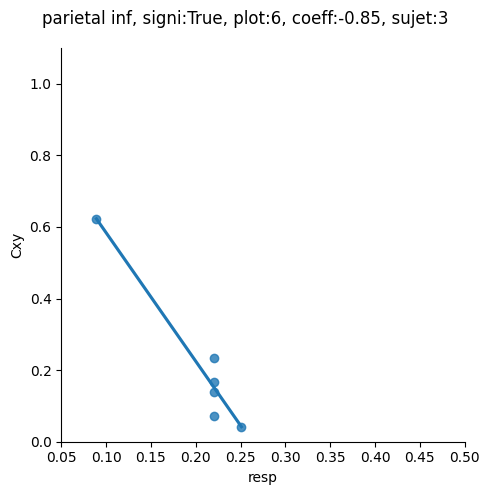

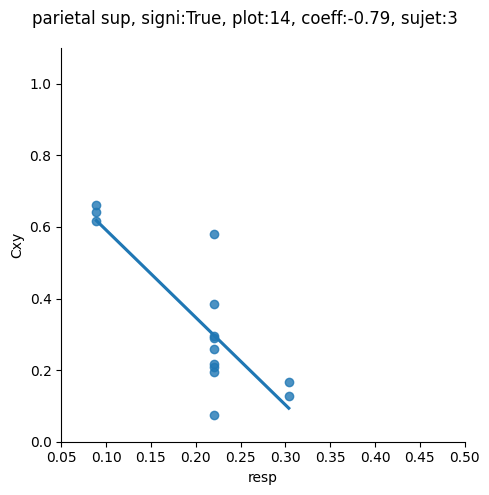

In [51]:
for ROI in Cxy_ROI_list_ALLCOND_filt:

    if df_spearman_RD_CV.query(f"ROI == '{ROI}'")['signi'].values == False:
        continue
    
    pval = df_spearman_RD_CV.query(f"ROI == '{ROI}'")['signi'].values[0]
    sns.lmplot(x="resp", y="Cxy", data=df_Cxy_ALLCOND.query(f"ROI == '{ROI}' and cond == 'RD_CV'"),  ci=None)
    _coeff = df_spearman_RD_CV.query(f"ROI == '{ROI}'")['rho'].values[0]
    plt.ylim(0,1.1)
    plt.xlim(0.05,0.5)
    _count_plot = df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
    _count_sujet = df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
    plt.suptitle(f"{ROI}, signi:{pval}, plot:{_count_plot}, coeff:{np.round(_coeff, 2)}, sujet:{_count_sujet}")
    plt.tight_layout()

## ALL CONDITIONS

### PROPORTION

In [233]:
data_df = {'cond' : [], 'ROI' : [], 'Cxy_p' : []}

for cond in conditions:

    for ROI in Cxy_ROI_list_ALLCOND_filt:
        
        signi = (df_Cxy_ALLCOND.query(f"cond == '{cond}' and ROI == '{ROI}'")['Cxy'] > df_Cxy_ALLCOND.query(f"cond == '{cond}' and ROI == '{ROI}'")['Cxy_surr']).sum()
        prop_Cxy = signi/df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
        
        data_df['cond'].append(cond)
        data_df['ROI'].append(ROI)
        data_df['Cxy_p'].append(prop_Cxy)

df_Cxy_p = pd.DataFrame(data_df) 

Text(0.5, 1.0, 'Cxy_p')

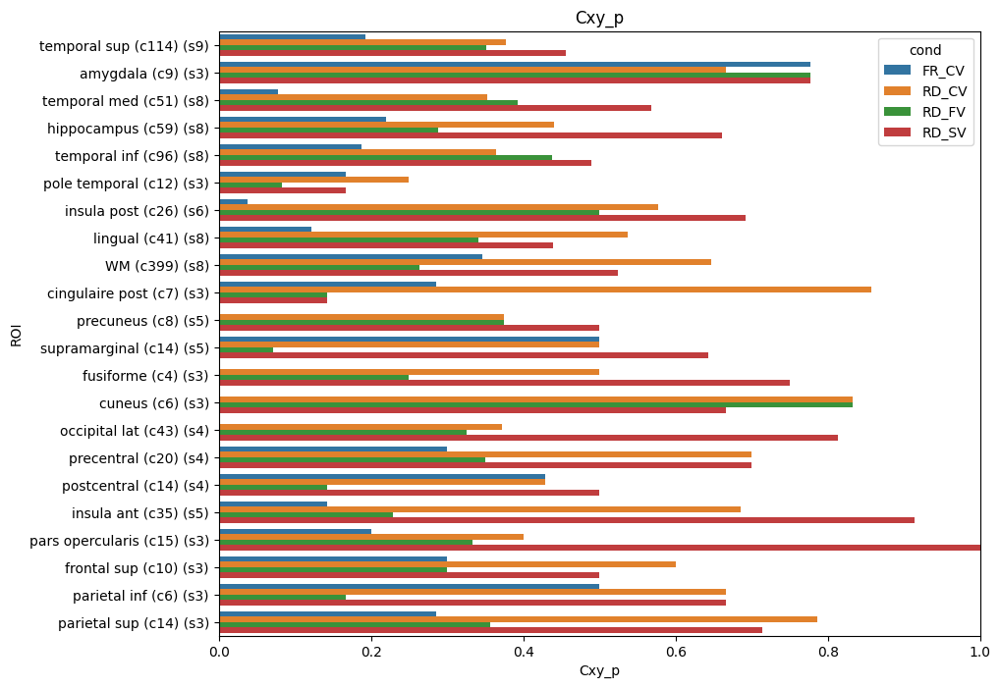

In [234]:
df_plot = df_Cxy_p

fig, ax = plt.subplots(figsize = (10,8))
g = sns.barplot(data=df_plot , x='Cxy_p', y='ROI', hue='cond', ax=ax)

ROI_labels = []

for ROI_i, ROI in enumerate(Cxy_ROI_list_ALLCOND_filt):

    _count_plot = df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
    _count_sujet = df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
    ROI_labels.append(f'{ROI} (c{_count_plot}) (s{_count_sujet})')

g.set_yticks(range(len(ROI_labels)))
g.set_yticklabels(ROI_labels)
ax.tick_params(axis='y')
ax.set_xlim(0,1)

ax.set_title('Cxy_p')

<Axes: xlabel='cond', ylabel='Cxy_p'>

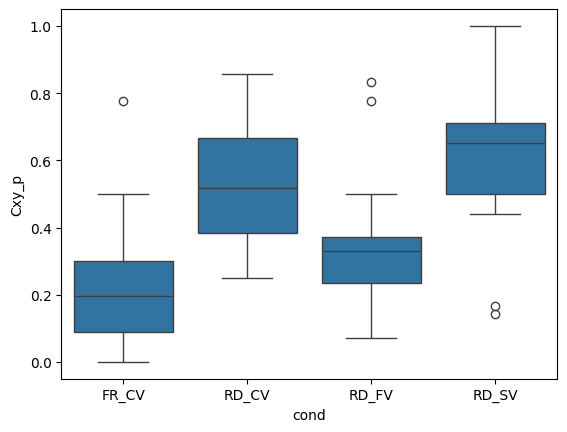

In [235]:
sns.boxplot(data=df_Cxy_p, x="cond", y="Cxy_p")

In [236]:
from scipy.stats import friedmanchisquare, wilcoxon
from statsmodels.stats.multitest import multipletests


pivot_df = df_Cxy_p.query(f"cond != 'FR_CV'").pivot(index='ROI', columns='cond', values='Cxy_p')


stat, pval = friedmanchisquare(*[pivot_df[col] for col in pivot_df.columns])
print(f"Friedman χ² = {stat:.3f}, p = {pval:.4f}")

# If significant, run post-hoc pairwise Wilcoxon tests
if pval < 0.05:
    conds = pivot_df.columns.tolist()
    results = []
    for i in range(len(conds)):
        for j in range(i+1, len(conds)):
            cond1, cond2 = conds[i], conds[j]
            stat_w, p_w = wilcoxon(pivot_df[cond1], pivot_df[cond2])
            results.append((cond1, cond2, p_w))

    # Adjust p-values for multiple comparisons
    raw_pvals = [r[2] for r in results]
    reject, pvals_corrected, _, _ = multipletests(raw_pvals, method='bonferroni')

    # Print results
    print("\nPost-hoc Wilcoxon tests (Bonferroni-corrected):")
    for (cond1, cond2, raw_p), corr_p, sig in zip(results, pvals_corrected, reject):
        print(f"{cond1} vs {cond2}: raw p = {raw_p:.4f}, corrected p = {corr_p:.4f}, significant = {sig}")
else:
    print("Friedman test not significant. Skipping post-hoc tests.")

Friedman χ² = 20.293, p = 0.0000

Post-hoc Wilcoxon tests (Bonferroni-corrected):
RD_CV vs RD_FV: raw p = 0.0007, corrected p = 0.0020, significant = True
RD_CV vs RD_SV: raw p = 0.0793, corrected p = 0.2379, significant = False
RD_FV vs RD_SV: raw p = 0.0002, corrected p = 0.0007, significant = True


<Axes: xlabel='cond', ylabel='Cxy_p'>

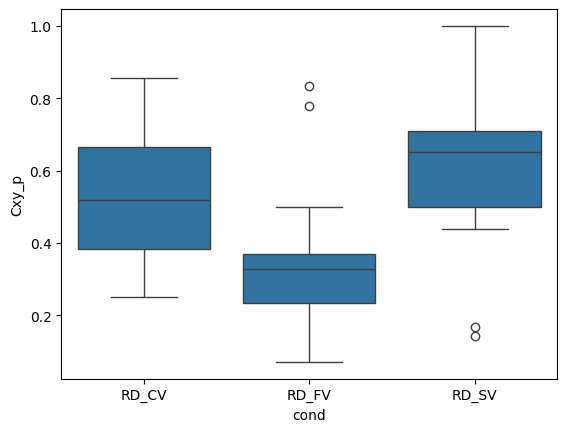

In [237]:
sns.boxplot(data=df_Cxy_p.query(f"cond != 'FR_CV'"), x="cond", y="Cxy_p")

In [238]:
from statsmodels.stats.contingency_tables import cochrans_q

df_Cxy_ALLCOND_p_stats = pd.DataFrame()

for ROI in Cxy_ROI_list_ALLCOND_filt:

    _df = df_Cxy_ALLCOND.query(f"cond != 'FR_CV' and ROI == '{ROI}'")
    _df['signi']  = (_df['Cxy'] > _df['Cxy_surr']) * 1
    _df = _df.pivot_table(index=['sujet', 'chan'], columns='cond', values='signi').reset_index()
    _data = _df[['RD_CV', 'RD_SV', 'RD_FV']].values.astype(int)

    result = cochrans_q(_data)

    q_stat = result.statistic
    p_value = result.pvalue

    def pairwise_permutation_test(df, n_perm=500):

        results = []
        conds = df.columns.tolist()

        for i in range(len(conds)):
            for j in range(i + 1, len(conds)):
                cond1 = conds[i]
                cond2 = conds[j]

                # Observed absolute difference in proportions
                d_obs = _df[cond1].sum() / len(_df) - _df[cond2].sum() / len(_df)

                # Build null distribution via permutations
                null_dist = np.zeros(n_perm)

                for k in range(n_perm):
                    flip = np.random.binomial(1, 0.5, size=len(df))
                    c1_perm = np.where(flip, df[cond2], df[cond1])
                    c2_perm = np.where(flip, df[cond1], df[cond2])
                    null_dist[k] = c1_perm.sum() / len(_df) - c2_perm.sum() / len(_df)

                # Compute p-value
                threshdw, thresh_up = np.percentile(null_dist, [2.5, 97.5])
                if d_obs < threshdw or d_obs > thresh_up:
                    p_val = True
                else:
                    p_val = False

                results.append({
                    'condition_1': cond1,
                    'condition_2': cond2,
                    'p_value': p_val
                })

        return pd.DataFrame(results)

    _res = pairwise_permutation_test(_df[['RD_CV', 'RD_SV', 'RD_FV']], n_perm=500)

    _df_ROI = pd.DataFrame({'ROI' : [ROI] * _res.shape[0], 'pval' : [p_value] * _res.shape[0]})
    _df_ROI = pd.concat([_df_ROI, _res], axis=1)
    df_Cxy_ALLCOND_p_stats = pd.concat([df_Cxy_ALLCOND_p_stats, _df_ROI], axis=0)

/tmp/ipykernel_733452/604976406.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  _df['signi']  = (_df['Cxy'] > _df['Cxy_surr']) * 1
/tmp/ipykernel_733452/604976406.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  _df['signi']  = (_df['Cxy'] > _df['Cxy_surr']) * 1
/tmp/ipykernel_733452/604976406.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.py

In [239]:
df_Cxy_p_diff = pd.DataFrame({'ROI' : df_Cxy_p.pivot(index='ROI', columns='cond', values='Cxy_p').index.values})
df_Cxy_p_diff['RD_SV'] = (df_Cxy_p.pivot(index='ROI', columns='cond', values='Cxy_p')['RD_SV'] - df_Cxy_p.pivot(index='ROI', columns='cond', values='Cxy_p')['RD_CV']).values
df_Cxy_p_diff['RD_FV'] = (df_Cxy_p.pivot(index='ROI', columns='cond', values='Cxy_p')['RD_FV'] - df_Cxy_p.pivot(index='ROI', columns='cond', values='Cxy_p')['RD_CV']).values
df_Cxy_p_diff = df_Cxy_p_diff.melt(id_vars='ROI', value_vars=['RD_SV', 'RD_FV'],var_name='cond', value_name='Cxy_diff')
df_Cxy_p_diff

signi_diff = []

for row_i, row_val in df_Cxy_p_diff.iterrows():

    try:
        pre_hoc = df_Cxy_ALLCOND_p_stats.query(f"ROI == '{row_val['ROI']}' and condition_1 == '{row_val['cond']}' and condition_2 == 'RD_CV'")['pval'].values[0]
    except:
        pre_hoc = df_Cxy_ALLCOND_p_stats.query(f"ROI == '{row_val['ROI']}' and condition_1 == 'RD_CV' and condition_2 == '{row_val['cond']}'")['pval'].values[0]
    
    try:       
        post_hoc = df_Cxy_ALLCOND_p_stats.query(f"ROI == '{row_val['ROI']}' and condition_1 == '{row_val['cond']}' and condition_2 == 'RD_CV'")['p_value'].values[0]
    except:
        post_hoc = df_Cxy_ALLCOND_p_stats.query(f"ROI == '{row_val['ROI']}' and condition_1 == 'RD_CV' and condition_2 == '{row_val['cond']}'")['p_value'].values[0]

    if pre_hoc and post_hoc:

        signi_diff.append(True)

    else:
        
        signi_diff.append(False)

df_Cxy_p_diff['signi'] = signi_diff


In [240]:
df_Cxy_p_diff.query(f"signi == True")

,ROI,cond,Cxy_diff,signi
0,WM,RD_SV,-0.122807,True
6,hippocampus,RD_SV,0.220339,True
7,insula ant,RD_SV,0.228571,True
10,occipital lat,RD_SV,0.441860,True
13,pars opercularis,RD_SV,0.600000,True
20,temporal med,RD_SV,0.215686,True
22,WM,RD_FV,-0.383459,True
24,cingulaire post,RD_FV,-0.714286,True
29,insula ant,RD_FV,-0.457143,True


Text(0.5, 1.0, 'Cxy_p RD_CV')

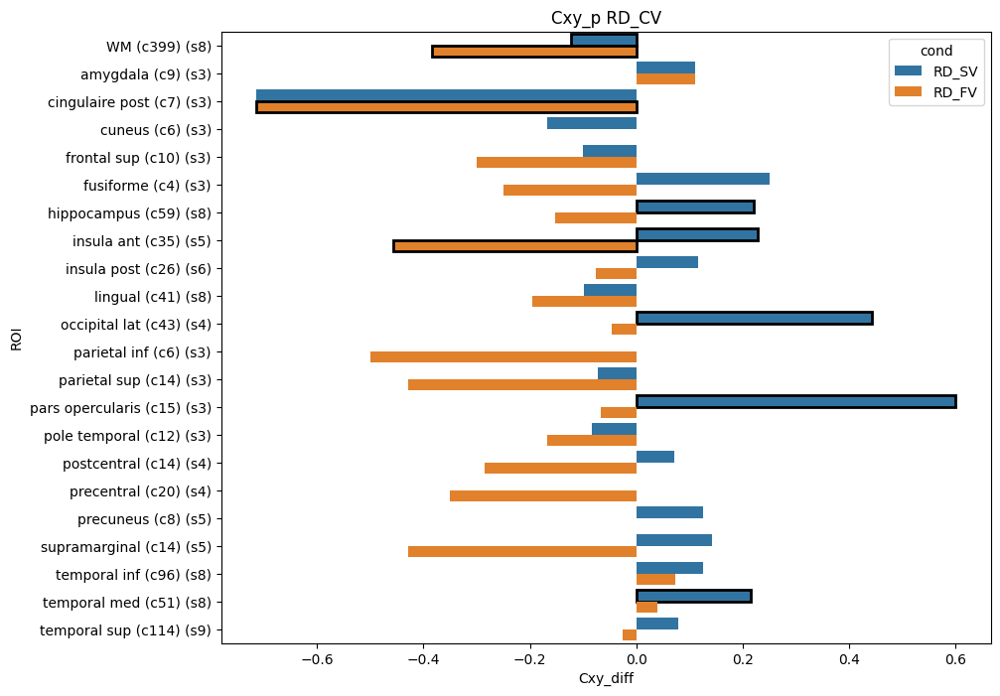

In [241]:
df_plot = df_Cxy_p_diff

fig, ax = plt.subplots(figsize = (10,8))
g = sns.barplot(data=df_plot , x='Cxy_diff', y='ROI', hue='cond', ax=ax)

ROI_labels = []

for ROI_i, ROI in enumerate(df_plot['ROI'].unique()):

    _count_plot = df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
    _count_sujet = df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
    ROI_labels.append(f'{ROI} (c{_count_plot}) (s{_count_sujet})')

for patch, (_, row) in zip(ax.patches, df_plot.iterrows()):
    if row['signi'] == True:
        patch.set_edgecolor('black')
        patch.set_linewidth(2)
    else:
        patch.set_edgecolor('none')  # no border for non-significant bars

g.set_yticks(range(len(ROI_labels)))
g.set_yticklabels(ROI_labels)
ax.tick_params(axis='y')
# ax.set_xlim(-0.3,0.3)

ax.set_title('Cxy_p RD_CV')

In [242]:
df_Cxy_allcond_diff = pd.melt(pd.DataFrame({'ROI' : df_Cxy_p.query(f"cond == 'RD_CV'")['ROI'].values,
'RD_SV' : df_Cxy_p.query(f"cond == 'RD_SV'")['Cxy_p'].values - df_Cxy_p.query(f"cond == 'RD_CV'")['Cxy_p'].values,
'RD_FV' : df_Cxy_p.query(f"cond == 'RD_FV'")['Cxy_p'].values - df_Cxy_p.query(f"cond == 'RD_CV'")['Cxy_p'].values}),           

id_vars='ROI', 
value_vars=['RD_SV', 'RD_FV'], 
var_name='cond', 
value_name='Cxy_p')

### LMM

In [243]:
os.chdir(os.path.join(path_results, 'allplot', 'LMM', 'Cxy', 'df_lmm'))
df_lmm_allcond = pd.DataFrame()

for ROI in Cxy_ROI_list_ALLCOND_filt:

    _df = pd.read_excel(f'ALLCOND_Cxy_lmm_{ROI}_res.xlsx')
    _df['ROI'] = [ROI] * _df.shape[0]
    df_lmm_allcond = pd.concat([df_lmm_allcond, _df])

In [244]:
data = {'ROI' : [], 'coeff' : [], 'intercept' : [], 'pval' : [], 'p' : []}

for ROI in Cxy_ROI_list_ALLCOND_filt:

    coeff = df_lmm_allcond.query(f"ROI == '{ROI}' and term == 'resp'")['estimate'].values[0]
    pval = df_lmm_allcond.query(f"ROI == '{ROI}' and term == 'resp'")['p.value'].values[0]
    intercept = df_lmm_allcond.query(f"ROI == '{ROI}' and term == '(Intercept)'")['estimate'].values[0]

    if pval < 0.05:

        p = 1

    else:

        p = 0

    data['ROI'].append(ROI)
    data['coeff'].append(coeff)
    data['intercept'].append(intercept)
    data['pval'].append(pval)
    data['p'].append(p)


df_lmm_allcond_summary = pd.DataFrame(data)


In [245]:
df_lmm_allcond_summary.query(f"p == 1")

,ROI,coeff,intercept,pval,p
0,temporal sup,-1.163655,-1.500049,1.532040e-03,1
3,hippocampus,-1.100059,-1.555146,1.823655e-02,1
4,temporal inf,-0.728207,-1.717901,4.924948e-02,1
8,WM,-1.940394,-1.210653,2.022094e-22,1
11,supramarginal,-2.661833,-0.946267,1.647499e-03,1
12,fusiforme,-2.382738,-1.174117,3.787383e-02,1
14,occipital lat,-1.733353,-1.211022,2.572298e-04,1
15,precentral,-1.975066,-0.716611,3.225371e-03,1
16,postcentral,-2.824744,-0.827296,2.905287e-03,1
17,insula ant,-4.625593,-0.195377,3.690418e-24,1


/tmp/ipykernel_733452/3469431331.py:16: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ROI_labels)


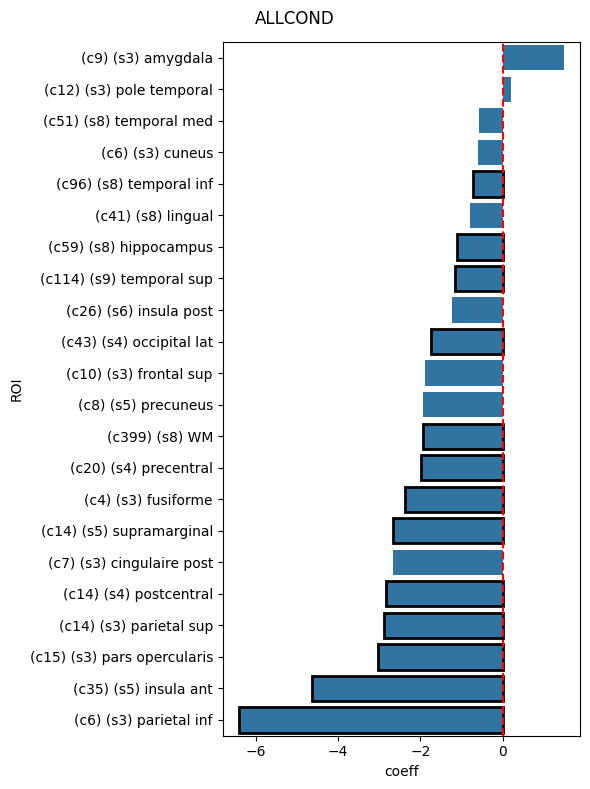

In [246]:
df_plot = df_lmm_allcond_summary.sort_values('coeff', ascending=False)

ROI_labels = []
for ROI in df_plot['ROI'].unique():
    _count_plot = df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
    _count_sujet = df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
    ROI_labels.append(f"(c{_count_plot}) (s{_count_sujet}) {ROI}")

plt.figure(figsize=(6, 8))
ax = sns.barplot(data=df_plot, x='coeff', y='ROI')

# Horizontal line at 0
ax.axvline(0, color='r', linestyle='--')

# Set custom x-tick labels
ax.set_yticklabels(ROI_labels)

# Add black border to bars where p == 1
for patch, (_, row) in zip(ax.patches, df_plot.iterrows()):
    if row['p'] == 1:
        patch.set_edgecolor('black')
        patch.set_linewidth(2)
    else:
        patch.set_edgecolor('none')  # no border for non-significant bars

plt.suptitle(f"ALLCOND")
plt.tight_layout()
plt.show()

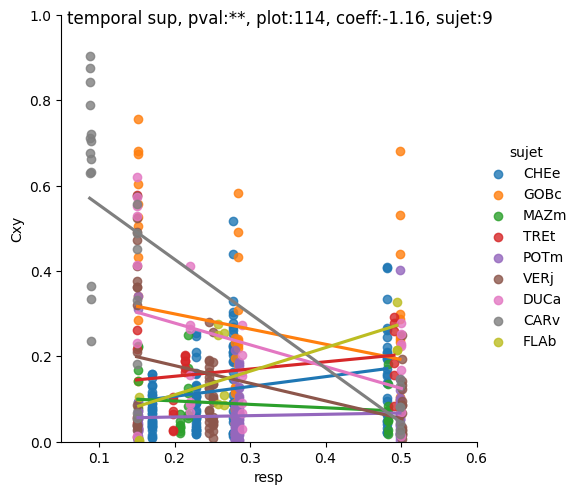

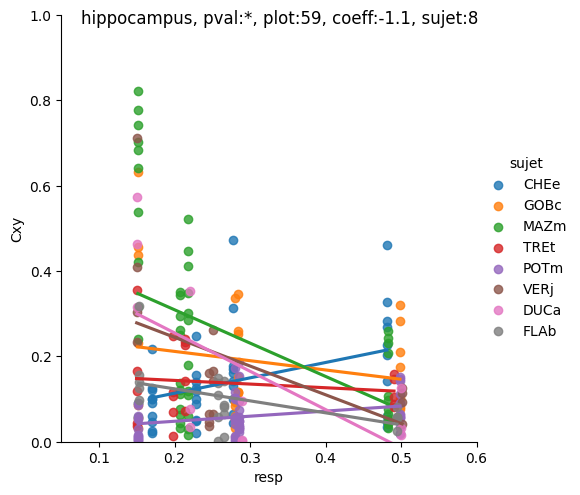

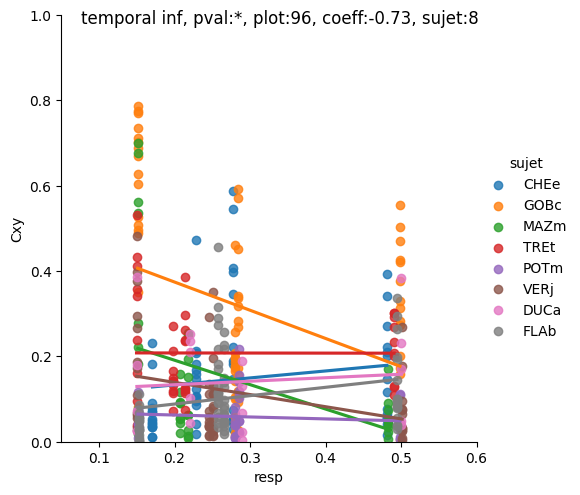

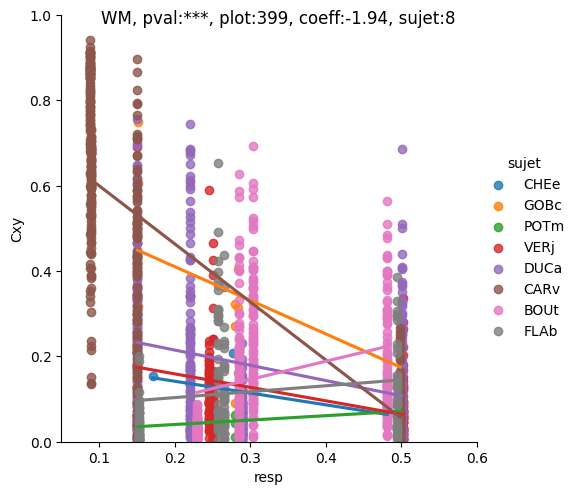

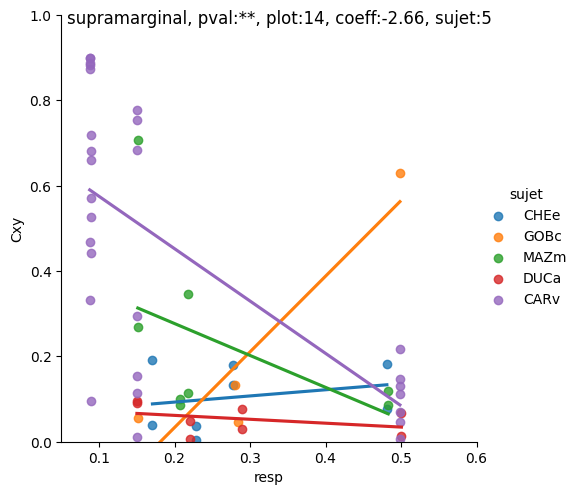

...

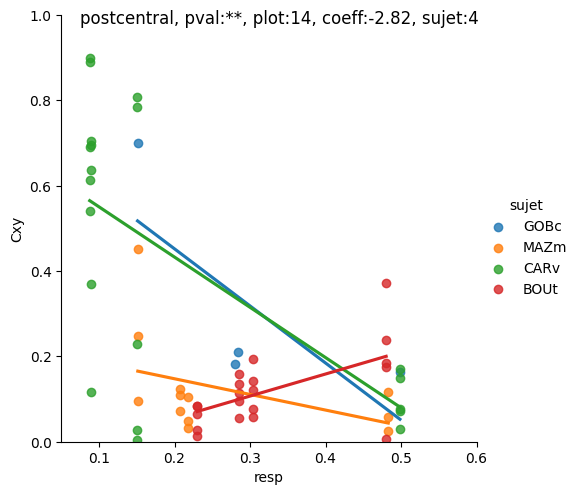

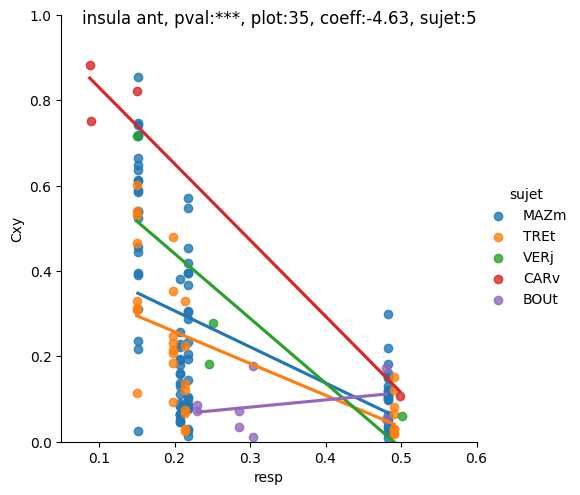

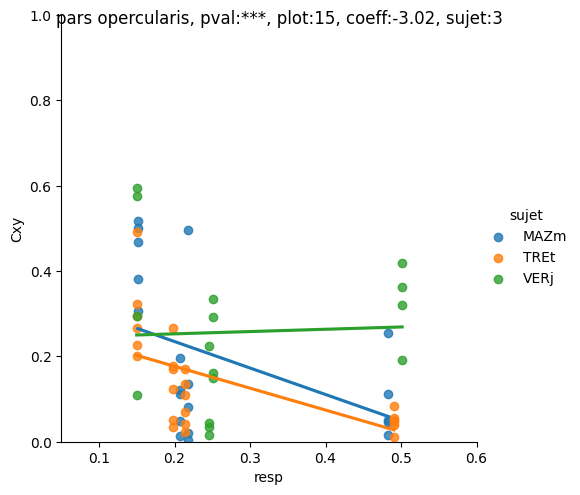

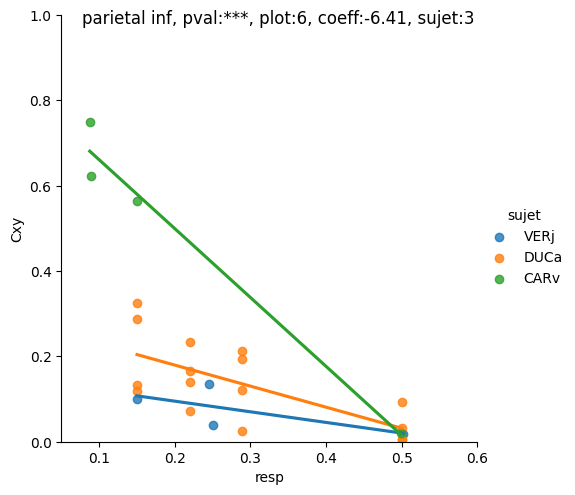

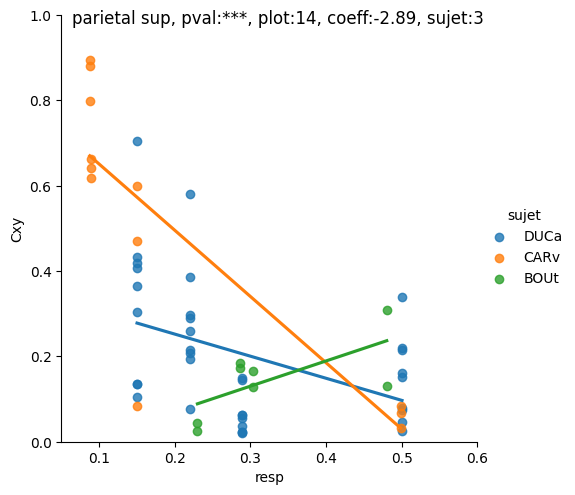

In [247]:
for ROI in Cxy_ROI_list_ALLCOND_filt:

    if df_lmm_allcond_summary.query(f"ROI == '{ROI}'")['p'].values != 1:

        continue 

    _df_Cxy_ALLCOND = df_Cxy_ALLCOND.query(f"ROI == '{ROI}'")[['sujet', 'Cxy', 'resp']]
    
    pval = df_lmm_allcond_summary.query(f"ROI == '{ROI}'")['pval'].values[0]
    sns.lmplot(x="resp", y="Cxy", hue='sujet', data=_df_Cxy_ALLCOND,  ci=None)
    _coeff = df_lmm_allcond_summary.query(f"ROI == '{ROI}'")['coeff'].values[0]
    _ROI_mdl = _df_Cxy_ALLCOND['resp'].values*_coeff + df_lmm_allcond_summary.query(f"ROI == '{ROI}'")['intercept'].values
    plt.ylim(0,1)
    plt.xlim(0.05, 0.6)
    plt.plot(_df_Cxy_ALLCOND['resp'].values, _ROI_mdl, color='k', linewidth=3)
    _count_plot = df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
    _count_sujet = df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
    plt.suptitle(f"{ROI}, pval:{get_pval(pval)}, plot:{_count_plot}, coeff:{np.round(_coeff, 2)}, sujet:{_count_sujet}")
        

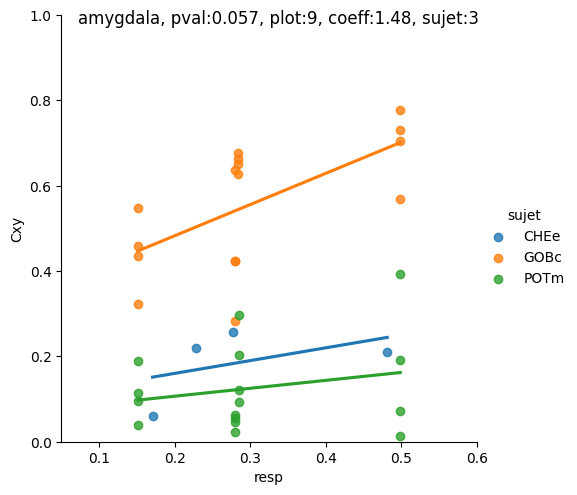

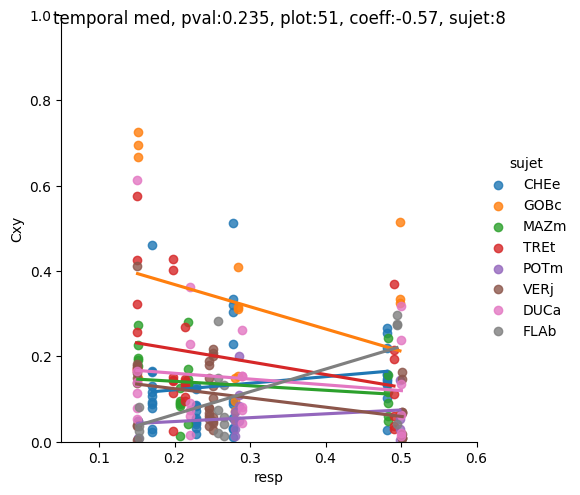

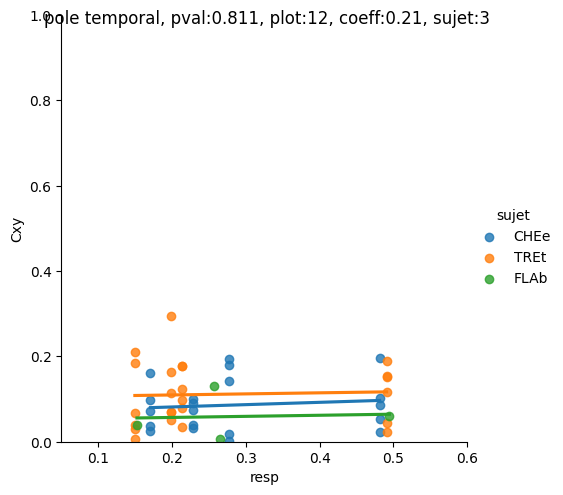

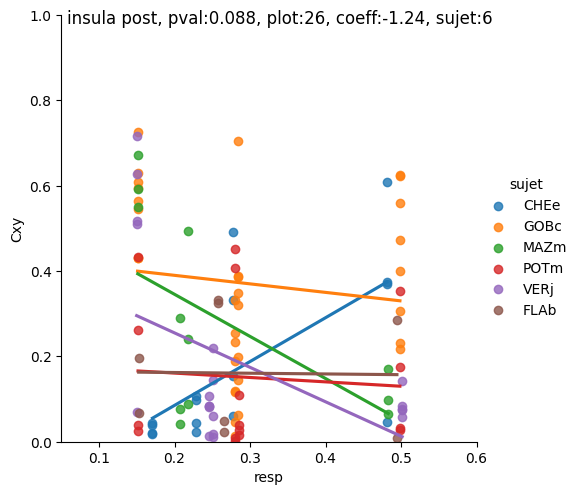

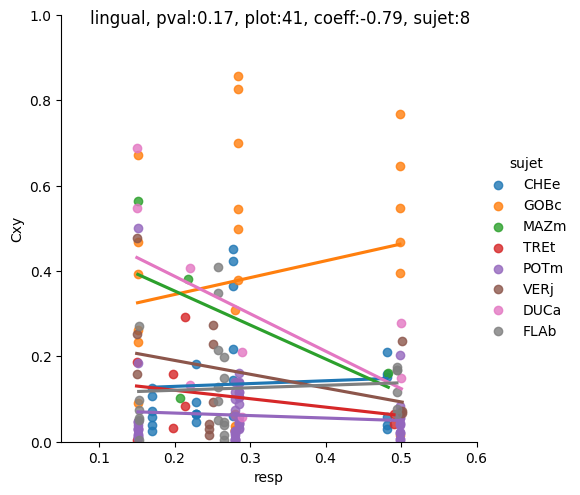

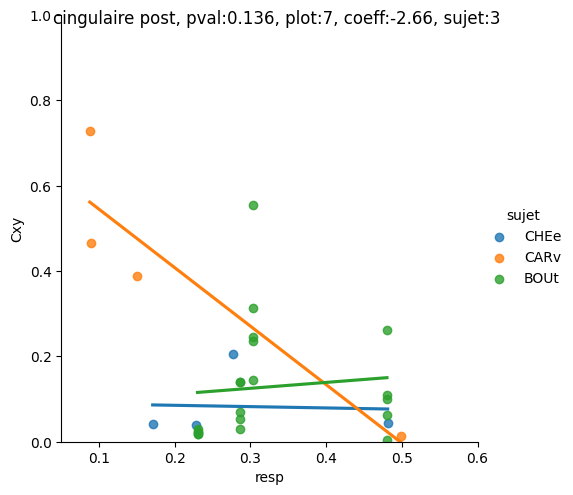

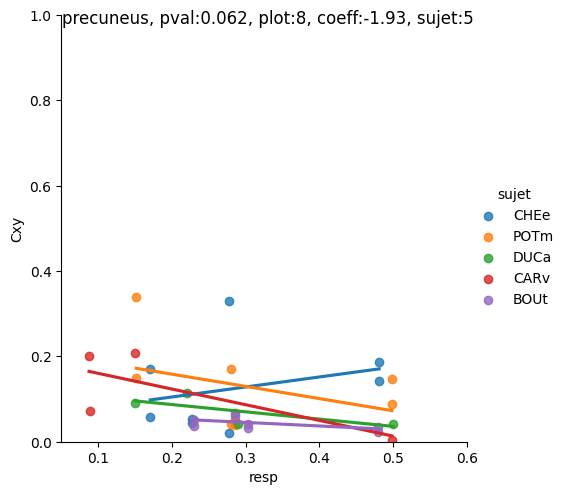

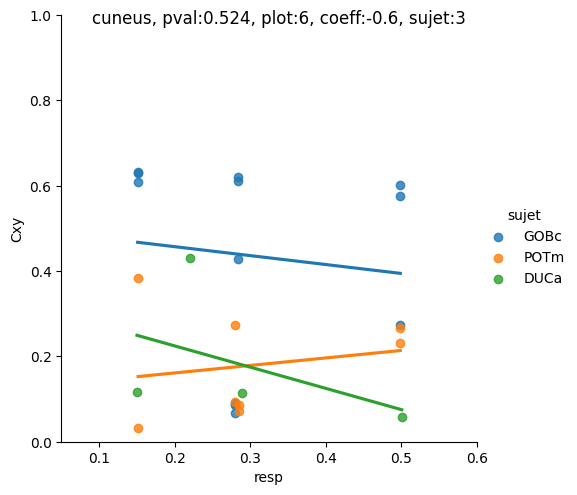

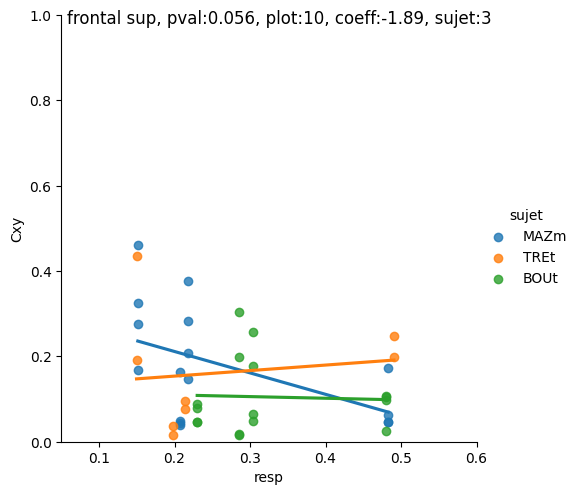

In [248]:
for ROI in Cxy_ROI_list_ALLCOND_filt:

    if df_lmm_allcond_summary.query(f"ROI == '{ROI}'")['p'].values == 1:

        continue 

    _df_Cxy_ALLCOND = df_Cxy_ALLCOND.query(f"ROI == '{ROI}'")[['sujet', 'Cxy', 'resp']]
    
    pval = df_lmm_allcond_summary.query(f"ROI == '{ROI}'")['pval'].values[0]
    sns.lmplot(x="resp", y="Cxy", hue='sujet', data=_df_Cxy_ALLCOND,  ci=None)
    _coeff = df_lmm_allcond_summary.query(f"ROI == '{ROI}'")['coeff'].values[0]
    _ROI_mdl = _df_Cxy_ALLCOND['resp'].values*_coeff + df_lmm_allcond_summary.query(f"ROI == '{ROI}'")['intercept'].values
    plt.ylim(0,1)
    plt.xlim(0.05, 0.6)
    plt.plot(_df_Cxy_ALLCOND['resp'].values, _ROI_mdl, color='k', linewidth=3)
    _count_plot = df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
    _count_sujet = df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
    plt.suptitle(f"{ROI}, pval:{get_pval(np.round(pval,3))}, plot:{_count_plot}, coeff:{np.round(_coeff, 2)}, sujet:{_count_sujet}")

# Pxx

## FR_CV

### MI PROPORTION

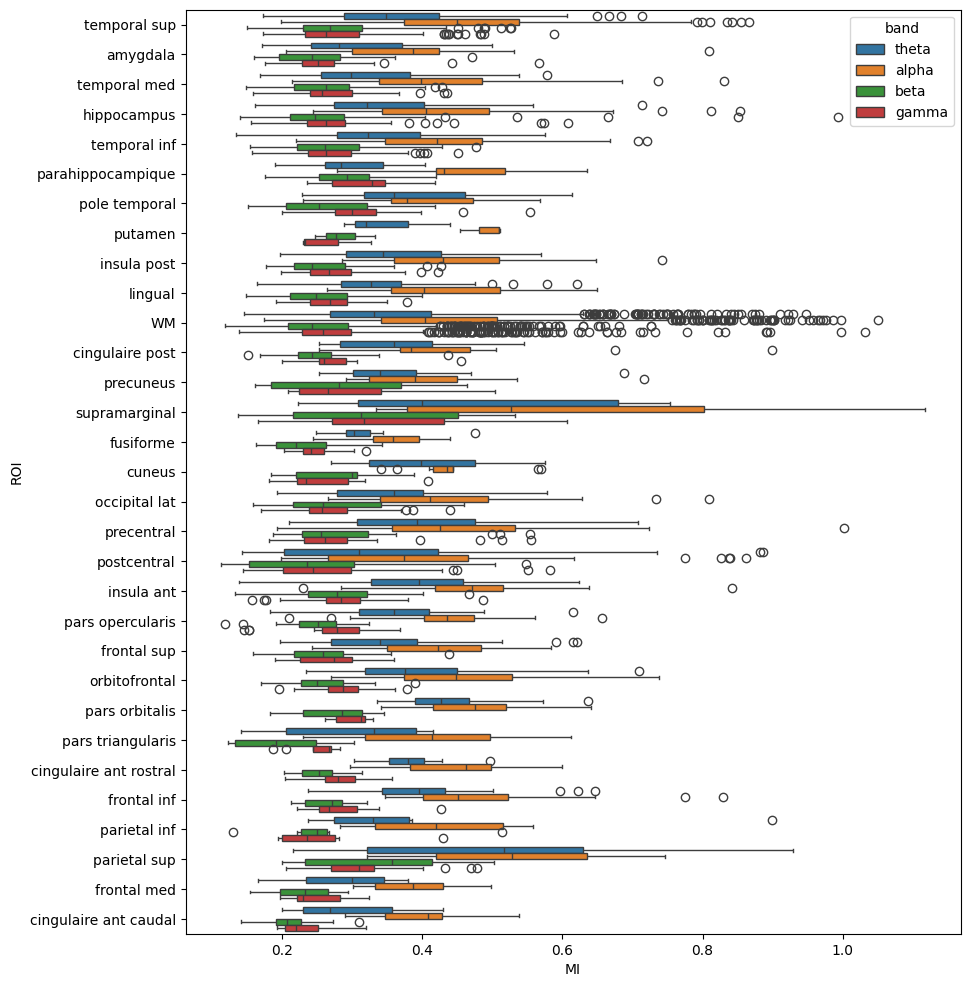

In [249]:
fig, ax = plt.subplots(figsize=(10,12))
sns.boxplot(data=df_MI_FR_CV, x='MI', y='ROI', hue='band', ax=ax)
plt.show()

In [66]:
data_df = {'ROI' : [], 'band' : [], 'MI_p' : [], 'MI_val_signi' : [], 'MI_val_nosigni' : []}

for ROI in MI_ROI_list_FR_CV_filt:

    for band in df_MI_FR_CV['band'].unique():
    
        signi = df_MI_FR_CV.query(f"ROI == '{ROI}' and band == '{band}'")['MI_signi'].sum()
        _MI_val_signi = df_MI_FR_CV.query(f"ROI == '{ROI}' and band == '{band}' and MI_signi == True")['MI'].median()
        _MI_val_nosigni = df_MI_FR_CV.query(f"ROI == '{ROI}' and band == '{band}' and MI_signi == False")['MI'].median()
        prop_MI = signi/df_ROI_count_FR_CV.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
        
        data_df['ROI'].append(ROI)
        data_df['band'].append(band)
        data_df['MI_val_signi'].append(_MI_val_signi)
        data_df['MI_val_nosigni'].append(_MI_val_nosigni)
        data_df['MI_p'].append(prop_MI)

df_MI_p = pd.DataFrame(data_df) 
df_MI_p

,ROI,band,MI_p,MI_val_signi,MI_val_nosigni
0,temporal sup,theta,0.047826,0.456742,0.347886
1,temporal sup,alpha,0.086957,0.530715,0.440270
2,temporal sup,beta,0.091304,0.286504,0.265256
3,temporal sup,gamma,0.113043,0.304718,0.258370
4,amygdala,theta,0.000000,NaN,0.280851
...,...,...,...,...,...
119,frontal med,gamma,0.111111,0.291419,0.229400
120,cingulaire ant caudal,theta,0.000000,NaN,0.268972
121,cingulaire ant caudal,alpha,0.100000,0.415727,0.407288
122,cingulaire ant caudal,beta,0.100000,0.309214,0.203739


/tmp/ipykernel_3811780/1814785346.py:9: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.pointplot(data=df_plot, x='MI_p', y='ROI', ax=ax, join=False, order=ordered_rois, color='blue', label='MI_p')
/tmp/ipykernel_3811780/1814785346.py:13: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.pointplot(data=df_plot, x='MI_val_signi', y='ROI', ax=ax2, join=False, order=ordered_rois, color='orange', label='MI_val_signi')
/tmp/ipykernel_3811780/1814785346.py:14: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.pointplot(data=df_plot, x='MI_val_nosigni', y='ROI', ax=ax2, join=False, order=ordered_rois, color='green', label='MI_val_nosigni')


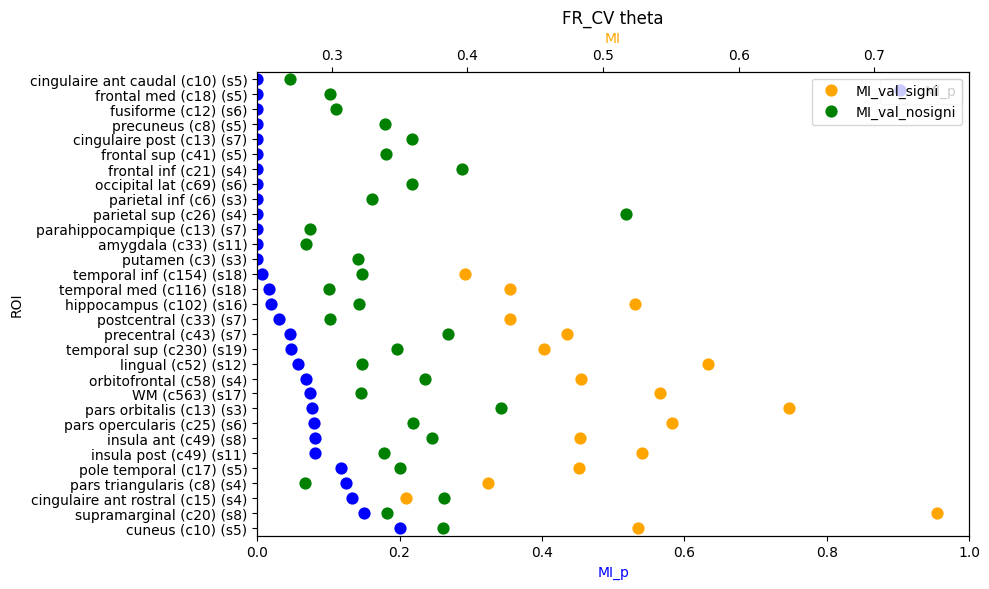

/tmp/ipykernel_3811780/1814785346.py:9: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.pointplot(data=df_plot, x='MI_p', y='ROI', ax=ax, join=False, order=ordered_rois, color='blue', label='MI_p')
/tmp/ipykernel_3811780/1814785346.py:13: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.pointplot(data=df_plot, x='MI_val_signi', y='ROI', ax=ax2, join=False, order=ordered_rois, color='orange', label='MI_val_signi')
/tmp/ipykernel_3811780/1814785346.py:14: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.pointplot(data=df_plot, x='MI_val_nosigni', y='ROI', ax=ax2, join=False, order=ordered_rois, color='green', label='MI_val_nosigni')


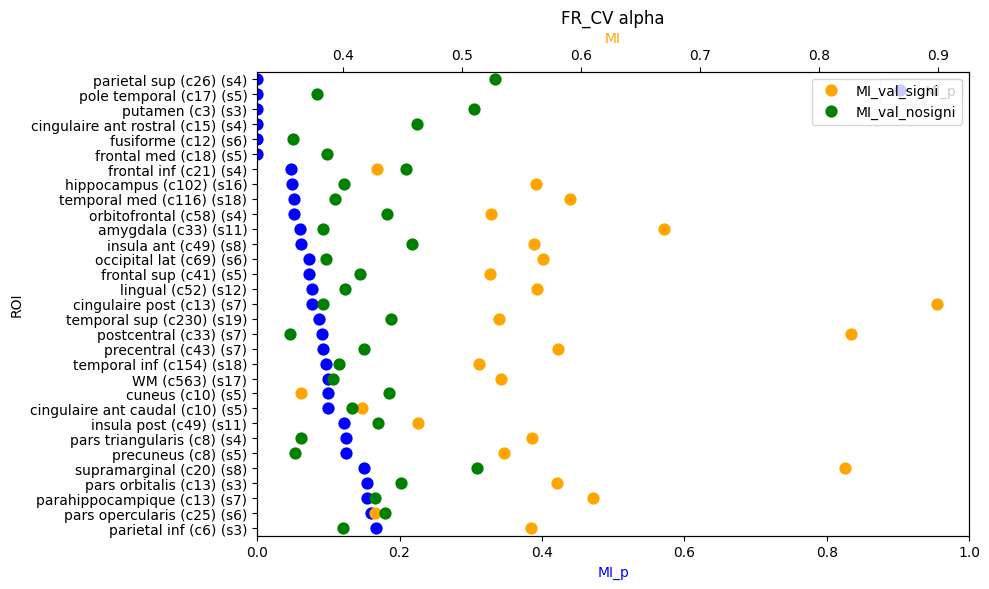

/tmp/ipykernel_3811780/1814785346.py:9: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.pointplot(data=df_plot, x='MI_p', y='ROI', ax=ax, join=False, order=ordered_rois, color='blue', label='MI_p')
/tmp/ipykernel_3811780/1814785346.py:13: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.pointplot(data=df_plot, x='MI_val_signi', y='ROI', ax=ax2, join=False, order=ordered_rois, color='orange', label='MI_val_signi')
/tmp/ipykernel_3811780/1814785346.py:14: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.pointplot(data=df_plot, x='MI_val_nosigni', y='ROI', ax=ax2, join=False, order=ordered_rois, color='green', label='MI_val_nosigni')


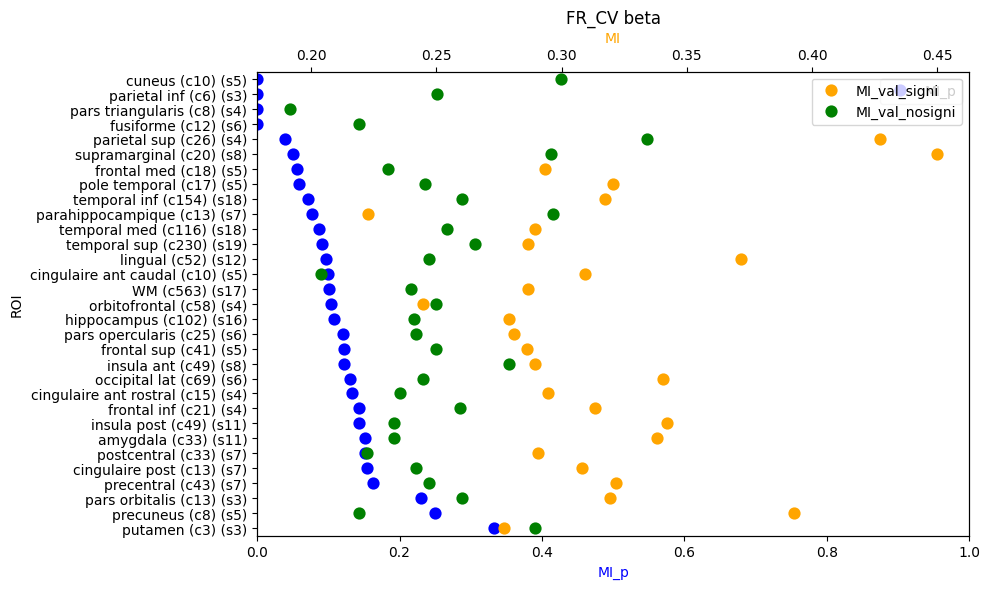

/tmp/ipykernel_3811780/1814785346.py:9: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.pointplot(data=df_plot, x='MI_p', y='ROI', ax=ax, join=False, order=ordered_rois, color='blue', label='MI_p')
/tmp/ipykernel_3811780/1814785346.py:13: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.pointplot(data=df_plot, x='MI_val_signi', y='ROI', ax=ax2, join=False, order=ordered_rois, color='orange', label='MI_val_signi')
/tmp/ipykernel_3811780/1814785346.py:14: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.pointplot(data=df_plot, x='MI_val_nosigni', y='ROI', ax=ax2, join=False, order=ordered_rois, color='green', label='MI_val_nosigni')


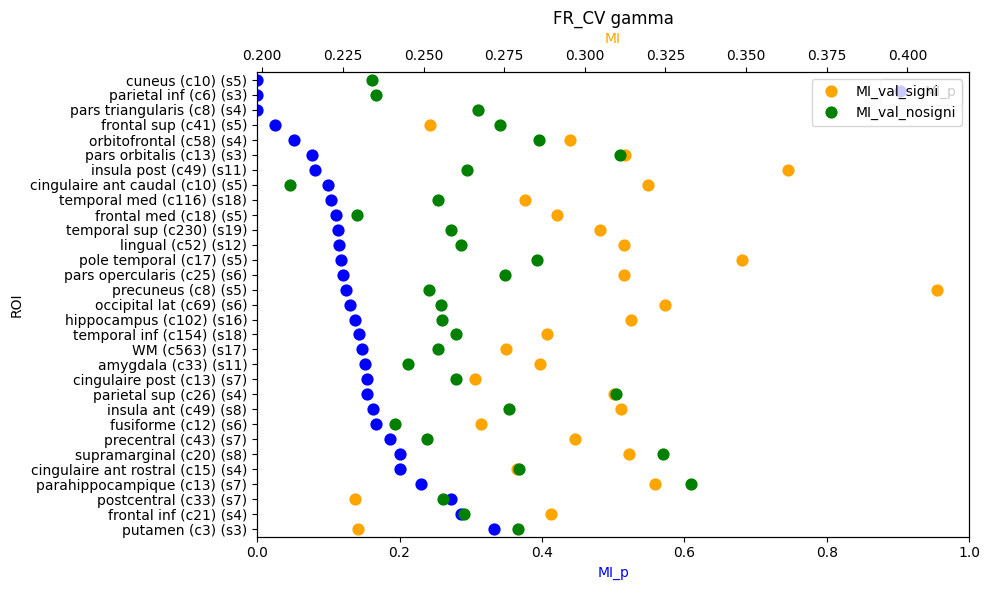

In [67]:
for band in df_MI_FR_CV['band'].unique():

    df_plot = df_MI_p.query(f"band == '{band}'").copy()

    ordered_rois = df_plot.sort_values('MI_p')['ROI']

    fig, ax = plt.subplots(figsize=(10, 6))

    sns.pointplot(data=df_plot, x='MI_p', y='ROI', ax=ax, join=False, order=ordered_rois, color='blue', label='MI_p')

    ax2 = ax.twiny()

    sns.pointplot(data=df_plot, x='MI_val_signi', y='ROI', ax=ax2, join=False, order=ordered_rois, color='orange', label='MI_val_signi')
    sns.pointplot(data=df_plot, x='MI_val_nosigni', y='ROI', ax=ax2, join=False, order=ordered_rois, color='green', label='MI_val_nosigni')

    ROI_labels = []
    for ROI in ordered_rois:
        _count_plot = df_ROI_count_FR_CV.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
        _count_sujet = df_ROI_count_FR_CV.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
        ROI_labels.append(f'{ROI} (c{_count_plot}) (s{_count_sujet})')

    ax.set_yticks(range(len(ROI_labels)))
    ax.set_yticklabels(ROI_labels)
    ax.tick_params(axis='y')

    ax.set_xlabel('MI_p', color='blue')
    ax.set_xlim(0, 1)
    ax2.set_xlabel('MI', color='orange')

    ax.set_title(f'FR_CV {band}')

    plt.tight_layout()
    plt.show()


### spearman OLS allplot MI

In [16]:
def single_permutation(_df, x_obs, i):

    _vec_perm = []

    for row_i, row in _df.iterrows():

        _sujet = row['sujet']
        _pos_allowed = np.where(_df['sujet'] != _sujet)[0]
        _pos_allowed = np.array([i for i in _pos_allowed if i not in _vec_perm])
        try:
            _vec_perm.append(_pos_allowed[np.random.randint(_pos_allowed.size)]) 
        except:
            _pos_missing = np.array([i for i in range(_df.shape[0]) if i not in _vec_perm])
            _vec_perm.append(_pos_missing[np.random.randint(_pos_missing.size)]) 

    _vec_perm = np.array(_vec_perm)   
    y_perm = _df['MI'].values[_vec_perm]
    _rho, _ = scipy.stats.spearmanr(x_obs, y_perm)
    
    return _rho

def spearman_permutation_test_parallel(_df, n_perm, percentile_thresh_list, n_jobs=20):
    x_obs, y_obs = _df['MI'].values, _df['resp'].values
    rho_obs, _ = scipy.stats.spearmanr(x_obs, y_obs)

    null_dist = joblib.Parallel(n_jobs=n_jobs)(
        joblib.delayed(single_permutation)(_df, x_obs, i)
        for i in range(n_perm)
    )

    null_dist = np.array(null_dist)
    lower, upper = np.percentile(null_dist, percentile_thresh_list)
    signi = rho_obs < lower or rho_obs > upper

    return rho_obs, signi

# Wrapper (unchanged)
def run_one_roi(ROI, df, n_perm, percentile_thresh_list, band):
    _df = df.query(f"ROI == '{ROI}'")[['MI', 'resp', 'sujet']]
    rho, signi = spearman_permutation_test_parallel(_df, n_perm, percentile_thresh_list)
    print(f"{ROI} {band} done")
    return {'ROI': ROI, 'rho': rho, 'signi': signi, 'band': band}

# Parameters
percentile_thresh_list = [2.5, 97.5]
n_perm_spearman = 1000

df_spearman_FR_CV = pd.DataFrame()

for band in band_list_global:

    df_band = df_MI_FR_CV.query(f"band == '{band}'")
    # Run sequentially over ROIs, but each permutation test runs in parallel
    results = [run_one_roi(ROI, df_band, n_perm_spearman, percentile_thresh_list, band)
            for ROI in MI_ROI_list_FR_CV_filt]

    df_spearman_FR_CV = pd.concat([df_spearman_FR_CV, pd.DataFrame(results)], axis=0)


temporal sup theta done
amygdala theta done
temporal med theta done
hippocampus theta done
temporal inf theta done
parahippocampique theta done
pole temporal theta done
putamen theta done
insula post theta done
lingual theta done
WM theta done
cingulaire post theta done
precuneus theta done
supramarginal theta done
fusiforme theta done
cuneus theta done
occipital lat theta done
precentral theta done
postcentral theta done
insula ant theta done
pars opercularis theta done
frontal sup theta done
orbitofrontal theta done
pars orbitalis theta done
pars triangularis theta done
cingulaire ant rostral theta done
frontal inf theta done
parietal inf theta done
parietal sup theta done
frontal med theta done
cingulaire ant caudal theta done
temporal sup alpha done
amygdala alpha done
temporal med alpha done
hippocampus alpha done
temporal inf alpha done
parahippocampique alpha done
pole temporal alpha done
putamen alpha done
insula post alpha done
lingual alpha done
WM alpha done
cingulaire post 

In [18]:
data = {'ROI' : [], 'band' : [], 'coeff' : [], 'intercept' : [], 'pval' : [], 'p' : []}

for ROI in MI_ROI_list_FR_CV_filt:

    for band in band_list_global:

        _df_OLS = df_MI_FR_CV.query(f"ROI == '{ROI}' and band == '{band}'")[['MI', 'resp']]

        x = _df_OLS['resp']
        y = _df_OLS['MI']

        x = sm.add_constant(x)

        mdl = sm.OLS(y, x).fit()
        mdl_fit = mdl.predict(x) 

        coeff = pd.read_html(mdl.summary().tables[1].as_html(), header=0, index_col=0)[0]['coef'].values[-1]
        intercept = pd.read_html(mdl.summary().tables[1].as_html(), header=0, index_col=0)[0]['coef'].values[0]
        pval = pd.read_html(mdl.summary().tables[1].as_html(), header=0, index_col=0)[0]['P>|t|'].values[-1]

        if pval < 0.05:

            p = 1

        else:

            p = 0

        data['ROI'].append(ROI)
        data['band'].append(band)
        data['coeff'].append(coeff)
        data['intercept'].append(intercept)
        data['pval'].append(pval)
        data['p'].append(p)


df_OLS_FR_CV = pd.DataFrame(data)

/tmp/ipykernel_167005/2806570876.py:17: FutureWarning: Passing literal html to 'read_html' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  coeff = pd.read_html(mdl.summary().tables[1].as_html(), header=0, index_col=0)[0]['coef'].values[-1]
/tmp/ipykernel_167005/2806570876.py:18: FutureWarning: Passing literal html to 'read_html' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  intercept = pd.read_html(mdl.summary().tables[1].as_html(), header=0, index_col=0)[0]['coef'].values[0]
/tmp/ipykernel_167005/2806570876.py:19: FutureWarning: Passing literal html to 'read_html' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  pval = pd.read_html(mdl.summary().tables[1].as_html(), header=0, index_col=0)[0]['P>|t|'].values[-1]
/tmp/ipykernel_167005/2806570876.py:17: FutureWarning: Passin

In [24]:
df_OLSSP_FR_CV = df_spearman_FR_CV.copy()
_coeff = []
for row_i, row_val in df_OLSSP_FR_CV.iterrows():
    _ROI, _band = row_val['ROI'], row_val['band']
    _coeff.append(df_OLS_FR_CV.query(f"band == '{_band}' and ROI == '{_ROI}'")['coeff'].iloc[0])
df_OLSSP_FR_CV['OLS_a'] = _coeff

In [253]:
df_spearman_FR_CV.query(f"band == 'theta' and signi == True")

,ROI,rho,signi,band
0,temporal sup,-0.573392,True,theta
1,amygdala,-0.572212,True,theta
2,temporal med,-0.660169,True,theta
3,hippocampus,-0.621270,True,theta
4,temporal inf,-0.691602,True,theta
6,pole temporal,-0.876313,True,theta
7,putamen,0.500000,True,theta
8,insula post,-0.424157,True,theta
9,lingual,-0.313238,True,theta
10,WM,-0.610682,True,theta


/tmp/ipykernel_733452/48753910.py:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ROI_labels)


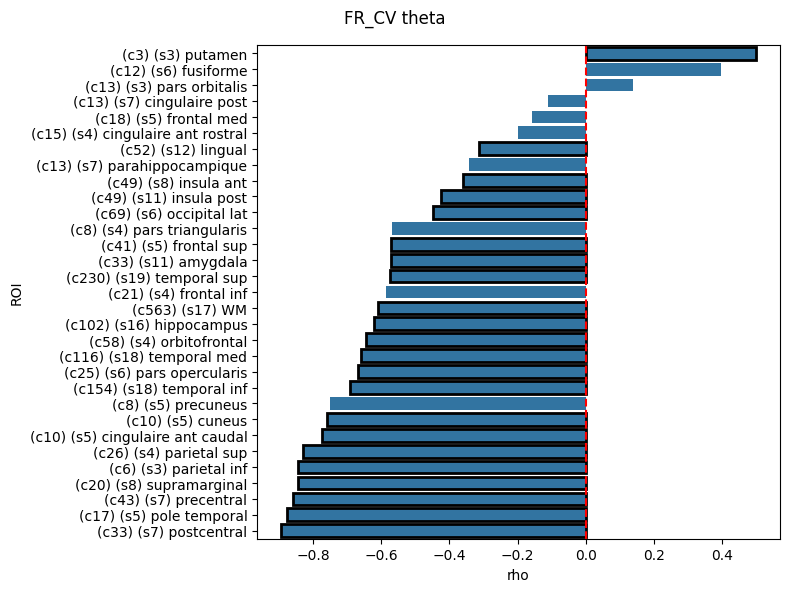

/tmp/ipykernel_733452/48753910.py:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ROI_labels)


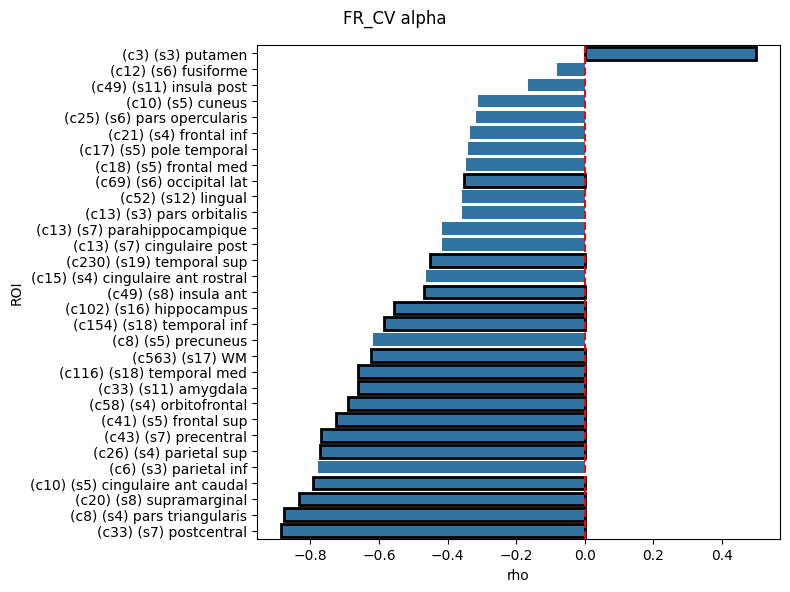

/tmp/ipykernel_733452/48753910.py:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ROI_labels)


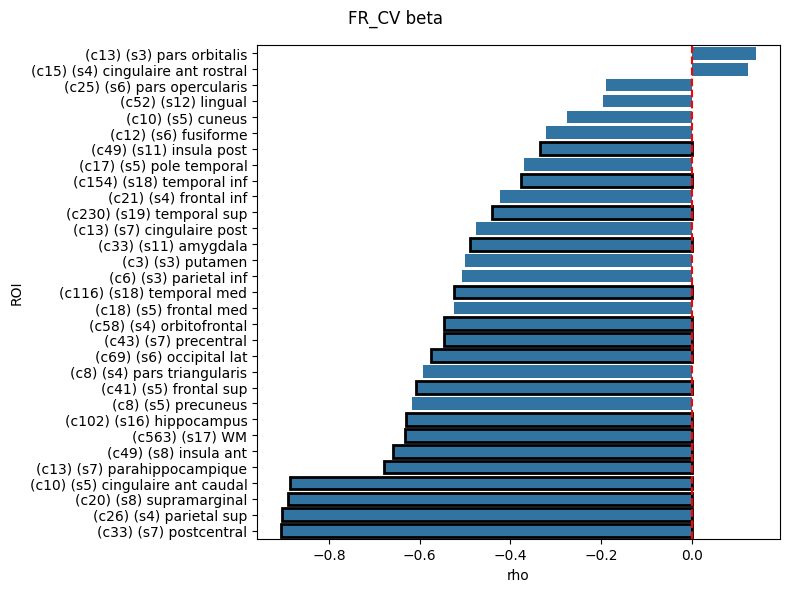

/tmp/ipykernel_733452/48753910.py:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ROI_labels)


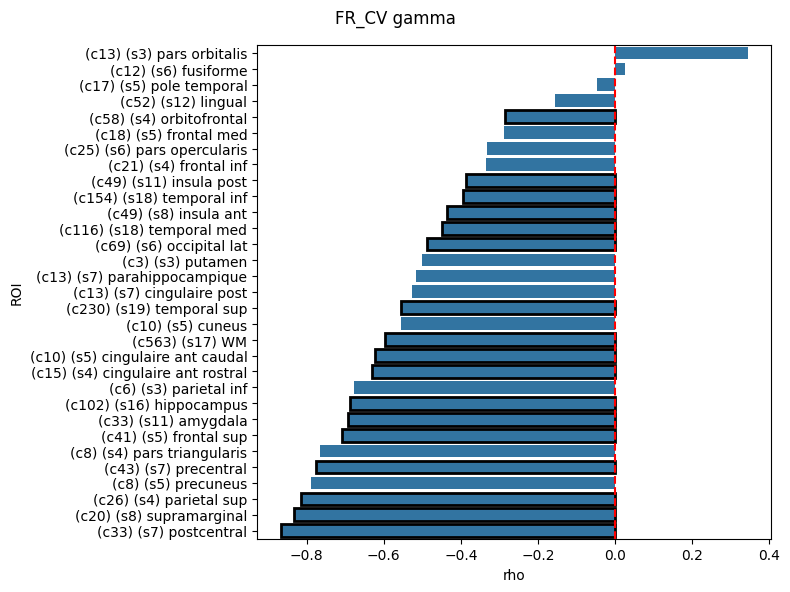

In [254]:
for band in band_list_global:

    df_plot = df_spearman_FR_CV.query(f"band == '{band}'").sort_values('rho', ascending=False)

    ROI_labels = []
    for ROI in df_plot['ROI'].unique():
        _count_plot = df_ROI_count_FR_CV.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
        _count_sujet = df_ROI_count_FR_CV.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
        ROI_labels.append(f"(c{_count_plot}) (s{_count_sujet}) {ROI}")

    plt.figure(figsize=(8, 6))
    ax = sns.barplot(data=df_plot, x='rho', y='ROI')

    # Horizontal line at 0
    ax.axvline(0, color='r', linestyle='--')

    # Set custom x-tick labels
    ax.set_yticklabels(ROI_labels)

    # Add black border to bars where p == 1
    for patch, (_, row) in zip(ax.patches, df_plot.iterrows()):
        if row['signi'] == True:
            patch.set_edgecolor('black')
            patch.set_linewidth(2)
        else:
            patch.set_edgecolor('none')  # no border for non-significant bars

    plt.suptitle(f"FR_CV {band}")
    plt.tight_layout()
    plt.show()

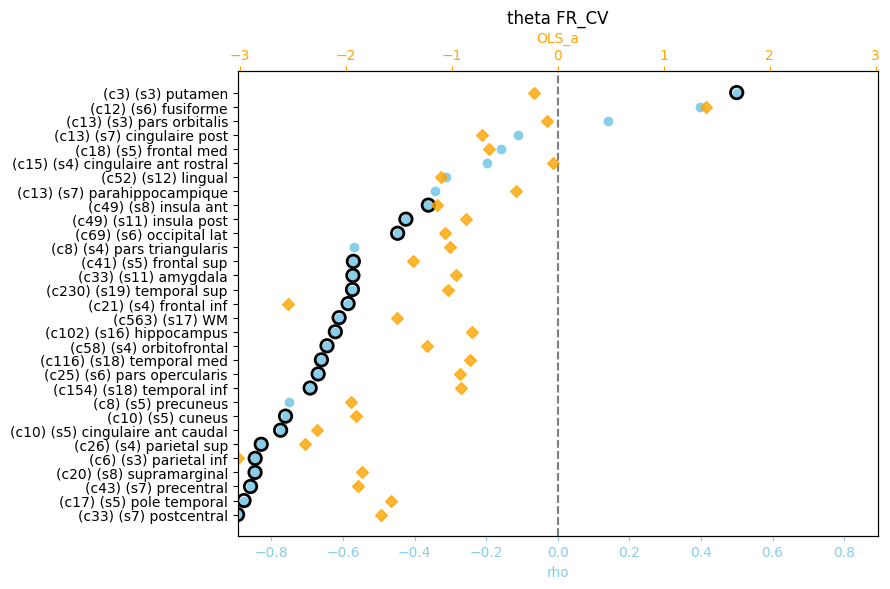

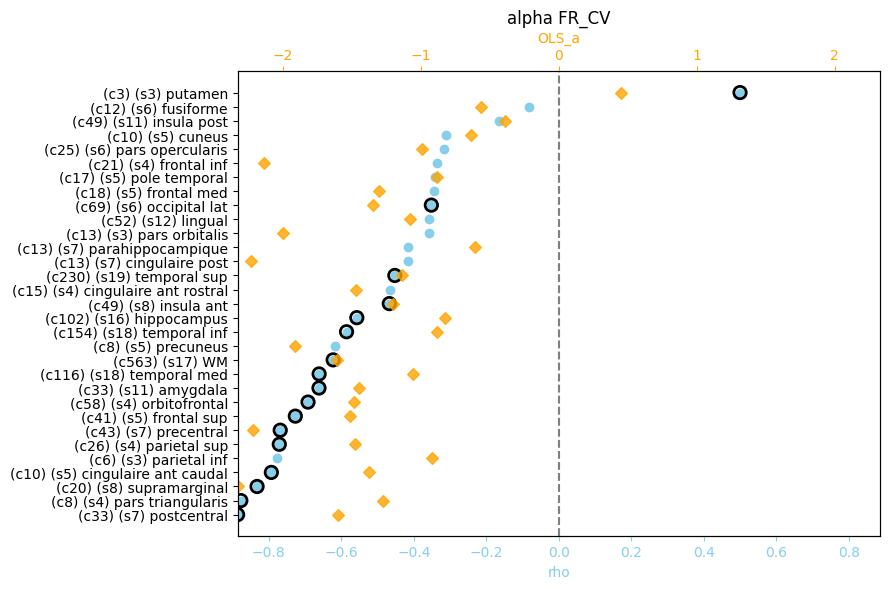

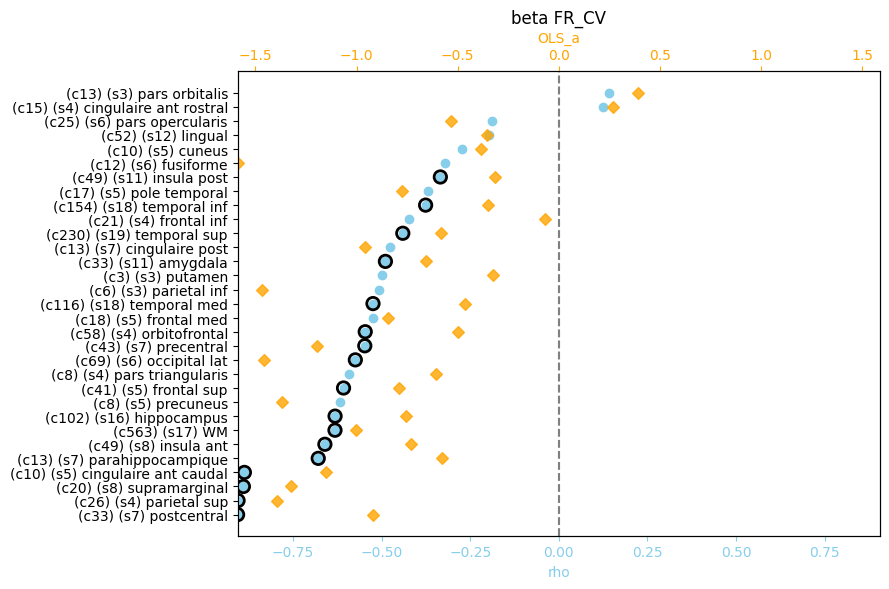

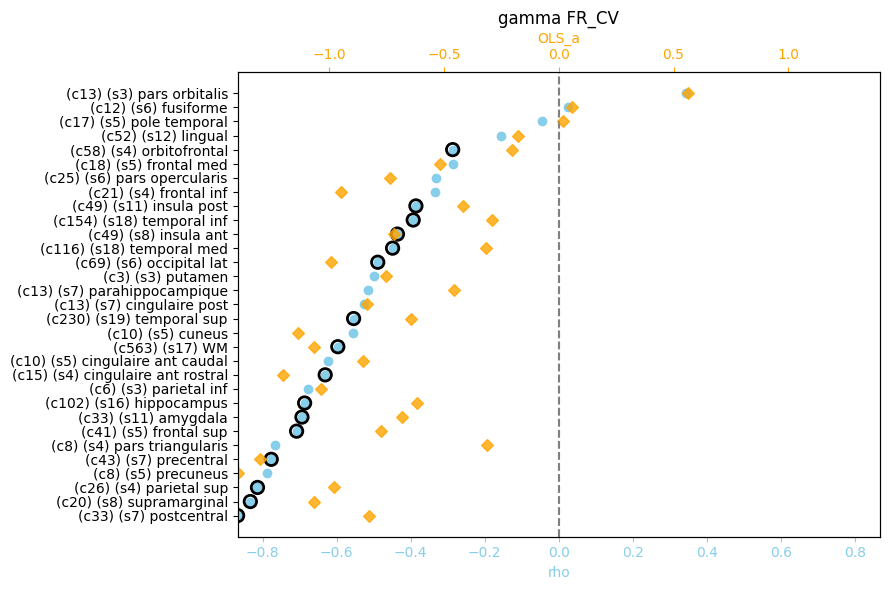

In [26]:
for band in band_list_global:

    # Sort DataFrame
    df_plot = df_OLSSP_FR_CV.query(f"band == '{band}'").sort_values('rho', ascending=True).reset_index(drop=True)

    # Build y labels
    ROI_labels = []
    for ROI in df_plot['ROI']:
        _count_plot = df_ROI_count_FR_CV.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
        _count_sujet = df_ROI_count_FR_CV.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
        ROI_labels.append(f"(c{_count_plot}) (s{_count_sujet}) {ROI}")

    # Create figure
    fig, ax1 = plt.subplots(figsize=(9, 6))
    ax2 = ax1.twiny()

    y_pos = range(len(df_plot))

    # Plot rho
    ax1.scatter(df_plot['rho'], y_pos, color='skyblue', label='rho', zorder=3)

    # Highlight significant points
    for i, signi in enumerate(df_plot['signi']):
        if signi:
            ax1.scatter(df_plot['rho'].iloc[i], y_pos[i], facecolors='none', edgecolors='black', s=80, linewidths=2, zorder=4)

    # Plot OLS_a
    ax2.scatter(df_plot['OLS_a'], y_pos, color='orange', alpha=0.8, label='OLS_a', zorder=2, marker='D')

    # Align 0 by setting symmetric limits on both axes
    # Use the max absolute value across both axes
    x1_vals = df_plot['rho']
    x2_vals = df_plot['OLS_a']
    max_range_x1 = max(abs(x1_vals).min(), abs(x1_vals).max())
    max_range_x2 = max(abs(x2_vals).min(), abs(x2_vals).max())

    ax1.set_xlim(-max_range_x1, max_range_x1)
    ax2.set_xlim(-max_range_x2, max_range_x2)

    # Add zero lines
    ax1.axvline(0, color='gray', linestyle='--')
    ax2.axvline(0, color='gray', linestyle='--', alpha=0.5)

    # Formatting
    ax1.set_yticks(y_pos)
    ax1.set_yticklabels(ROI_labels)
    ax1.set_xlabel("rho", color='skyblue')
    ax2.set_xlabel("OLS_a", color='orange')

    ax1.tick_params(axis='x', colors='skyblue')
    ax2.tick_params(axis='x', colors='orange')
    ax1.set_title(f"{band} FR_CV")

    plt.tight_layout()
    plt.show()


/home/jules.granget/myenvs/py311/lib/python3.11/site-packages/seaborn/axisgrid.py:453: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=figsize)


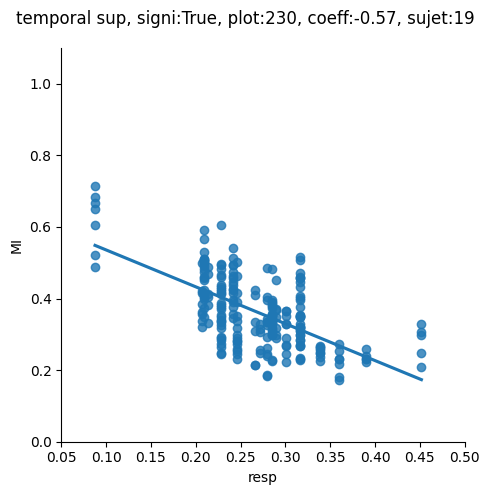

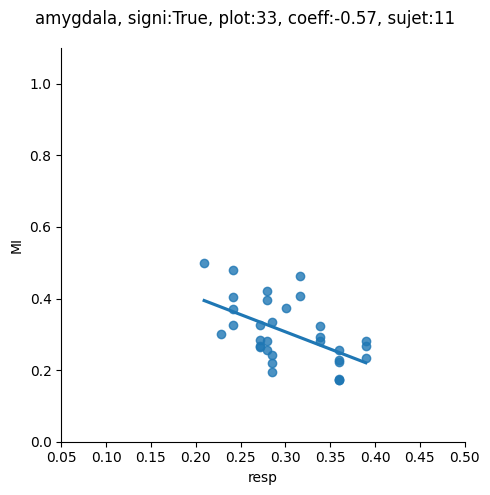

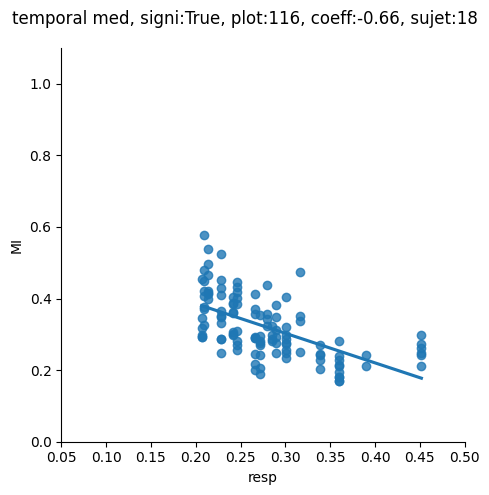

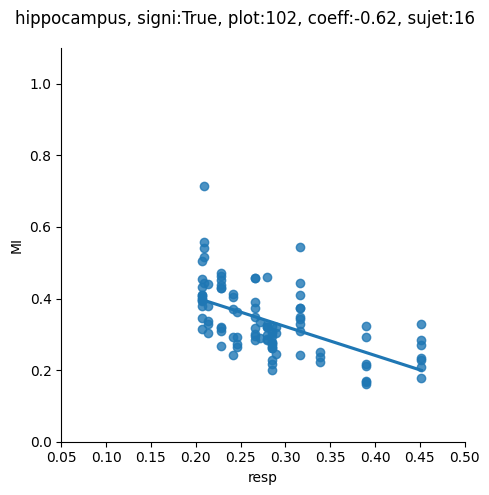

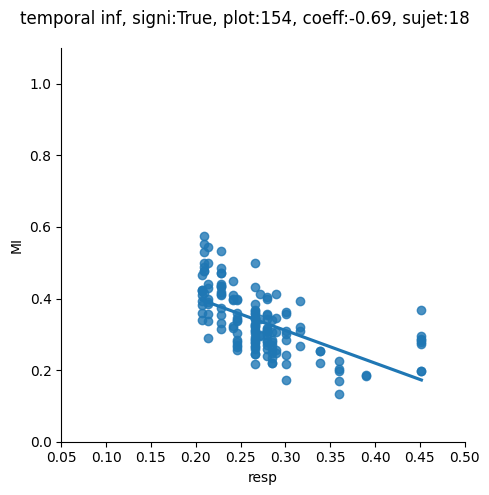

...

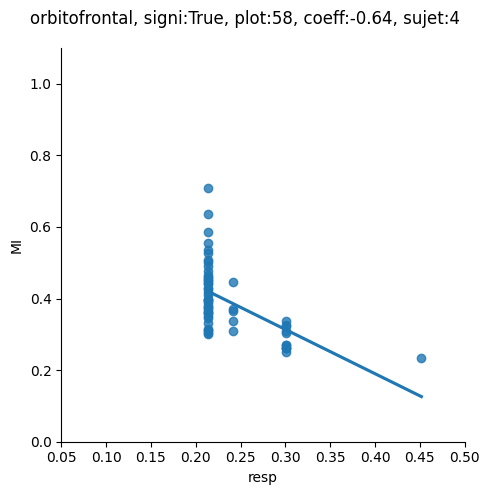

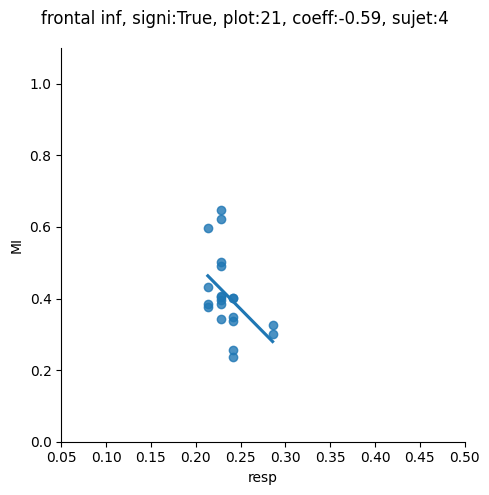

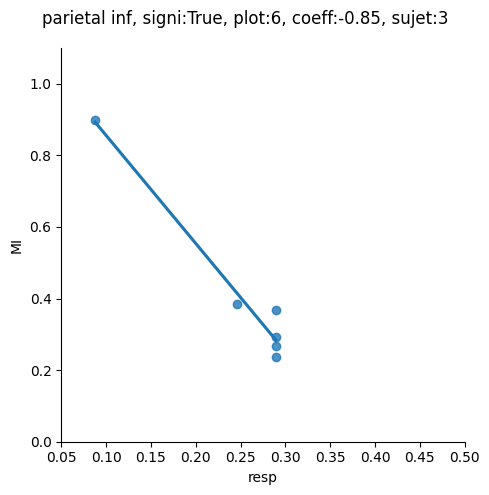

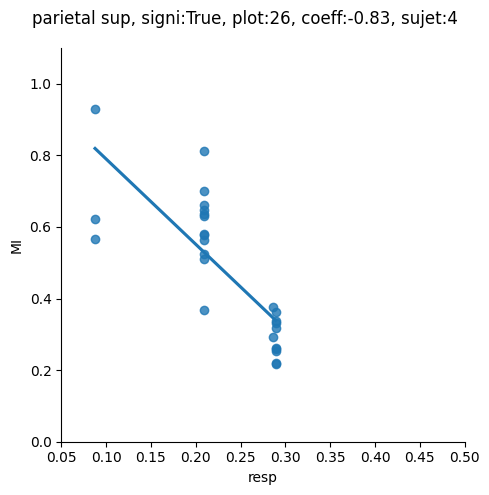

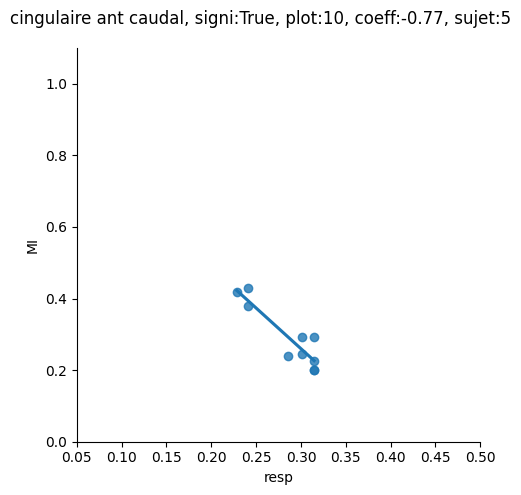

In [27]:
band = 'theta'

for ROI in MI_ROI_list_FR_CV_filt:

    if df_spearman_FR_CV.query(f"ROI == '{ROI}' and band == '{band}'")['signi'].values == False:
        continue
    
    pval = df_spearman_FR_CV.query(f"ROI == '{ROI}' and band == '{band}'")['signi'].values[0]
    sns.lmplot(x="resp", y="MI", data=df_MI_FR_CV.query(f"ROI == '{ROI}' and band == '{band}'"),  ci=None)
    _coeff = df_spearman_FR_CV.query(f"ROI == '{ROI}' and band == '{band}'")['rho'].values[0]
    plt.ylim(0,1.1)
    plt.xlim(0.05,0.5)
    _count_plot = df_ROI_count_FR_CV.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
    _count_sujet = df_ROI_count_FR_CV.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
    plt.suptitle(f"{ROI}, signi:{pval}, plot:{_count_plot}, coeff:{np.round(_coeff, 2)}, sujet:{_count_sujet}")
    plt.tight_layout()

## ATTENTION

### Z stats

In [28]:
_title_stat = ''
for band in band_list_global:

    counts = [df_MI_ALLCOND.query(f"cond == 'FR_CV' and band == '{band}'")['MI_signi'].sum(), 
            df_MI_ALLCOND.query(f"cond == 'RD_CV' and band == '{band}'")['MI_signi'].sum()]
    nobs = [df_MI_ALLCOND.query(f"cond == 'FR_CV' and band == '{band}'").shape[0], df_MI_ALLCOND.query(f"cond == 'FR_CV' and band == '{band}'").shape[0]]

    stat, pval = proportions_ztest(count=counts, nobs=nobs)
    print(f"{band} Z = {stat:.3f}, p = {pval:.3f}")
    _title_stat += f"{band}:p={pval:.3f}"

theta Z = -7.296, p = 0.000
alpha Z = -5.725, p = 0.000
beta Z = -7.898, p = 0.000
gamma Z = -7.726, p = 0.000


In [29]:
data_df = {'cond' : [], 'band' : [], 'ROI' : [], 'MI_p' : []}

for band in band_list_global:

    for cond in ['FR_CV', 'RD_CV']:

        for ROI in Cxy_ROI_list_ALLCOND_filt:
            
            signi = df_MI_ALLCOND.query(f"cond == '{cond}' and ROI == '{ROI}'and band == '{band}'")['MI_signi'].sum()
            prop_Cxy = signi/df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
            
            data_df['cond'].append(cond)
            data_df['band'].append(band)
            data_df['ROI'].append(ROI)
            data_df['MI_p'].append(prop_Cxy)

df_MI_p = pd.DataFrame(data_df) 

Text(0.5, 1.0, 'theta:p=0.000alpha:p=0.000beta:p=0.000gamma:p=0.000')

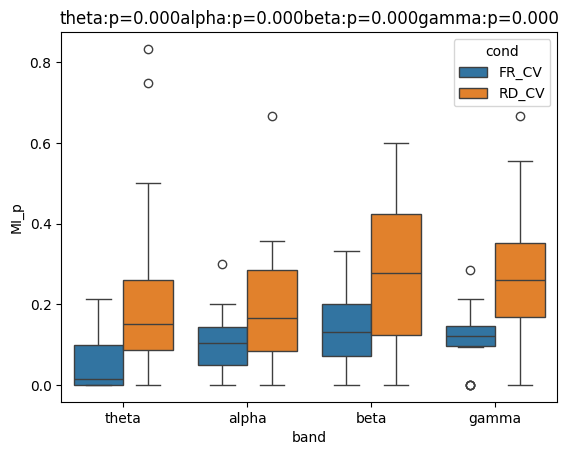

In [30]:
sns.boxplot(data=df_MI_p, x="band", y="MI_p", hue='cond') 
plt.title(_title_stat)

In [31]:
data_df = {'band' : [], 'ROI' : [], 'MI_p_diff' : [], 'pval' : []}

for band in band_list_global:

    for ROI in MI_ROI_list_ALLCOND_filt:
        
        signi_baseline = df_MI_ALLCOND.query(f"band == '{band}' and cond == 'FR_CV' and ROI == '{ROI}'")['MI_signi'].sum()
        prop_MI_baseline = signi_baseline/df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]

        signi_cond = df_MI_ALLCOND.query(f"band == '{band}' and cond == 'RD_CV' and ROI == '{ROI}'")['MI_signi'].sum()
        prop_MI_cond = signi_cond/df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]

        counts = [signi_baseline, signi_cond]
        nobs = [df_MI_ALLCOND.query(f"band == '{band}' and cond == 'FR_CV' and ROI == '{ROI}'").shape[0], df_MI_ALLCOND.query(f"band == '{band}' and cond == 'FR_CV' and ROI == '{ROI}'").shape[0]]
        stat, pval = proportions_ztest(count=counts, nobs=nobs)
        
        data_df['band'].append(band)
        data_df['ROI'].append(ROI)
        data_df['pval'].append(pval)
        data_df['MI_p_diff'].append(prop_MI_cond - prop_MI_baseline)

df_MI_p_diff = pd.DataFrame(data_df) 

/home/jules.granget/myenvs/py311/lib/python3.11/site-packages/statsmodels/stats/weightstats.py:792: RuntimeWarning: invalid value encountered in scalar divide
  zstat = value / std
/home/jules.granget/myenvs/py311/lib/python3.11/site-packages/statsmodels/stats/weightstats.py:792: RuntimeWarning: invalid value encountered in scalar divide
  zstat = value / std
/home/jules.granget/myenvs/py311/lib/python3.11/site-packages/statsmodels/stats/weightstats.py:792: RuntimeWarning: invalid value encountered in scalar divide
  zstat = value / std
/home/jules.granget/myenvs/py311/lib/python3.11/site-packages/statsmodels/stats/weightstats.py:792: RuntimeWarning: invalid value encountered in scalar divide
  zstat = value / std


In [32]:
df_MI_p_diff

,band,ROI,MI_p_diff,pval
0,theta,temporal sup,-0.026316,0.449439
1,theta,amygdala,0.333333,0.057780
2,theta,temporal med,0.117647,0.045736
3,theta,hippocampus,0.067797,0.093706
4,theta,temporal inf,0.072917,0.016847
...,...,...,...,...
83,gamma,insula ant,0.028571,0.742596
84,gamma,pars opercularis,0.133333,0.361310
85,gamma,frontal sup,0.100000,0.531168
86,gamma,parietal inf,0.166667,0.296270


/tmp/ipykernel_167005/1598011714.py:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ROI_labels)


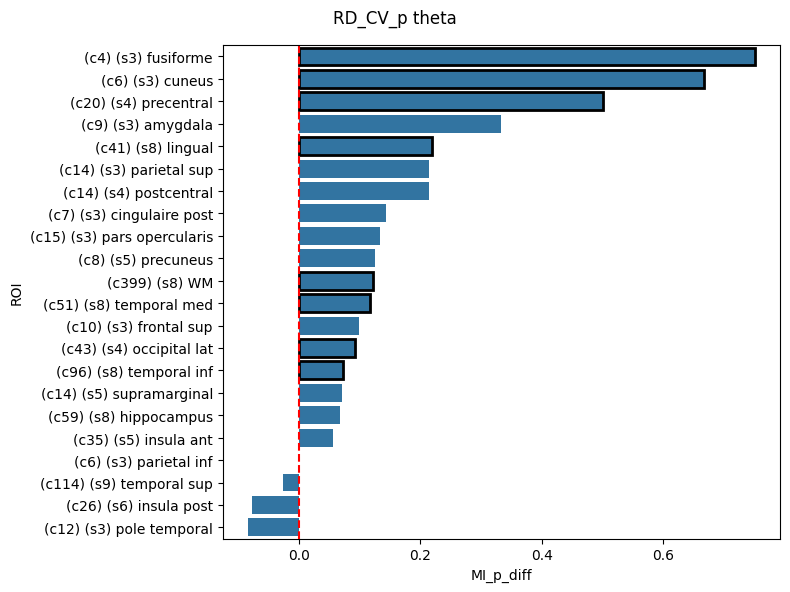

/tmp/ipykernel_167005/1598011714.py:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ROI_labels)


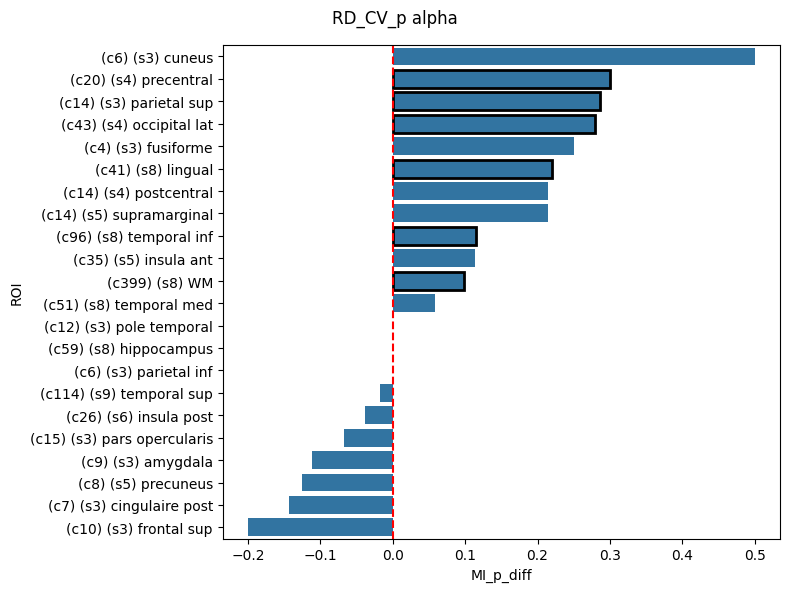

/tmp/ipykernel_167005/1598011714.py:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ROI_labels)


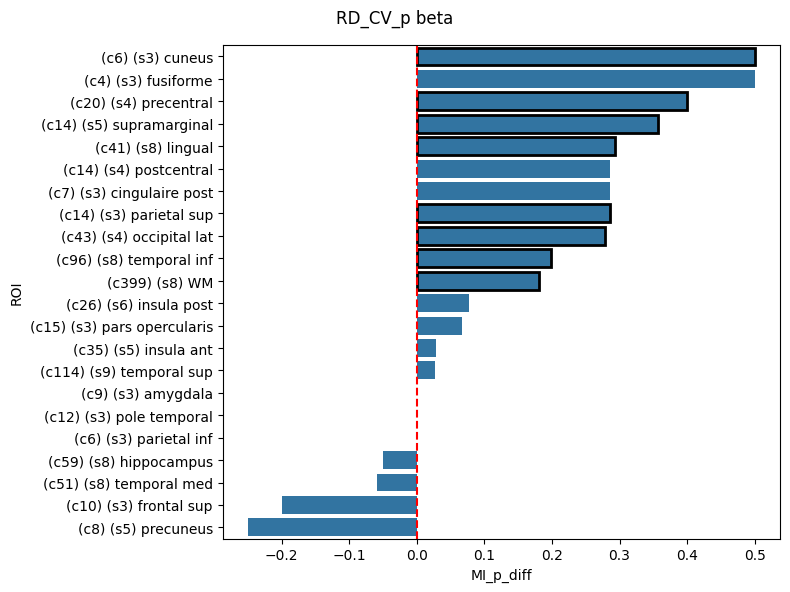

/tmp/ipykernel_167005/1598011714.py:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ROI_labels)


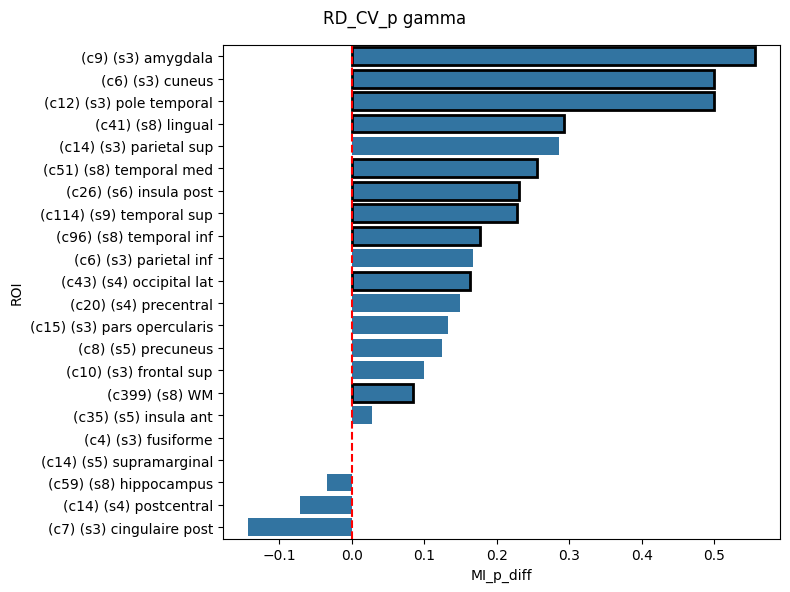

In [33]:
for band in band_list_global:

    df_plot = df_MI_p_diff.query(f"band == '{band}'").sort_values('MI_p_diff', ascending=False)

    ROI_labels = []
    for ROI in df_plot['ROI'].unique():
        _count_plot = df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
        _count_sujet = df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
        ROI_labels.append(f"(c{_count_plot}) (s{_count_sujet}) {ROI}")

    plt.figure(figsize=(8, 6))
    ax = sns.barplot(data=df_plot, x='MI_p_diff', y='ROI')

    # Horizontal line at 0
    ax.axvline(0, color='r', linestyle='--')

    # Set custom x-tick labels
    ax.set_yticklabels(ROI_labels)

    # Add black border to bars where p == 1
    for patch, (_, row) in zip(ax.patches, df_plot.iterrows()):
        if row['pval'] < 0.05:
            patch.set_edgecolor('black')
            patch.set_linewidth(2)
        else:
            patch.set_edgecolor('none')  # no border for non-significant bars

    plt.suptitle(f"RD_CV_p {band}")
    plt.tight_layout()
    plt.show()

### RESPI FOLLOW SPEARMAN

In [34]:
def single_permutation(_df, x_obs, i):

    _vec_perm = []

    for row_i, row in _df.iterrows():

        _sujet = row['sujet']
        _pos_allowed = np.where(_df['sujet'] != _sujet)[0]
        _pos_allowed = np.array([i for i in _pos_allowed if i not in _vec_perm])
        try:
            _vec_perm.append(_pos_allowed[np.random.randint(_pos_allowed.size)]) 
        except:
            _pos_missing = np.array([i for i in range(_df.shape[0]) if i not in _vec_perm])
            _vec_perm.append(_pos_missing[np.random.randint(_pos_missing.size)]) 

    _vec_perm = np.array(_vec_perm)   
    y_perm = _df['MI'].values[_vec_perm]
    _rho, _ = scipy.stats.spearmanr(x_obs, y_perm)
    
    return _rho

def spearman_permutation_test_parallel(_df, n_perm, percentile_thresh_list, n_jobs=20):
    x_obs, y_obs = _df['MI'].values, _df['resp'].values
    rho_obs, _ = scipy.stats.spearmanr(x_obs, y_obs)

    null_dist = joblib.Parallel(n_jobs=n_jobs)(
        joblib.delayed(single_permutation)(_df, x_obs, i)
        for i in range(n_perm)
    )

    null_dist = np.array(null_dist)
    lower, upper = np.percentile(null_dist, percentile_thresh_list)
    signi = rho_obs < lower or rho_obs > upper

    return rho_obs, signi

# Wrapper (unchanged)
def run_one_roi(ROI, df, n_perm, percentile_thresh_list, band):
    _df = df.query(f"ROI == '{ROI}'")[['MI', 'resp', 'sujet']]
    rho, signi = spearman_permutation_test_parallel(_df, n_perm, percentile_thresh_list)
    print(f"{ROI} {band} done")
    return {'ROI': ROI, 'rho': rho, 'signi': signi, 'band': band}

# Parameters
percentile_thresh_list = [2.5, 97.5]
n_perm_spearman = 1000

df_spearman_FR_CV = pd.DataFrame()

for band in band_list_global:

    df_band = df_MI_FR_CV.query(f"band == '{band}'")
    # Run sequentially over ROIs, but each permutation test runs in parallel
    results = [run_one_roi(ROI, df_band, n_perm_spearman, percentile_thresh_list, band)
            for ROI in MI_ROI_list_FR_CV_filt]

    df_spearman_FR_CV = pd.concat([df_spearman_FR_CV, pd.DataFrame(results)], axis=0)


temporal sup theta done
amygdala theta done
temporal med theta done
hippocampus theta done
temporal inf theta done
parahippocampique theta done
pole temporal theta done
putamen theta done
insula post theta done
lingual theta done
WM theta done
cingulaire post theta done
precuneus theta done
supramarginal theta done
fusiforme theta done
cuneus theta done
occipital lat theta done
precentral theta done
postcentral theta done
insula ant theta done
pars opercularis theta done
frontal sup theta done
orbitofrontal theta done
pars orbitalis theta done
pars triangularis theta done
cingulaire ant rostral theta done
frontal inf theta done
parietal inf theta done
parietal sup theta done
frontal med theta done
cingulaire ant caudal theta done
temporal sup alpha done
amygdala alpha done
temporal med alpha done
hippocampus alpha done
temporal inf alpha done
parahippocampique alpha done
pole temporal alpha done
putamen alpha done
insula post alpha done
lingual alpha done
WM alpha done
cingulaire post 

In [35]:
def single_permutation(_df, x_obs, i):

    _vec_perm = []

    for row_i, row in _df.iterrows():

        _sujet = row['sujet']
        _pos_allowed = np.where(_df['sujet'] != _sujet)[0]
        _pos_allowed = np.array([i for i in _pos_allowed if i not in _vec_perm])
        try:
            _vec_perm.append(_pos_allowed[np.random.randint(_pos_allowed.size)]) 
        except:
            _pos_missing = np.array([i for i in range(_df.shape[0]) if i not in _vec_perm])
            _vec_perm.append(_pos_missing[np.random.randint(_pos_missing.size)]) 

    _vec_perm = np.array(_vec_perm)   
    y_perm = _df['MI'].values[_vec_perm]
    _rho, _ = scipy.stats.spearmanr(x_obs, y_perm)
    
    return _rho

def spearman_permutation_test_parallel(_df, n_perm, percentile_thresh_list, n_jobs=20):
    x_obs, y_obs = _df['MI'].values, _df['resp'].values
    rho_obs, _ = scipy.stats.spearmanr(x_obs, y_obs)

    null_dist = joblib.Parallel(n_jobs=n_jobs)(
        joblib.delayed(single_permutation)(_df, x_obs, i)
        for i in range(n_perm)
    )

    null_dist = np.array(null_dist)
    lower, upper = np.percentile(null_dist, percentile_thresh_list)
    signi = rho_obs < lower or rho_obs > upper

    return rho_obs, signi

# Wrapper (unchanged)
def run_one_roi(ROI, df, n_perm, percentile_thresh_list, band):
    _df = df.query(f"ROI == '{ROI}'")[['MI', 'resp', 'sujet']]
    rho, signi = spearman_permutation_test_parallel(_df, n_perm, percentile_thresh_list)
    print(f"{ROI} {band} done")
    return {'ROI': ROI, 'rho': rho, 'signi': signi, 'band': band}

# Parameters
percentile_thresh_list = [2.5, 97.5]
n_perm_spearman = 1000

df_spearman_RD_CV = pd.DataFrame()

for band in band_list_global:

    df_band = df_MI_ALLCOND.query(f"band == '{band}' and cond == 'RD_CV'")
    # Run sequentially over ROIs, but each permutation test runs in parallel
    results = [run_one_roi(ROI, df_band, n_perm_spearman, percentile_thresh_list, band)
            for ROI in MI_ROI_list_ALLCOND_filt]

    df_spearman_RD_CV = pd.concat([df_spearman_RD_CV, pd.DataFrame(results)], axis=0)


temporal sup theta done
amygdala theta done
temporal med theta done
hippocampus theta done
temporal inf theta done
pole temporal theta done
insula post theta done
lingual theta done
WM theta done
cingulaire post theta done
precuneus theta done
supramarginal theta done
fusiforme theta done
cuneus theta done
occipital lat theta done
precentral theta done
postcentral theta done
insula ant theta done
pars opercularis theta done
frontal sup theta done
parietal inf theta done
parietal sup theta done
temporal sup alpha done
amygdala alpha done
temporal med alpha done
hippocampus alpha done
temporal inf alpha done
pole temporal alpha done
insula post alpha done
lingual alpha done
WM alpha done
cingulaire post alpha done
precuneus alpha done
supramarginal alpha done
fusiforme alpha done
cuneus alpha done
occipital lat alpha done
precentral alpha done
postcentral alpha done
insula ant alpha done
pars opercularis alpha done
frontal sup alpha done
parietal inf alpha done
parietal sup alpha done
te

In [43]:
data = {'ROI' : [], 'band' : [], 'coeff' : [], 'intercept' : [], 'pval' : [], 'p' : []}

for ROI in MI_ROI_list_ALLCOND_filt:

    for band in band_list_global:

        _df_OLS = df_MI_ALLCOND.query(f"ROI == '{ROI}' and band == '{band}' and cond == 'RD_CV'")[['MI', 'resp']]

        x = _df_OLS['resp']
        y = _df_OLS['MI']

        x = sm.add_constant(x)

        mdl = sm.OLS(y, x).fit()
        mdl_fit = mdl.predict(x) 

        coeff = pd.read_html(mdl.summary().tables[1].as_html(), header=0, index_col=0)[0]['coef'].values[-1]
        intercept = pd.read_html(mdl.summary().tables[1].as_html(), header=0, index_col=0)[0]['coef'].values[0]
        pval = pd.read_html(mdl.summary().tables[1].as_html(), header=0, index_col=0)[0]['P>|t|'].values[-1]

        if pval < 0.05:

            p = 1

        else:

            p = 0

        data['ROI'].append(ROI)
        data['band'].append(band)
        data['coeff'].append(coeff)
        data['intercept'].append(intercept)
        data['pval'].append(pval)
        data['p'].append(p)


df_OLS_RD_CV = pd.DataFrame(data)

/tmp/ipykernel_167005/1190811942.py:17: FutureWarning: Passing literal html to 'read_html' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  coeff = pd.read_html(mdl.summary().tables[1].as_html(), header=0, index_col=0)[0]['coef'].values[-1]
/tmp/ipykernel_167005/1190811942.py:18: FutureWarning: Passing literal html to 'read_html' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  intercept = pd.read_html(mdl.summary().tables[1].as_html(), header=0, index_col=0)[0]['coef'].values[0]
/tmp/ipykernel_167005/1190811942.py:19: FutureWarning: Passing literal html to 'read_html' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  pval = pd.read_html(mdl.summary().tables[1].as_html(), header=0, index_col=0)[0]['P>|t|'].values[-1]
/tmp/ipykernel_167005/1190811942.py:17: FutureWarning: Passin

In [44]:
df_OLSSP_RD_CV = df_spearman_RD_CV.copy()
_coeff = []
for row_i, row_val in df_OLSSP_RD_CV.iterrows():
    _ROI, _band = row_val['ROI'], row_val['band']
    _coeff.append(df_OLS_RD_CV.query(f"band == '{_band}' and ROI == '{_ROI}'")['coeff'].iloc[0])
df_OLSSP_RD_CV['OLS_a'] = _coeff

In [36]:
df_spearman_RD_CV.query(f"band == 'theta' and signi == True")

,ROI,rho,signi,band
0,temporal sup,-0.684153,True,theta
1,amygdala,0.730297,True,theta
2,temporal med,-0.370242,True,theta
6,insula post,-0.515426,True,theta
8,WM,-0.601061,True,theta
11,supramarginal,-0.805699,True,theta
13,cuneus,0.493771,True,theta
14,occipital lat,-0.475740,True,theta
15,precentral,-0.226508,True,theta
19,frontal sup,-0.726599,True,theta


/tmp/ipykernel_167005/2659655075.py:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ROI_labels)


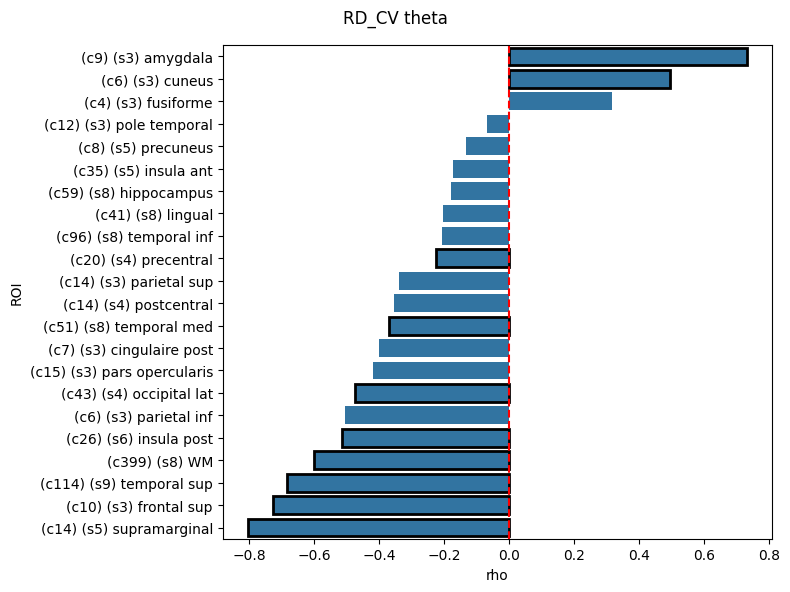

/tmp/ipykernel_167005/2659655075.py:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ROI_labels)


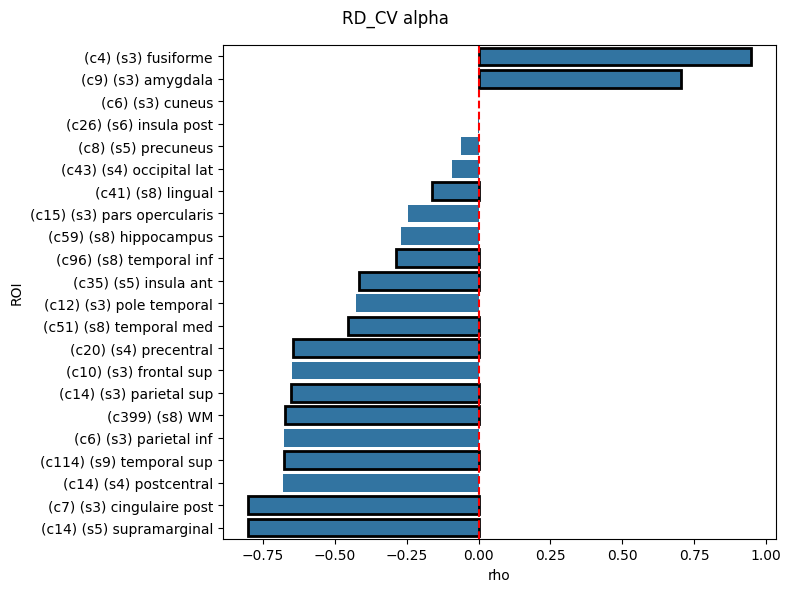

/tmp/ipykernel_167005/2659655075.py:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ROI_labels)


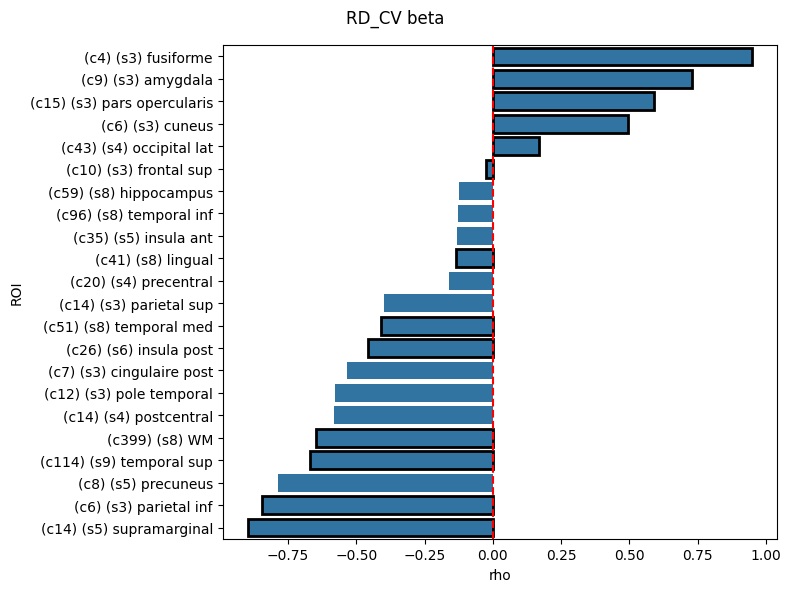

/tmp/ipykernel_167005/2659655075.py:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ROI_labels)


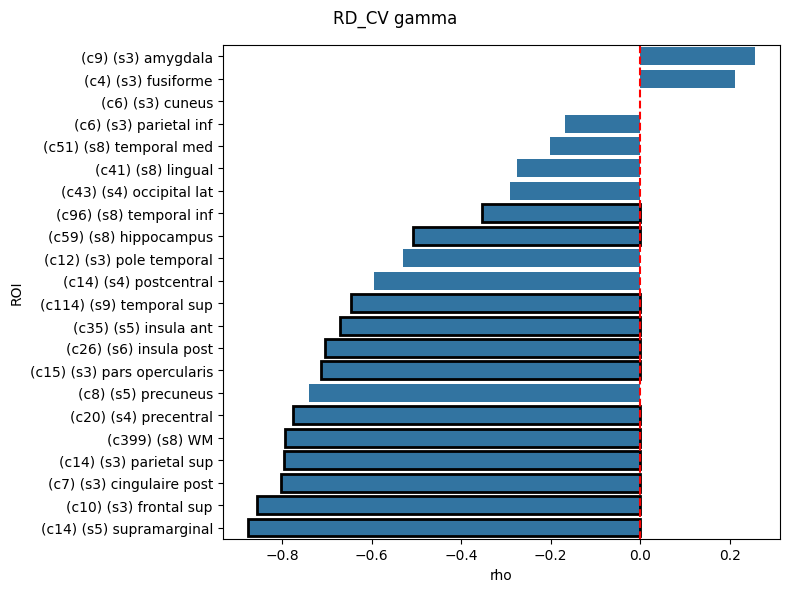

In [37]:
for band in band_list_global:

    df_plot = df_spearman_RD_CV.query(f"band == '{band}'").sort_values('rho', ascending=False)

    ROI_labels = []
    for ROI in df_plot['ROI'].unique():
        _count_plot = df_ROI_count_ALLCOND_Pxx.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
        _count_sujet = df_ROI_count_ALLCOND_Pxx.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
        ROI_labels.append(f"(c{_count_plot}) (s{_count_sujet}) {ROI}")

    plt.figure(figsize=(8, 6))
    ax = sns.barplot(data=df_plot, x='rho', y='ROI')

    # Horizontal line at 0
    ax.axvline(0, color='r', linestyle='--')

    # Set custom x-tick labels
    ax.set_yticklabels(ROI_labels)

    # Add black border to bars where p == 1
    for patch, (_, row) in zip(ax.patches, df_plot.iterrows()):
        if row['signi'] == True:
            patch.set_edgecolor('black')
            patch.set_linewidth(2)
        else:
            patch.set_edgecolor('none')  # no border for non-significant bars

    plt.suptitle(f"RD_CV {band}")
    plt.tight_layout()
    plt.show()

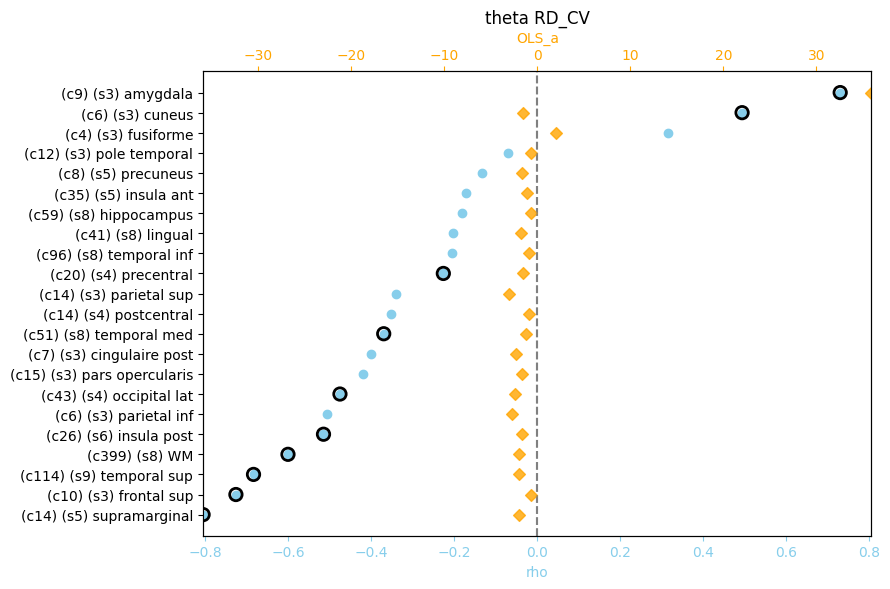

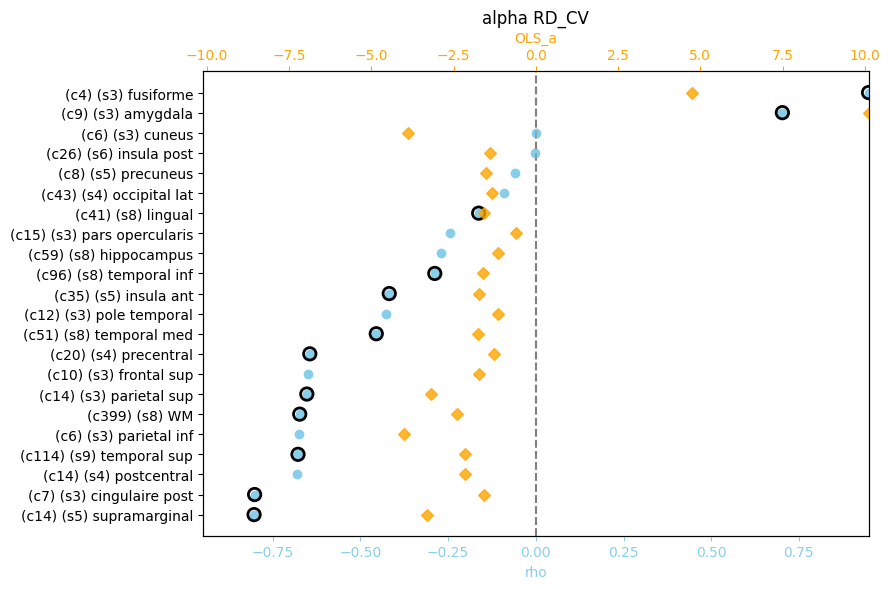

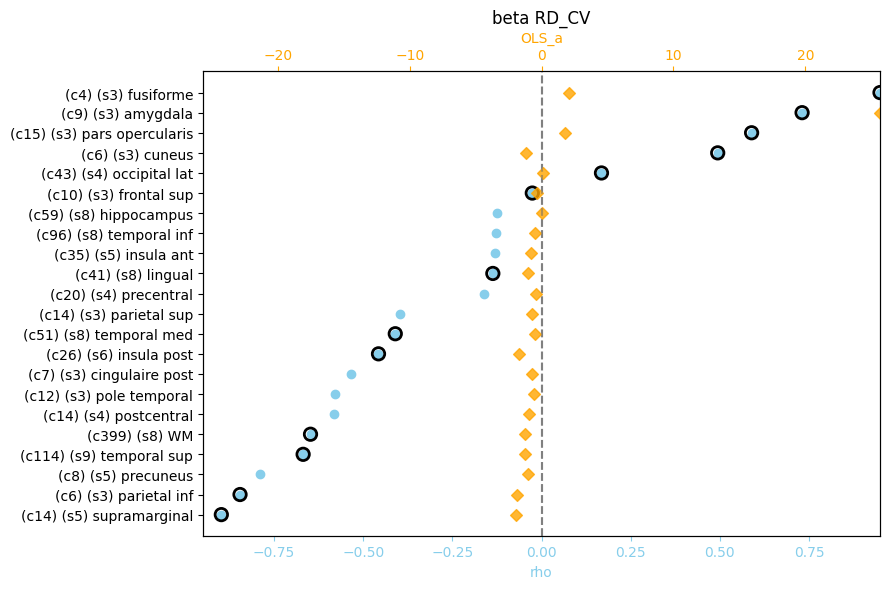

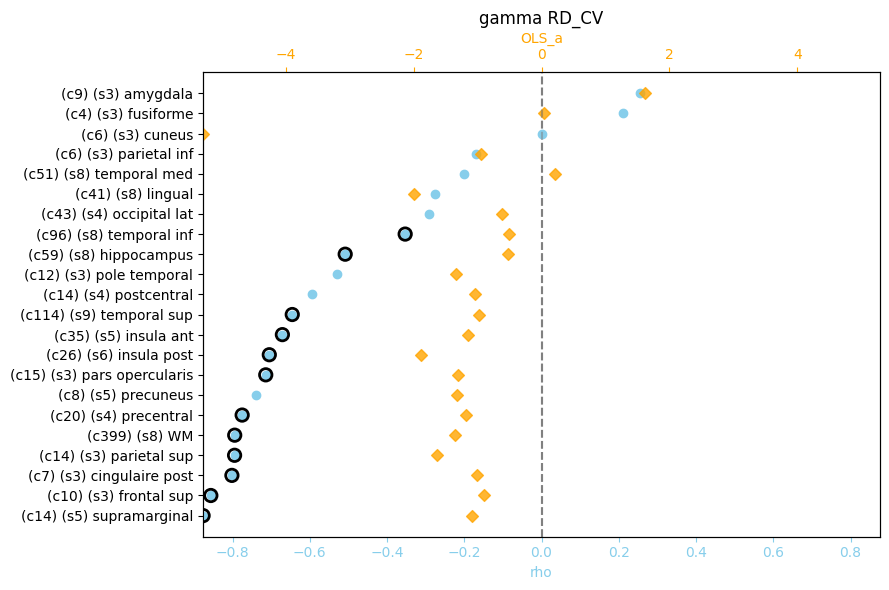

In [46]:
for band in band_list_global:

    # Sort DataFrame
    df_plot = df_OLSSP_RD_CV.query(f"band == '{band}'").sort_values('rho', ascending=True).reset_index(drop=True)

    # Build y labels
    ROI_labels = []
    for ROI in df_plot['ROI']:
        _count_plot = df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
        _count_sujet = df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
        ROI_labels.append(f"(c{_count_plot}) (s{_count_sujet}) {ROI}")

    # Create figure
    fig, ax1 = plt.subplots(figsize=(9, 6))
    ax2 = ax1.twiny()

    y_pos = range(len(df_plot))

    # Plot rho
    ax1.scatter(df_plot['rho'], y_pos, color='skyblue', label='rho', zorder=3)

    # Highlight significant points
    for i, signi in enumerate(df_plot['signi']):
        if signi:
            ax1.scatter(df_plot['rho'].iloc[i], y_pos[i], facecolors='none', edgecolors='black', s=80, linewidths=2, zorder=4)

    # Plot OLS_a
    ax2.scatter(df_plot['OLS_a'], y_pos, color='orange', alpha=0.8, label='OLS_a', zorder=2, marker='D')

    # Align 0 by setting symmetric limits on both axes
    # Use the max absolute value across both axes
    x1_vals = df_plot['rho']
    x2_vals = df_plot['OLS_a']
    max_range_x1 = max(abs(x1_vals).min(), abs(x1_vals).max())
    max_range_x2 = max(abs(x2_vals).min(), abs(x2_vals).max())

    ax1.set_xlim(-max_range_x1, max_range_x1)
    ax2.set_xlim(-max_range_x2, max_range_x2)

    # Add zero lines
    ax1.axvline(0, color='gray', linestyle='--')
    ax2.axvline(0, color='gray', linestyle='--', alpha=0.5)

    # Formatting
    ax1.set_yticks(y_pos)
    ax1.set_yticklabels(ROI_labels)
    ax1.set_xlabel("rho", color='skyblue')
    ax2.set_xlabel("OLS_a", color='orange')

    ax1.tick_params(axis='x', colors='skyblue')
    ax2.tick_params(axis='x', colors='orange')
    ax1.set_title(f"{band} RD_CV")

    plt.tight_layout()
    plt.show()


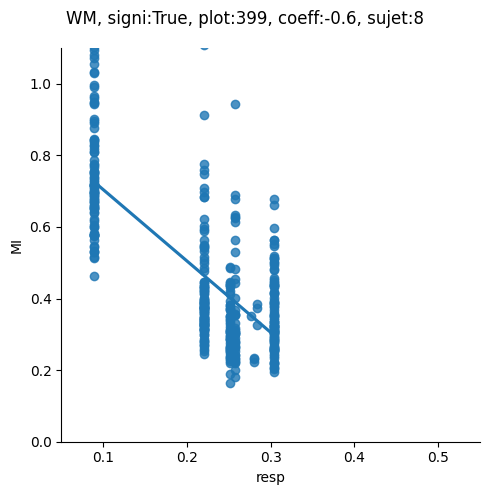

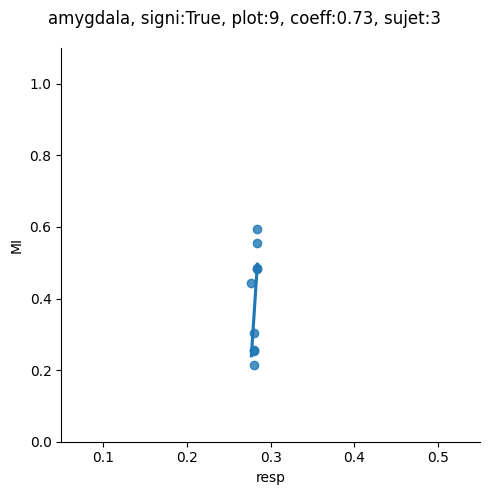

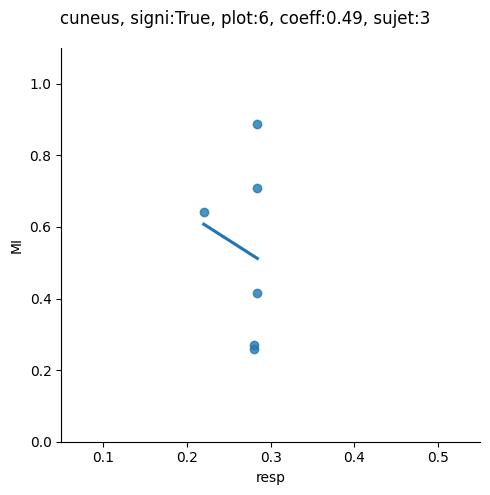

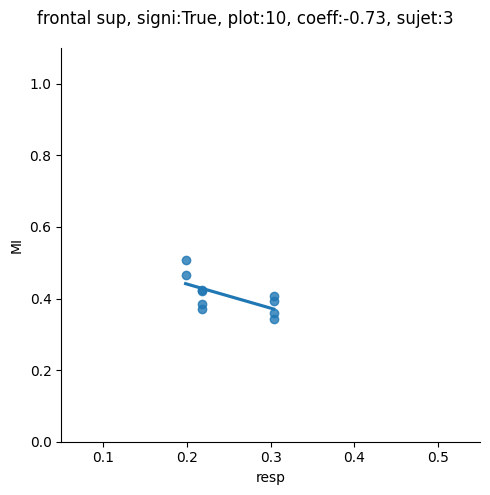

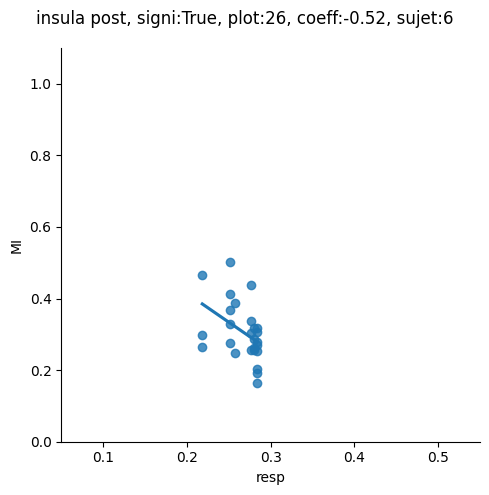

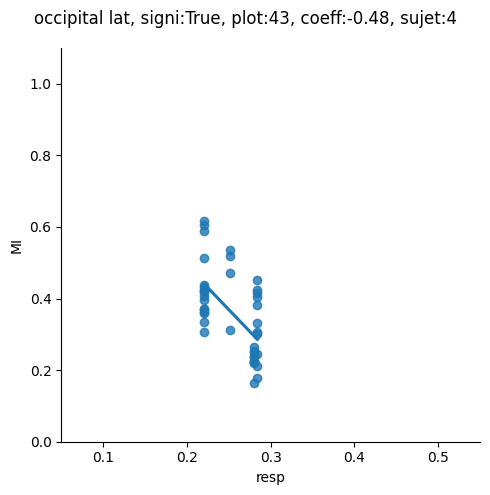

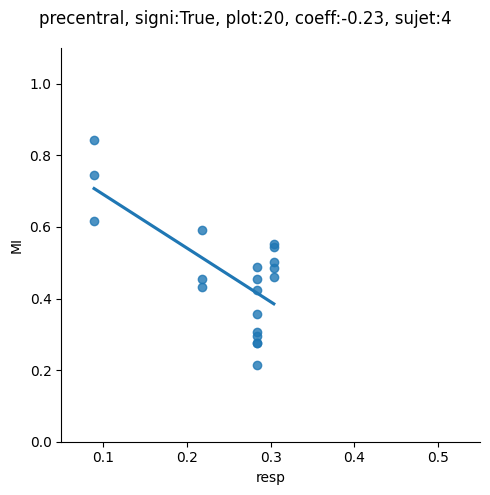

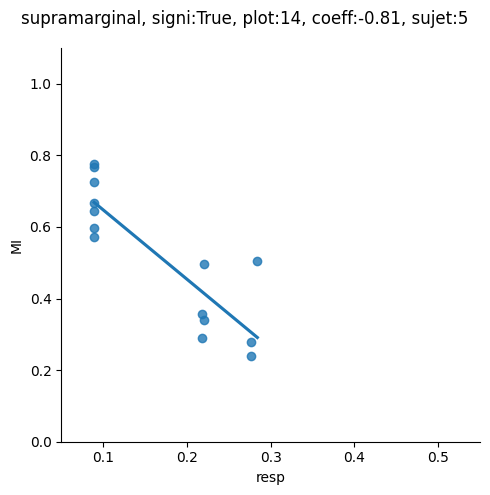

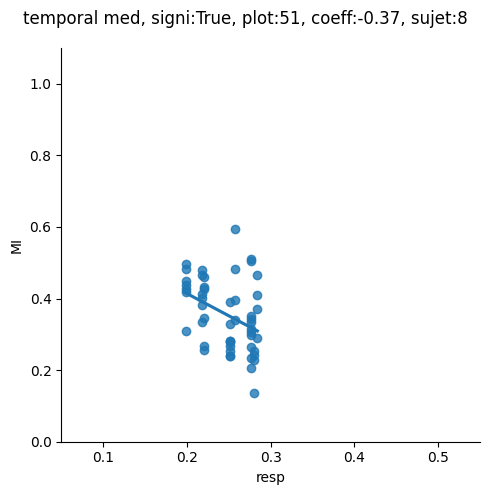

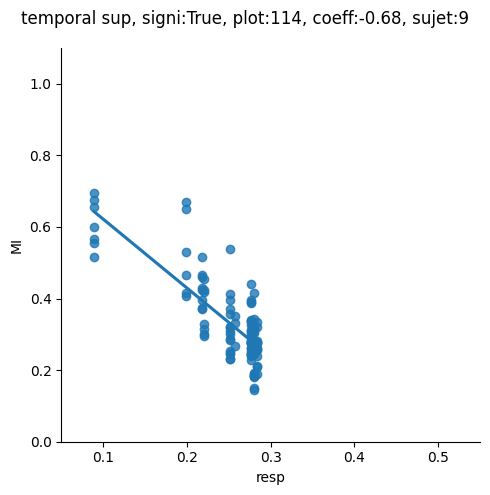

In [38]:
band = 'theta'

for ROI in df_ROI_count_ALLCOND_Pxx['ROI']:

    if df_spearman_RD_CV.query(f"ROI == '{ROI}' and band == '{band}'")['signi'].values == False:
        continue
    
    pval = df_spearman_RD_CV.query(f"ROI == '{ROI}' and band == '{band}'")['signi'].values[0]
    sns.lmplot(x="resp", y="MI", data=df_MI_ALLCOND.query(f"ROI == '{ROI}' and band == '{band}' and cond == 'RD_CV'"),  ci=None)
    _coeff = df_spearman_RD_CV.query(f"ROI == '{ROI}' and band == '{band}'")['rho'].values[0]
    plt.ylim(0,1.1)
    plt.xlim(0.05,0.55)
    _count_plot = df_ROI_count_ALLCOND_Pxx.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
    _count_sujet = df_ROI_count_ALLCOND_Pxx.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
    plt.suptitle(f"{ROI}, signi:{pval}, plot:{_count_plot}, coeff:{np.round(_coeff, 2)}, sujet:{_count_sujet}")
    plt.tight_layout()

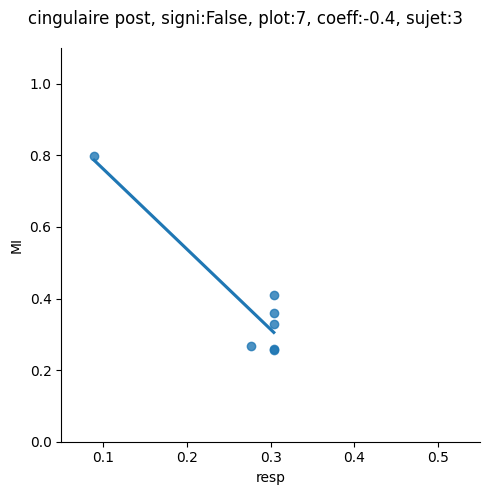

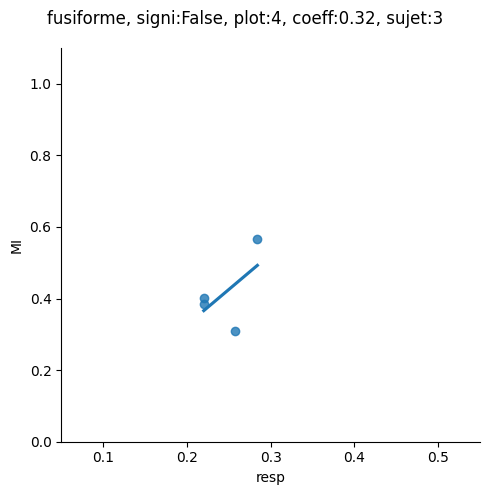

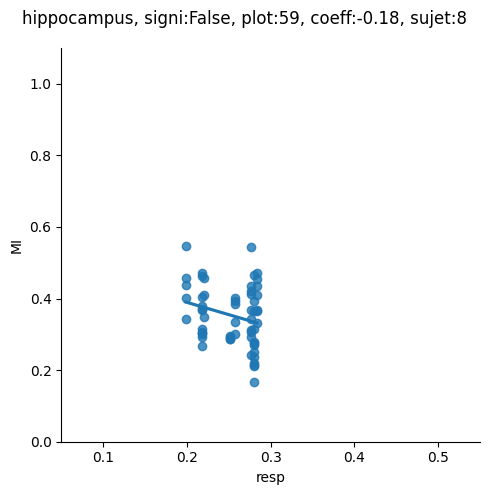

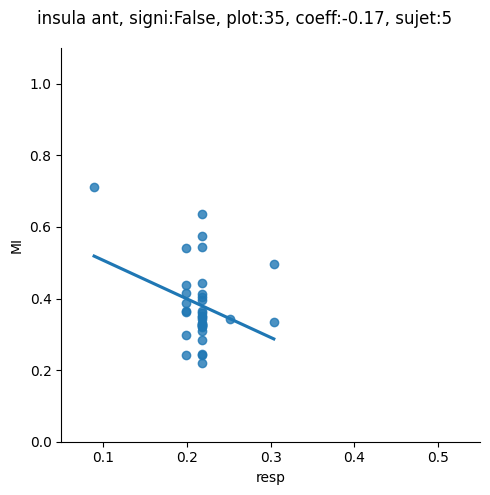

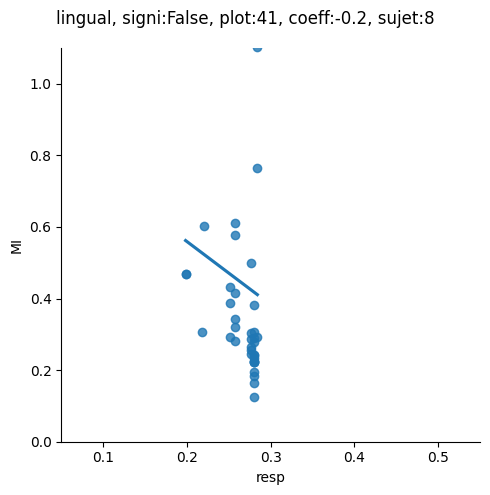

...

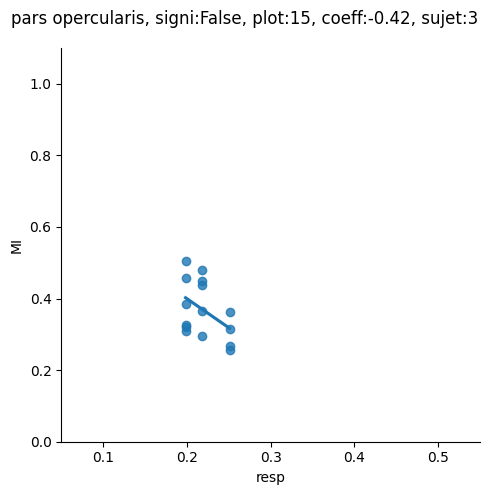

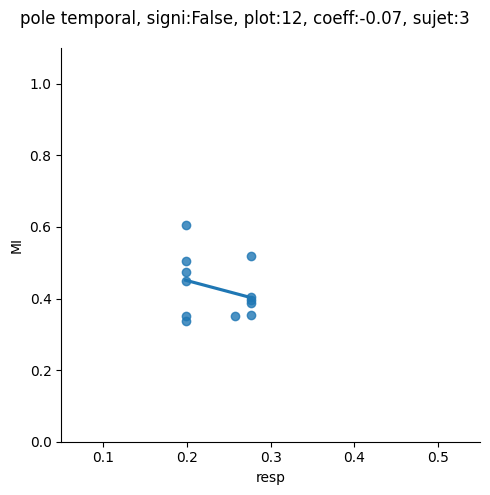

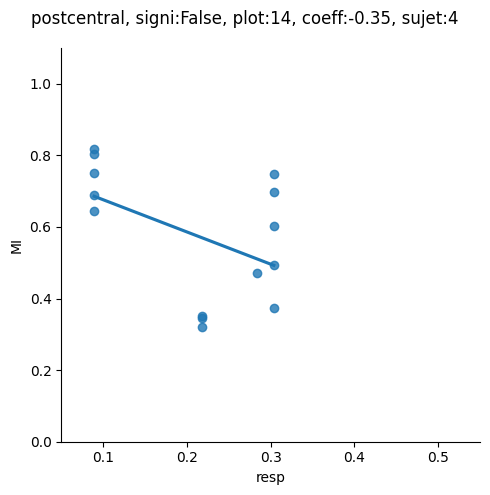

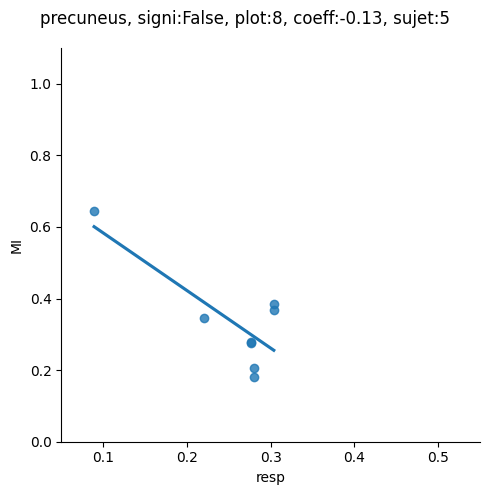

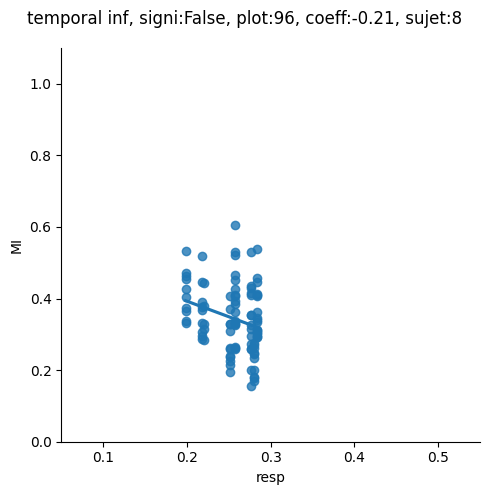

In [39]:
band = 'theta'

for ROI in df_ROI_count_ALLCOND_Pxx['ROI']:

    if df_spearman_RD_CV.query(f"ROI == '{ROI}' and band == '{band}'")['signi'].values == True:
        continue
    
    pval = df_spearman_RD_CV.query(f"ROI == '{ROI}' and band == '{band}'")['signi'].values[0]
    sns.lmplot(x="resp", y="MI", data=df_MI_ALLCOND.query(f"ROI == '{ROI}' and band == '{band}' and cond == 'RD_CV'"),  ci=None)
    _coeff = df_spearman_RD_CV.query(f"ROI == '{ROI}' and band == '{band}'")['rho'].values[0]
    plt.ylim(0,1.1)
    plt.xlim(0.05,0.55)
    _count_plot = df_ROI_count_ALLCOND_Pxx.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
    _count_sujet = df_ROI_count_ALLCOND_Pxx.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
    plt.suptitle(f"{ROI}, signi:{pval}, plot:{_count_plot}, coeff:{np.round(_coeff, 2)}, sujet:{_count_sujet}")
    plt.tight_layout()

In [40]:
df_spearman_FR_CV['cond'] = ['FR_CV'] * df_spearman_FR_CV.shape[0]
df_spearman_RD_CV['cond'] = ['RD_CV'] * df_spearman_RD_CV.shape[0]
df_spearman_both_CV = pd.concat([df_spearman_FR_CV, df_spearman_RD_CV])

ROI_FR_CV_not_in_RD_CV = [ROI for ROI in df_spearman_FR_CV['ROI'].unique() if ROI not in df_spearman_RD_CV['ROI'].unique()]
df_spearman_both_CV = df_spearman_both_CV.query(f"ROI not in {ROI_FR_CV_not_in_RD_CV}")

In [41]:
df_spearman_both_CV

,ROI,rho,signi,band,cond
0,temporal sup,-0.573392,True,theta,FR_CV
1,amygdala,-0.572212,True,theta,FR_CV
2,temporal med,-0.660169,True,theta,FR_CV
3,hippocampus,-0.621270,True,theta,FR_CV
4,temporal inf,-0.691602,True,theta,FR_CV
...,...,...,...,...,...
17,insula ant,-0.671067,True,gamma,RD_CV
18,pars opercularis,-0.714153,True,gamma,RD_CV
19,frontal sup,-0.856349,True,gamma,RD_CV
20,parietal inf,-0.169031,False,gamma,RD_CV


/tmp/ipykernel_167005/3992451347.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ROI_labels)


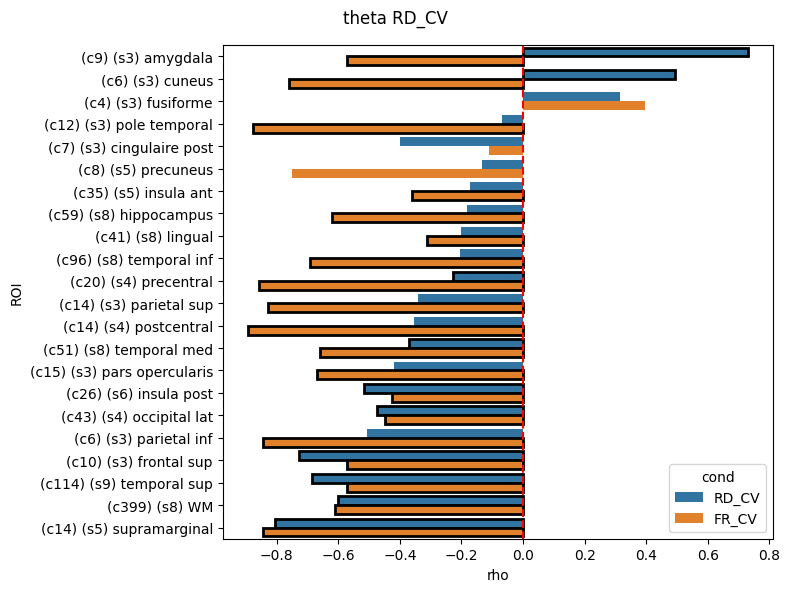

/tmp/ipykernel_167005/3992451347.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ROI_labels)


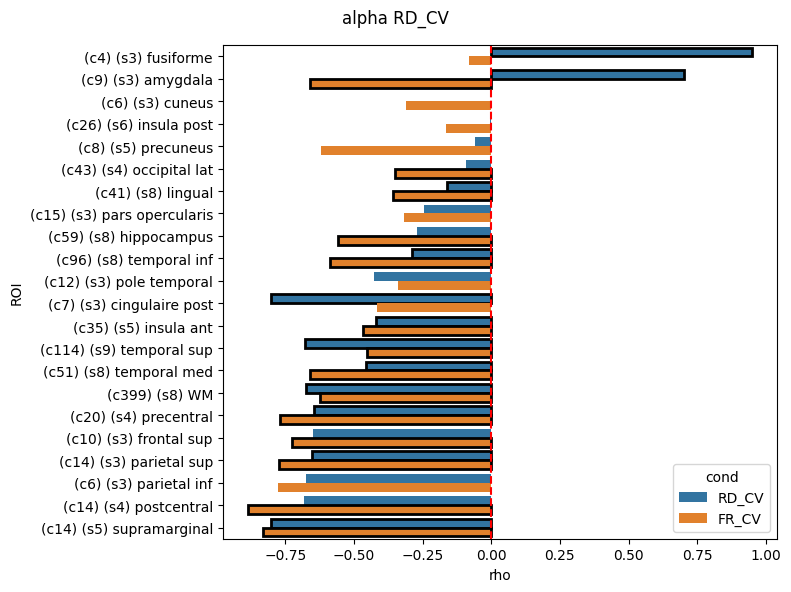

/tmp/ipykernel_167005/3992451347.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ROI_labels)


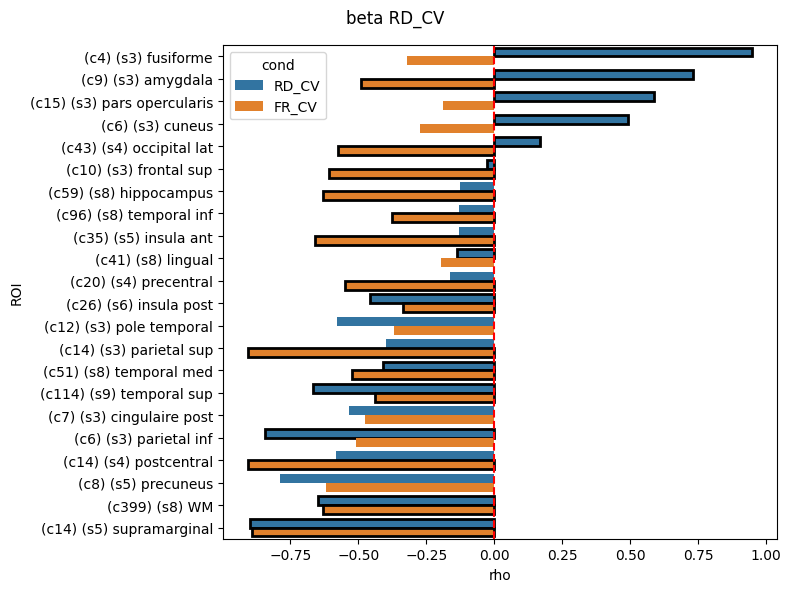

/tmp/ipykernel_167005/3992451347.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ROI_labels)


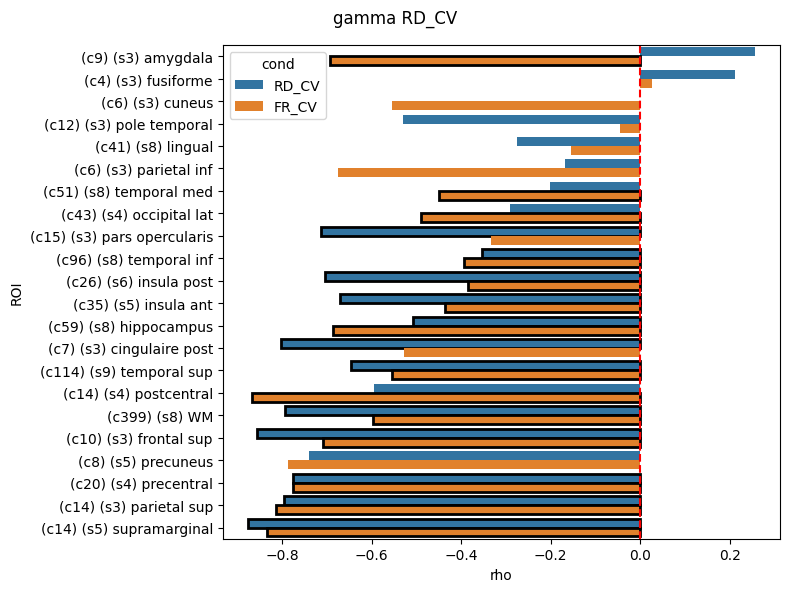

In [42]:
for band in band_list_global:

    # Sort the data
    df_plot = df_spearman_both_CV.query(f"band == '{band}'").sort_values('rho', ascending=False)

    # Build ROI labels
    ROI_labels = []
    for ROI in df_plot['ROI'].unique():
        _count_plot = df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
        _count_sujet = df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
        ROI_labels.append(f"(c{_count_plot}) (s{_count_sujet}) {ROI}")

    # Plot
    plt.figure(figsize=(8, 6))
    ax = sns.barplot(data=df_plot, x='rho', y='ROI', hue='cond', dodge=True)

    # Vertical line at 0
    ax.axvline(0, color='r', linestyle='--')

    # Set custom labels
    ax.set_yticklabels(ROI_labels)

    # Loop through bars and highlight significant ones
    for patch in ax.patches:
        rho = patch.get_width()

        # Match row in df_plot based on exact rho value
        match = df_plot[df_plot['rho'] == rho]

        if not match.empty and match.iloc[0]['signi']:
            patch.set_edgecolor('black')
            patch.set_linewidth(2)
        else:
            patch.set_edgecolor('none')

    plt.suptitle(f"{band} RD_CV")
    plt.tight_layout()
    plt.show()


## ALL CONDITIONS

### MI PROPORTION

In [47]:
data_df = {'band' : [], 'cond' : [], 'ROI' : [], 'MI_p' : []}

for band in band_list_global:

    for cond in conditions:

        for ROI in MI_ROI_list_ALLCOND_filt:
            
            signi = df_MI_ALLCOND.query(f"band == '{band}' and cond == '{cond}' and ROI == '{ROI}'")['MI_signi'].sum()
            prop_MI = signi/df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
            
            data_df['band'].append(band)
            data_df['cond'].append(cond)
            data_df['ROI'].append(ROI)
            data_df['MI_p'].append(prop_MI)

df_MI_p = pd.DataFrame(data_df) 
df_MI_p

,band,cond,ROI,MI_p
0,theta,FR_CV,temporal sup,0.087719
1,theta,FR_CV,amygdala,0.000000
2,theta,FR_CV,temporal med,0.039216
3,theta,FR_CV,hippocampus,0.016949
4,theta,FR_CV,temporal inf,0.010417
...,...,...,...,...
347,gamma,RD_SV,insula ant,0.085714
348,gamma,RD_SV,pars opercularis,0.066667
349,gamma,RD_SV,frontal sup,0.200000
350,gamma,RD_SV,parietal inf,0.333333


In [48]:
from scipy.stats import friedmanchisquare, wilcoxon
from statsmodels.stats.multitest import multipletests

for band in band_list_global:

    pivot_df = df_MI_p.query(f"band == '{band}' and cond != 'FR_CV'").pivot(index='ROI', columns='cond', values='MI_p')

    stat, pval = friedmanchisquare(*[pivot_df[col] for col in pivot_df.columns])
    print(f"{band} Friedman χ² = {stat:.3f}, p = {pval:.4f}")

    # If significant, run post-hoc pairwise Wilcoxon tests
    if pval < 0.05:
        conds = pivot_df.columns.tolist()
        results = []
        for i in range(len(conds)):
            for j in range(i+1, len(conds)):
                cond1, cond2 = conds[i], conds[j]
                stat_w, p_w = wilcoxon(pivot_df[cond1], pivot_df[cond2])
                results.append((cond1, cond2, p_w))

        # Adjust p-values for multiple comparisons
        raw_pvals = [r[2] for r in results]
        reject, pvals_corrected, _, _ = multipletests(raw_pvals, method='bonferroni')

        # Print results
        print(f"{band} Post-hoc Wilcoxon tests (Bonferroni-corrected):")
        for (cond1, cond2, raw_p), corr_p, sig in zip(results, pvals_corrected, reject):
            print(f"{cond1} vs {cond2}: raw p = {raw_p:.4f}, corrected p = {corr_p:.4f}, significant = {sig}")
    else:
        print(f"{band} Friedman test not significant. Skipping post-hoc tests.")

theta Friedman χ² = 14.364, p = 0.0008
theta Post-hoc Wilcoxon tests (Bonferroni-corrected):
RD_CV vs RD_FV: raw p = 0.0013, corrected p = 0.0039, significant = True
RD_CV vs RD_SV: raw p = 0.5566, corrected p = 1.0000, significant = False
RD_FV vs RD_SV: raw p = 0.0043, corrected p = 0.0130, significant = True
alpha Friedman χ² = 20.029, p = 0.0000
alpha Post-hoc Wilcoxon tests (Bonferroni-corrected):
RD_CV vs RD_FV: raw p = 0.0006, corrected p = 0.0019, significant = True
RD_CV vs RD_SV: raw p = 0.2396, corrected p = 0.7188, significant = False
RD_FV vs RD_SV: raw p = 0.0033, corrected p = 0.0100, significant = True
beta Friedman χ² = 1.564, p = 0.4575
beta Friedman test not significant. Skipping post-hoc tests.
gamma Friedman χ² = 25.725, p = 0.0000
gamma Post-hoc Wilcoxon tests (Bonferroni-corrected):
RD_CV vs RD_FV: raw p = 0.0034, corrected p = 0.0101, significant = True
RD_CV vs RD_SV: raw p = 0.0065, corrected p = 0.0195, significant = True
RD_FV vs RD_SV: raw p = 0.0003, corre

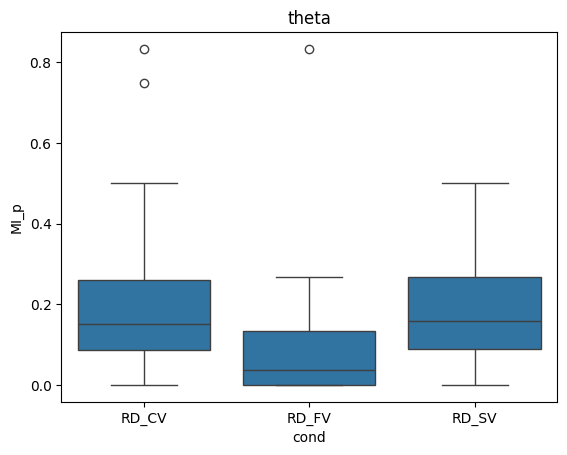

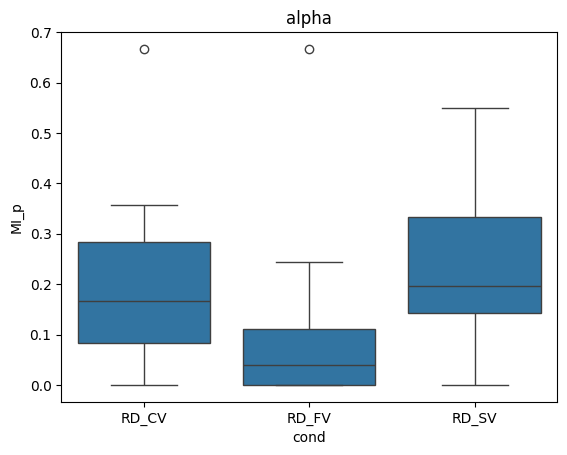

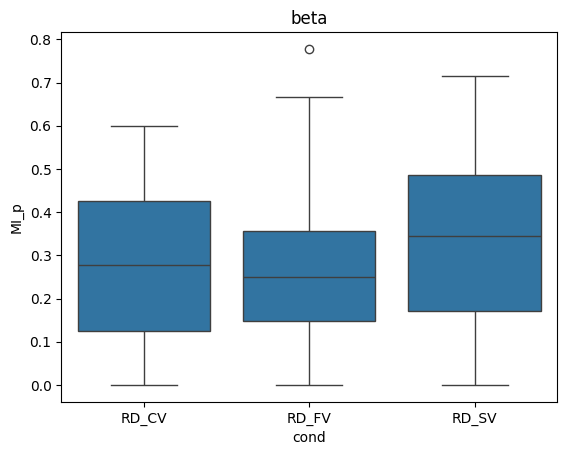

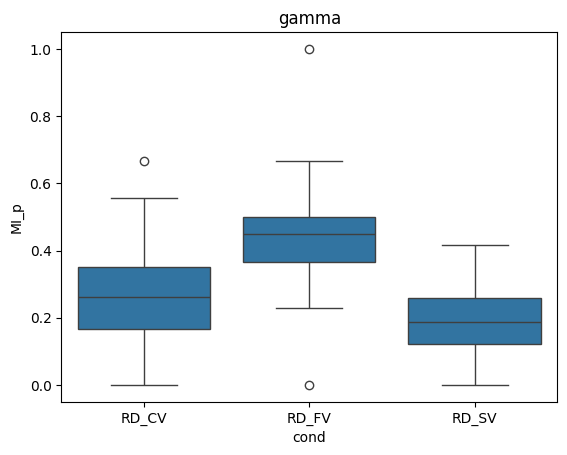

In [49]:
for band in band_list_global:

    sns.boxplot(data=df_MI_p.query(f"band == '{band}' and cond != 'FR_CV'"), x="cond", y="MI_p")
    plt.title(band)
    plt.show()

In [50]:
from statsmodels.stats.contingency_tables import cochrans_q

df_MI_ALLCOND_p_stats = pd.DataFrame()

for band in band_list_global:

    for ROI in MI_ROI_list_ALLCOND_filt:

        _df = df_MI_ALLCOND.query(f"band == '{band}' and cond != 'FR_CV' and ROI == '{ROI}'")
        _df['signi']  = _df['MI_signi']
        _df = _df.pivot_table(index=['sujet', 'chan'], columns='cond', values='signi').reset_index()
        _data = _df[['RD_CV', 'RD_SV', 'RD_FV']].values.astype(int)

        result = cochrans_q(_data)

        q_stat = result.statistic
        p_value = result.pvalue

        def pairwise_permutation_test(df, n_perm=500):

            results = []
            conds = df.columns.tolist()

            for i in range(len(conds)):
                for j in range(i + 1, len(conds)):
                    cond1 = conds[i]
                    cond2 = conds[j]

                    # Observed absolute difference in proportions
                    d_obs = _df[cond1].sum() / len(_df) - _df[cond2].sum() / len(_df)

                    # Build null distribution via permutations
                    null_dist = np.zeros(n_perm)

                    for k in range(n_perm):
                        flip = np.random.binomial(1, 0.5, size=len(df))
                        c1_perm = np.where(flip, df[cond2], df[cond1])
                        c2_perm = np.where(flip, df[cond1], df[cond2])
                        null_dist[k] = c1_perm.sum() / len(_df) - c2_perm.sum() / len(_df)

                    # Compute p-value
                    threshdw, thresh_up = np.percentile(null_dist, [2.5, 97.5])
                    if d_obs < threshdw or d_obs > thresh_up:
                        p_val = True
                    else:
                        p_val = False

                    results.append({
                        'condition_1': cond1,
                        'condition_2': cond2,
                        'p_value': p_val
                    })

            return pd.DataFrame(results)

        _res = pairwise_permutation_test(_df[['RD_CV', 'RD_SV', 'RD_FV']], n_perm=500)

        _df_ROI = pd.DataFrame({'band' : [band] * _res.shape[0], 'ROI' : [ROI] * _res.shape[0], 'pval' : [p_value] * _res.shape[0]})
        _df_ROI = pd.concat([_df_ROI, _res], axis=1)
        df_MI_ALLCOND_p_stats = pd.concat([df_MI_ALLCOND_p_stats, _df_ROI], axis=0)

/tmp/ipykernel_167005/2039851642.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  _df['signi']  = _df['MI_signi']
/tmp/ipykernel_167005/2039851642.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  _df['signi']  = _df['MI_signi']
/tmp/ipykernel_167005/2039851642.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user

In [51]:
df_MI_p_diff = pd.DataFrame()

for band in band_list_global:

    _df_MI_p_diff = pd.DataFrame({'ROI' : df_MI_p.query(f"band == '{band}'").pivot(index='ROI', columns='cond', values='MI_p').index.values})
    _df_MI_p_diff['RD_SV'] = (df_MI_p.query(f"band == '{band}'").pivot(index='ROI', columns='cond', values='MI_p')['RD_SV'] - df_MI_p.query(f"band == '{band}'").pivot(index='ROI', columns='cond', values='MI_p')['RD_CV']).values
    _df_MI_p_diff['RD_FV'] = (df_MI_p.query(f"band == '{band}'").pivot(index='ROI', columns='cond', values='MI_p')['RD_FV'] - df_MI_p.query(f"band == '{band}'").pivot(index='ROI', columns='cond', values='MI_p')['RD_CV']).values
    _df_MI_p_diff = _df_MI_p_diff.melt(id_vars='ROI', value_vars=['RD_SV', 'RD_FV'],var_name='cond', value_name='MI_diff')
    _df_MI_p_diff

    signi_diff = []

    for row_i, row_val in _df_MI_p_diff.iterrows():

        try:
            pre_hoc = df_MI_ALLCOND_p_stats.query(f"band == '{band}' and ROI == '{row_val['ROI']}' and condition_1 == '{row_val['cond']}' and condition_2 == 'RD_CV'")['pval'].values[0]
        except:
            pre_hoc = df_MI_ALLCOND_p_stats.query(f"band == '{band}' and ROI == '{row_val['ROI']}' and condition_1 == 'RD_CV' and condition_2 == '{row_val['cond']}'")['pval'].values[0]
        
        try:       
            post_hoc = df_MI_ALLCOND_p_stats.query(f"band == '{band}' and ROI == '{row_val['ROI']}' and condition_1 == '{row_val['cond']}' and condition_2 == 'RD_CV'")['p_value'].values[0]
        except:
            post_hoc = df_MI_ALLCOND_p_stats.query(f"band == '{band}' and ROI == '{row_val['ROI']}' and condition_1 == 'RD_CV' and condition_2 == '{row_val['cond']}'")['p_value'].values[0]

        if pre_hoc and post_hoc:

            signi_diff.append(True)

        else:
            
            signi_diff.append(False)

    _df_MI_p_diff['signi'] = signi_diff
    _df_MI_p_diff['band'] = [band] * _df_MI_p_diff.shape[0]

    df_MI_p_diff = pd.concat([df_MI_p_diff, _df_MI_p_diff], axis=0)

df_MI_p_diff

,ROI,cond,MI_diff,signi,band
0,WM,RD_SV,0.047619,False,theta
1,amygdala,RD_SV,-0.222222,False,theta
2,cingulaire post,RD_SV,-0.142857,False,theta
3,cuneus,RD_SV,-0.333333,False,theta
4,frontal sup,RD_SV,-0.100000,False,theta
...,...,...,...,...,...
39,precuneus,RD_FV,0.125000,False,gamma
40,supramarginal,RD_FV,0.357143,False,gamma
41,temporal inf,RD_FV,0.072917,False,gamma
42,temporal med,RD_FV,0.058824,False,gamma


In [52]:
df_MI_p_diff.query("signi == True and band == 'theta'")

,ROI,cond,MI_diff,signi,band
16,precentral,RD_SV,-0.350000,True,theta
22,WM,RD_FV,-0.115288,True,theta


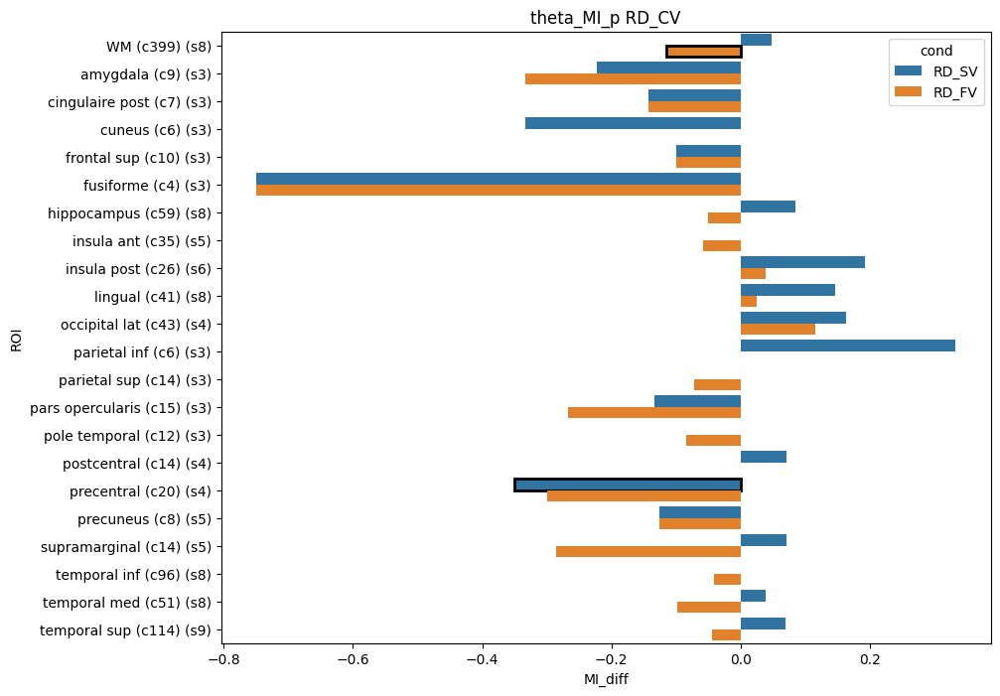

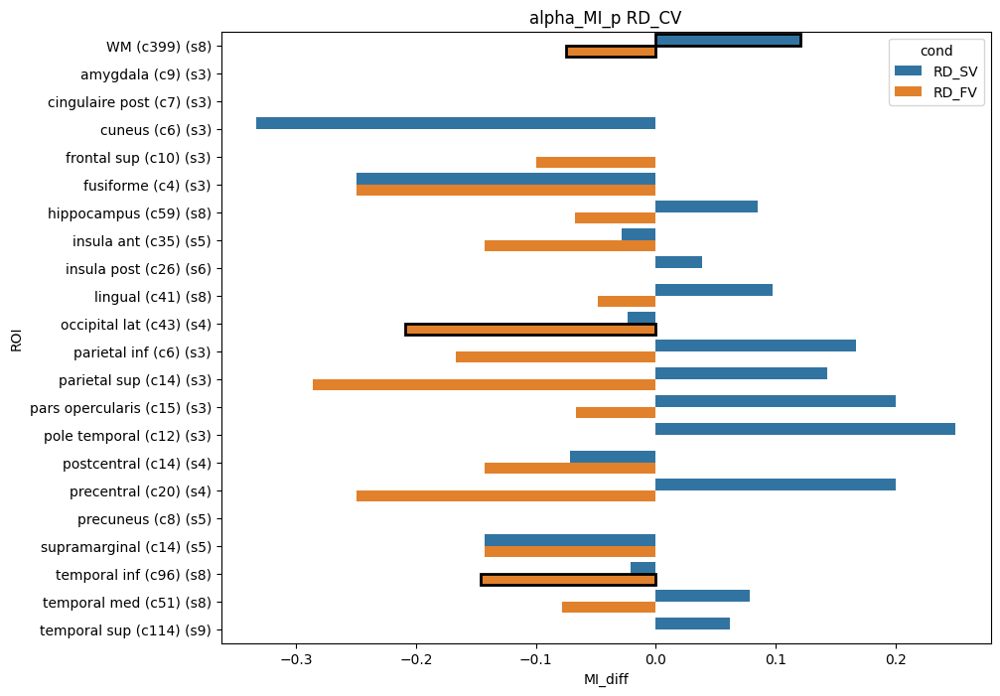

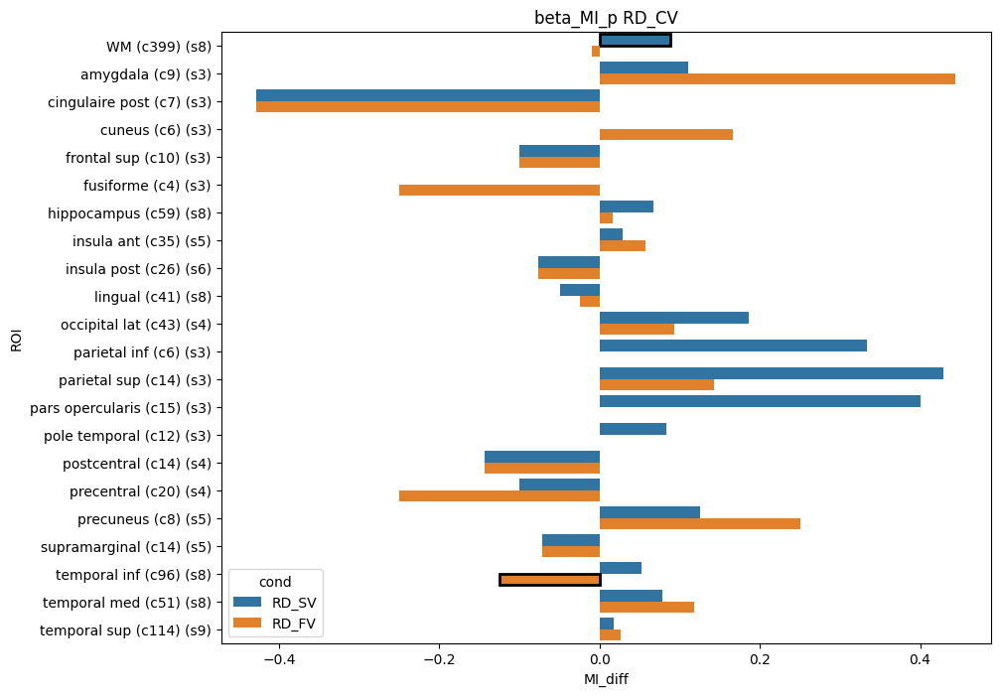

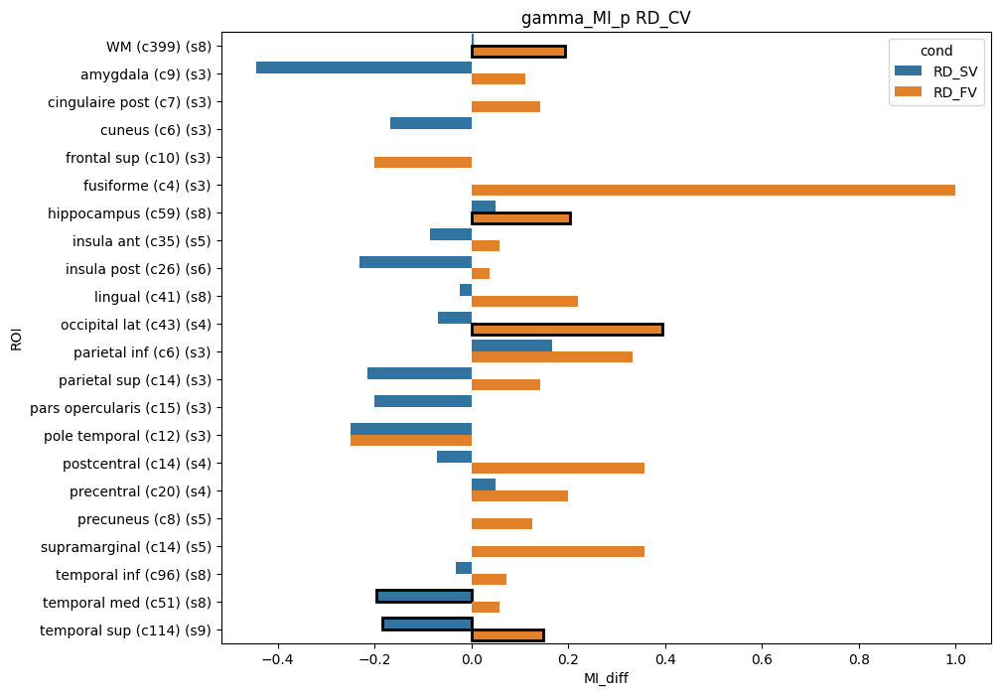

In [53]:
for band in band_list_global:
    
    df_plot = df_MI_p_diff.query(f"band == '{band}'")

    fig, ax = plt.subplots(figsize = (10,8))
    g = sns.barplot(data=df_plot , x='MI_diff', y='ROI', hue='cond', ax=ax)

    ROI_labels = []

    for ROI_i, ROI in enumerate(df_plot['ROI'].unique()):

        _count_plot = df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
        _count_sujet = df_ROI_count_allcond.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
        ROI_labels.append(f'{ROI} (c{_count_plot}) (s{_count_sujet})')

    for patch, (_, row) in zip(ax.patches, df_plot.iterrows()):
        if row['signi'] == True:
            patch.set_edgecolor('black')
            patch.set_linewidth(2)
        else:
            patch.set_edgecolor('none')  # no border for non-significant bars

    g.set_yticks(range(len(ROI_labels)))
    g.set_yticklabels(ROI_labels)
    ax.tick_params(axis='y')
    # ax.set_xlim(-0.3,0.3)

    ax.set_title(f'{band}_MI_p RD_CV')
    plt.show()

### MI LMM

In [54]:
os.chdir(os.path.join(path_results, 'allplot', 'LMM', 'Pxx', 'df_lmm'))
df_lmm_allcond = pd.DataFrame()

for ROI in Pxx_ROI_list_ALLCOND_filt:

    for band in band_list_global:

        _df = pd.read_excel(f'ALLCOND_MI_lmm_{ROI}_{band}_res.xlsx')
        _df['ROI'] = [ROI] * _df.shape[0]
        _df['band'] = [band] * _df.shape[0]
        df_lmm_allcond = pd.concat([df_lmm_allcond, _df])

In [55]:
data = {'ROI' : [], 'band' : [], 'coeff' : [], 'pval' : [], 'p' : []}

for ROI in Pxx_ROI_list_ALLCOND_filt:

    for band in band_list_global:

        coeff = df_lmm_allcond.query(f"ROI == '{ROI}' and band == '{band}' and term == 'resp'")['estimate'].values[0]
        pval = df_lmm_allcond.query(f"ROI == '{ROI}' and band == '{band}' and term == 'resp'")['p.value'].values[0]

        if pval < 0.05:

            p = 1

        else:

            p = 0

        data['ROI'].append(ROI)
        data['band'].append(band)
        data['coeff'].append(coeff)
        data['pval'].append(pval)
        data['p'].append(p)

df_lmm_allcond_summary = pd.DataFrame(data)

In [56]:
df_lmm_allcond_summary.query("p == 1 and band == 'theta'")

,ROI,band,coeff,pval,p
0,temporal sup,theta,-0.576269,2.738970e-63,1
4,amygdala,theta,-0.663145,2.048893e-06,1
8,temporal med,theta,-0.551709,2.990802e-26,1
12,hippocampus,theta,-0.553829,2.986476e-35,1
16,temporal inf,theta,-0.513257,1.160703e-40,1
20,pole temporal,theta,-0.627659,1.085936e-07,1
24,insula post,theta,-0.542316,9.440642e-15,1
28,lingual,theta,-0.381783,2.999838e-04,1
32,WM,theta,-0.731261,1.183215e-129,1
36,cingulaire post,theta,-0.372198,3.348148e-02,1


/tmp/ipykernel_167005/2484587171.py:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ROI_labels)


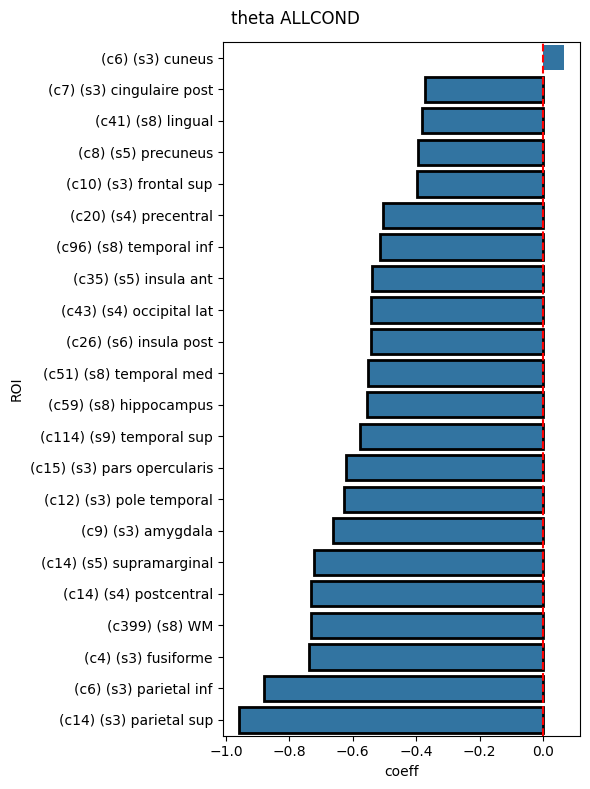

/tmp/ipykernel_167005/2484587171.py:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ROI_labels)


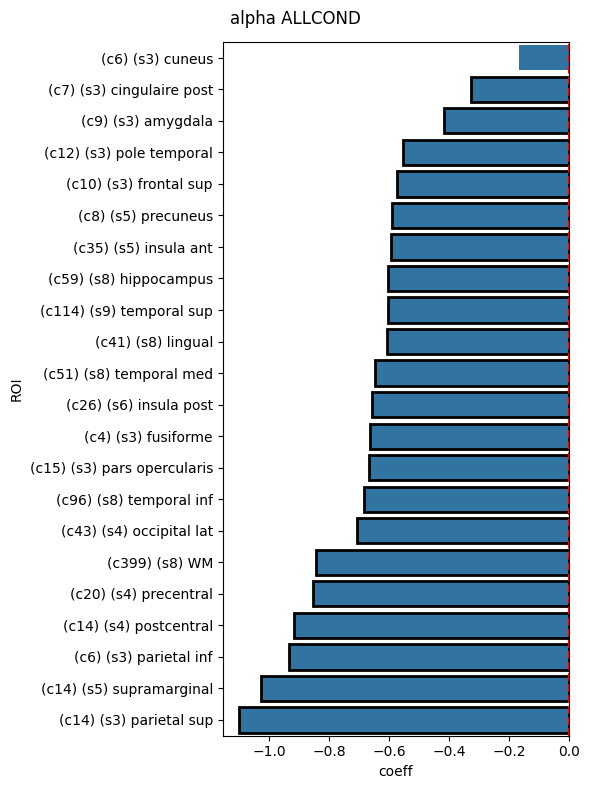

/tmp/ipykernel_167005/2484587171.py:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ROI_labels)


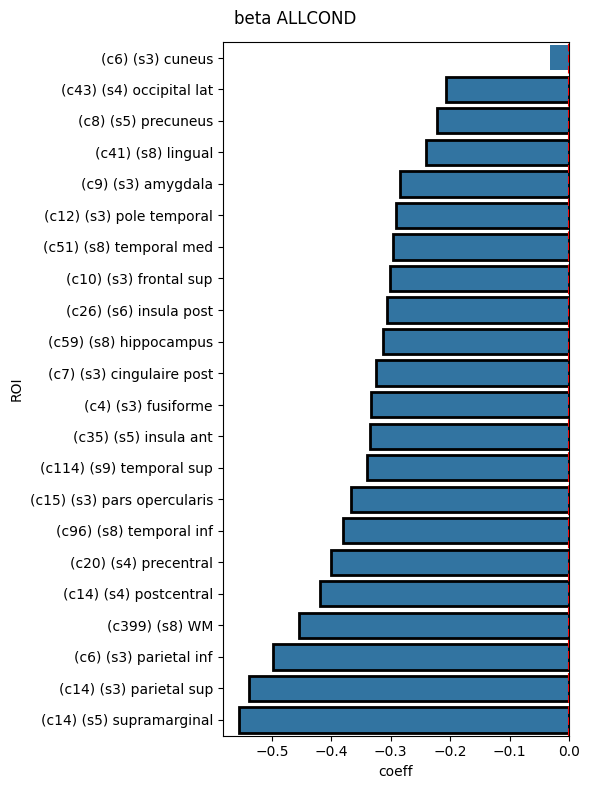

/tmp/ipykernel_167005/2484587171.py:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ROI_labels)


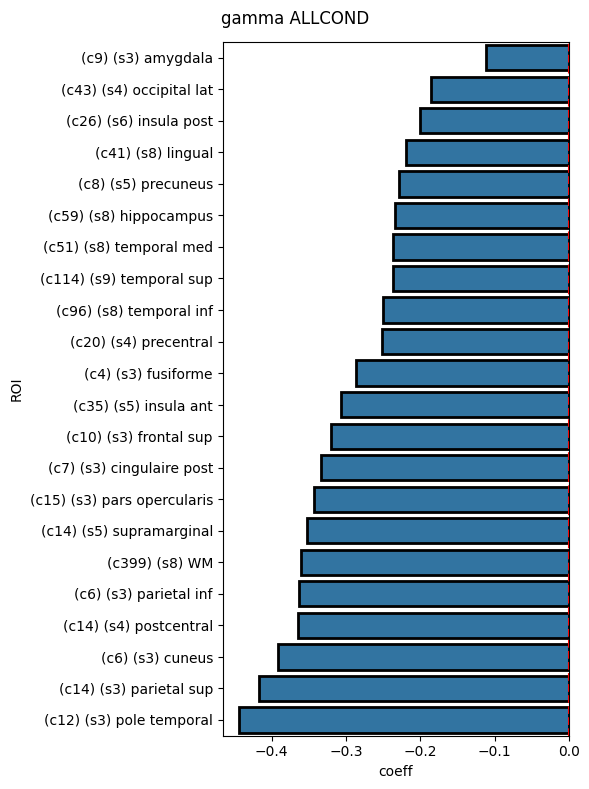

In [57]:
for band in band_list_global:

    df_plot = df_lmm_allcond_summary.query(f"band == '{band}'").sort_values('coeff', ascending=False)

    ROI_labels = []
    for ROI in df_plot['ROI'].unique():
        _count_plot = df_ROI_count_ALLCOND_Pxx.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
        _count_sujet = df_ROI_count_ALLCOND_Pxx.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
        ROI_labels.append(f"(c{_count_plot}) (s{_count_sujet}) {ROI}")

    plt.figure(figsize=(6, 8))
    ax = sns.barplot(data=df_plot, x='coeff', y='ROI')

    # Horizontal line at 0
    ax.axvline(0, color='r', linestyle='--')

    # Set custom x-tick labels
    ax.set_yticklabels(ROI_labels)

    # Add black border to bars where p == 1
    for patch, (_, row) in zip(ax.patches, df_plot.iterrows()):
        if row['p'] == 1:
            patch.set_edgecolor('black')
            patch.set_linewidth(2)
        else:
            patch.set_edgecolor('none')  # no border for non-significant bars

    plt.suptitle(f"{band} ALLCOND")
    plt.tight_layout()
    plt.show()

/home/jules.granget/myenvs/py311/lib/python3.11/site-packages/seaborn/axisgrid.py:453: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=figsize)


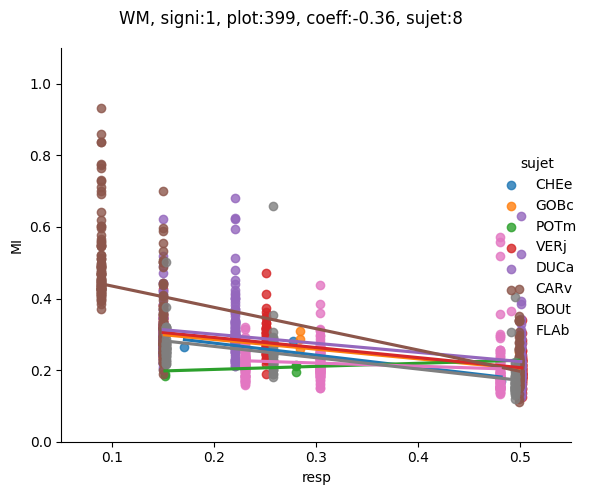

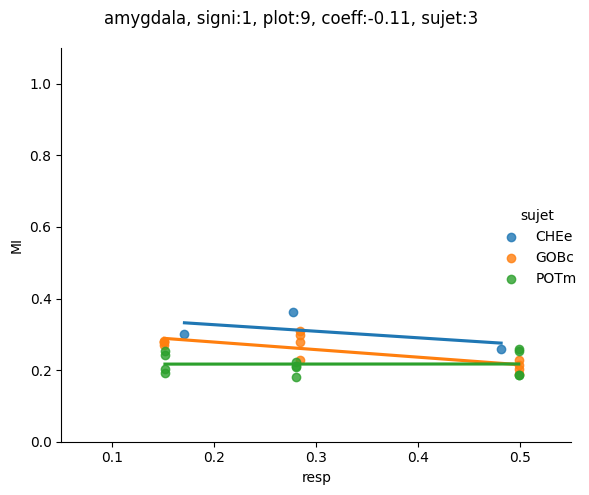

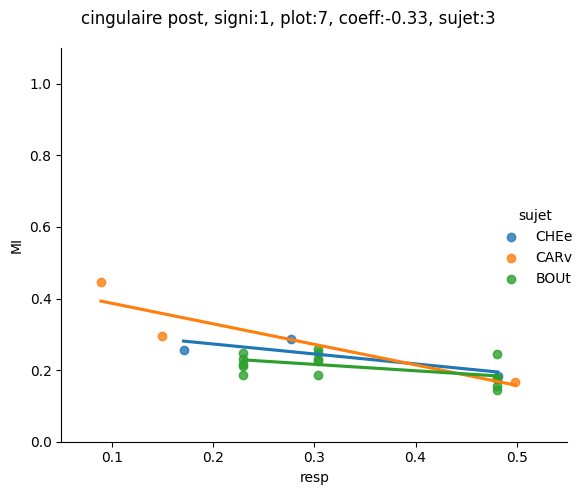

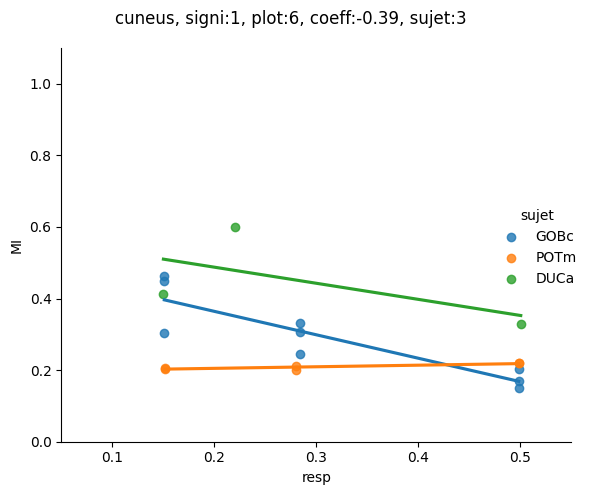

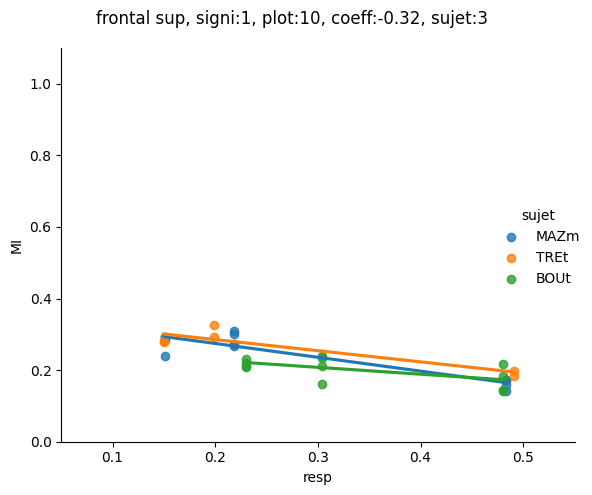

...

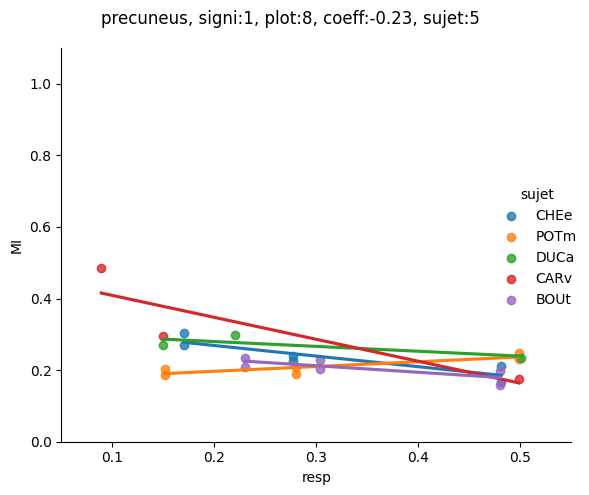

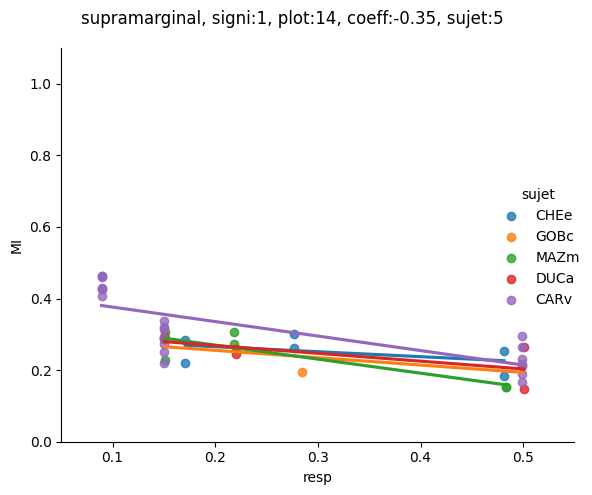

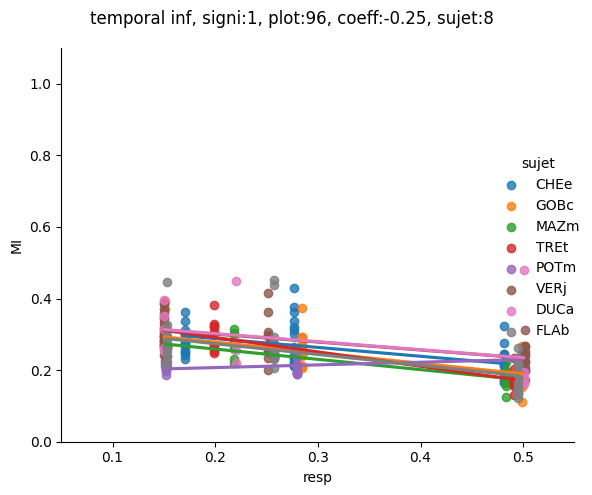

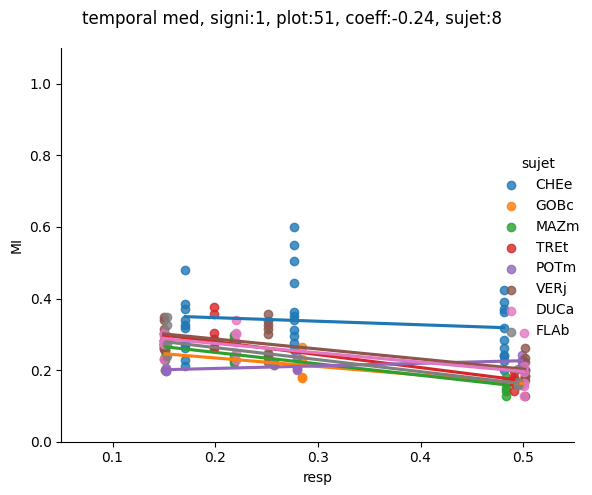

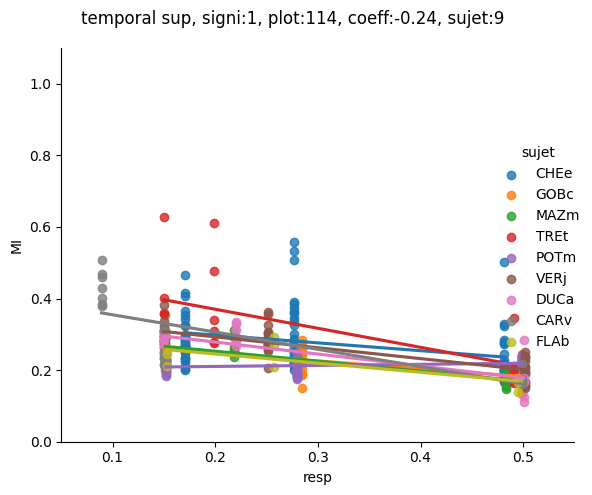

In [58]:
d = 'theta'

for ROI in df_ROI_count_ALLCOND_Pxx['ROI']:

    if df_lmm_allcond_summary.query(f"ROI == '{ROI}' and band == '{band}'")['p'].values == False:
        continue
    
    pval = df_lmm_allcond_summary.query(f"ROI == '{ROI}' and band == '{band}'")['p'].values[0]
    sns.lmplot(x="resp", y="MI", hue='sujet', data=df_MI_ALLCOND.query(f"ROI == '{ROI}' and band == '{band}' and cond in ['RD_CV', 'RD_SV', 'RD_FV']"),  ci=None)
    _coeff = df_lmm_allcond_summary.query(f"ROI == '{ROI}' and band == '{band}'")['coeff'].values[0]
    plt.ylim(0,1.1)
    plt.xlim(0.05,0.55)
    _count_plot = df_ROI_count_ALLCOND_Pxx.query(f"ROI == '{ROI}'")['count_plot'].iloc[0]
    _count_sujet = df_ROI_count_ALLCOND_Pxx.query(f"ROI == '{ROI}'")['count_sujet'].iloc[0]
    plt.suptitle(f"{ROI}, signi:{pval}, plot:{_count_plot}, coeff:{np.round(_coeff, 2)}, sujet:{_count_sujet}")
    plt.tight_layout()

# DFC

## FR_CV

### ANATOMY

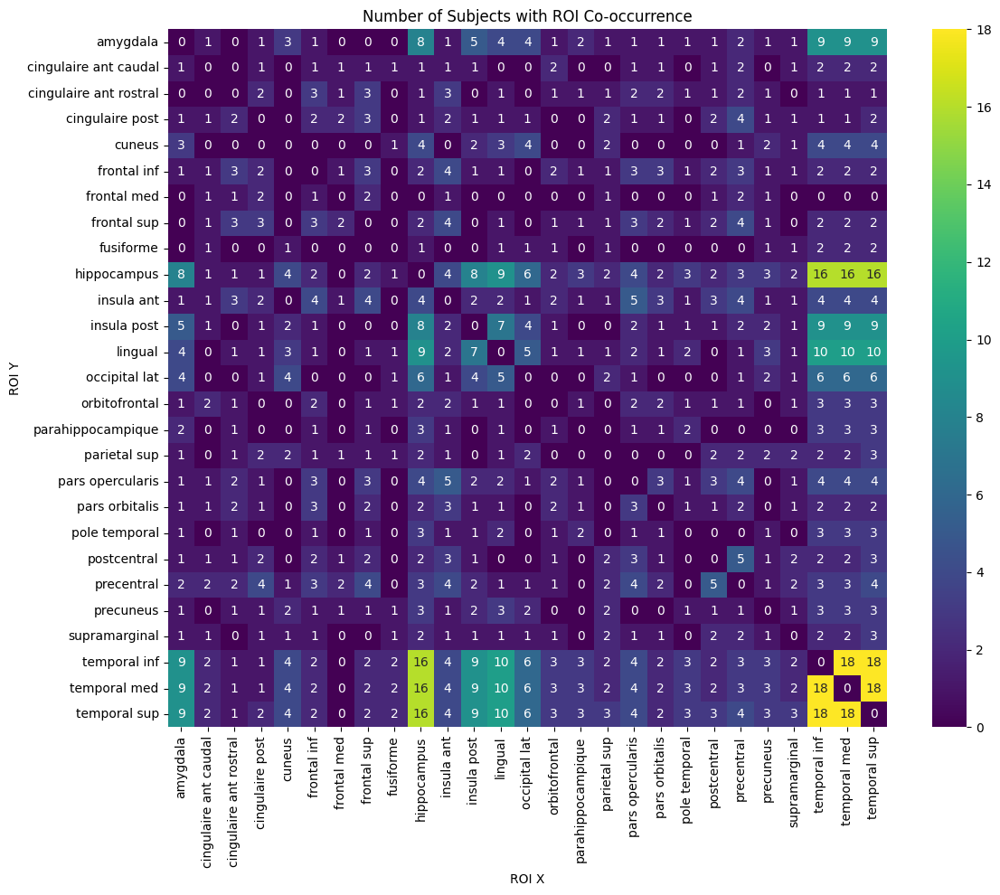

In [ ]:
sujet_roi_map = df_Cxy_FR_CV.query(f"ROI != 'WM'").groupby('sujet')['ROI'].unique()

# Get the full unique ROI list
all_rois = np.unique(df_Cxy_FR_CV.query(f"ROI != 'WM'")['ROI'])

# Create an empty DataFrame to store counts
roi_matrix = pd.DataFrame(0, index=all_rois, columns=all_rois)

# Count co-occurrence
for rois in sujet_roi_map:
    for roi1 in rois:
        for roi2 in rois:
            if roi1 == roi2:
                continue
            roi_matrix.loc[roi1, roi2] += 1

plt.figure(figsize=(12, 10))
sns.heatmap(roi_matrix, annot=True, fmt="d", cmap="viridis")
plt.title("Number of Subjects with ROI Co-occurrence")
plt.ylabel("ROI Y")
plt.xlabel("ROI X")
plt.tight_layout()
plt.show()

### LMM WHOLE PHASE

In [ ]:
pairs_to_compute = []

for pair_A_i, pair_A in enumerate(ROI_list_dfc):
    
    for pair_B_i, pair_B in enumerate(ROI_list_dfc):

        if pair_A == pair_B or f'{pair_A}-{pair_B}' in pairs_to_compute or f'{pair_B}-{pair_A}' in pairs_to_compute:
            continue

        pairs_to_compute.append(f'{pair_A}-{pair_B}')


pair_list = ['-'.join(sorted(pair.split('-'))) for pair in pairs_to_compute]

In [ ]:
os.chdir(os.path.join(path_results, 'allplot', 'LMM', 'FC', 'df_lmm'))
df_lmm_FR_CV = pd.DataFrame()

for pair in pair_list:

    for band in freq_band_dict_FC_lmm['wb']:

        _df = pd.read_excel(f'lmm_{pair}_{band}_res_FC_FR_CV.xlsx')
        _df['pair'] = [pair] * _df.shape[0]
        _df['band'] = [band] * _df.shape[0]
        df_lmm_FR_CV = pd.concat([df_lmm_FR_CV, _df])

In [ ]:
data = {'pair' : [], 'band' : [], 'estimate' : [], 'pval' : [], 'p' : []}

for pair in pair_list:

    for band in freq_band_dict_FC_lmm['wb']:

        df = df_lmm_FR_CV.query(f"pair == '{pair}' and band == '{band}'")
        _estimate = df.query(f"term == 'resp'")['estimate'].iloc[0]
        pval = df.query(f"term == 'resp'")['p.value'].iloc[0]
        if pval < 0.05:
            p = 1
        else:
            p = 0

        data['pair'].append(pair)
        data['band'].append(band)
        data['estimate'].append(_estimate)
        data['pval'].append(pval)
        data['p'].append(p)

df_phase_FR_CV_pval = pd.DataFrame(data)
df_phase_FR_CV_pval

,pair,band,estimate,pval,p
0,amygdala-hippocampus,theta,0.002357,0.983214,0
1,amygdala-hippocampus,alpha,-0.050814,0.643639,0
2,amygdala-hippocampus,beta,-0.054136,0.639422,0
3,amygdala-hippocampus,gamma,0.003138,0.965391,0
4,amygdala-insula post,theta,-0.030206,0.920034,0
5,amygdala-insula post,alpha,-0.216276,0.457986,0
6,amygdala-insula post,beta,-0.167084,0.557324,0
7,amygdala-insula post,gamma,0.029307,0.879552,0
8,hippocampus-insula post,theta,0.035786,0.784203,0
9,hippocampus-insula post,alpha,-0.068855,0.563944,0


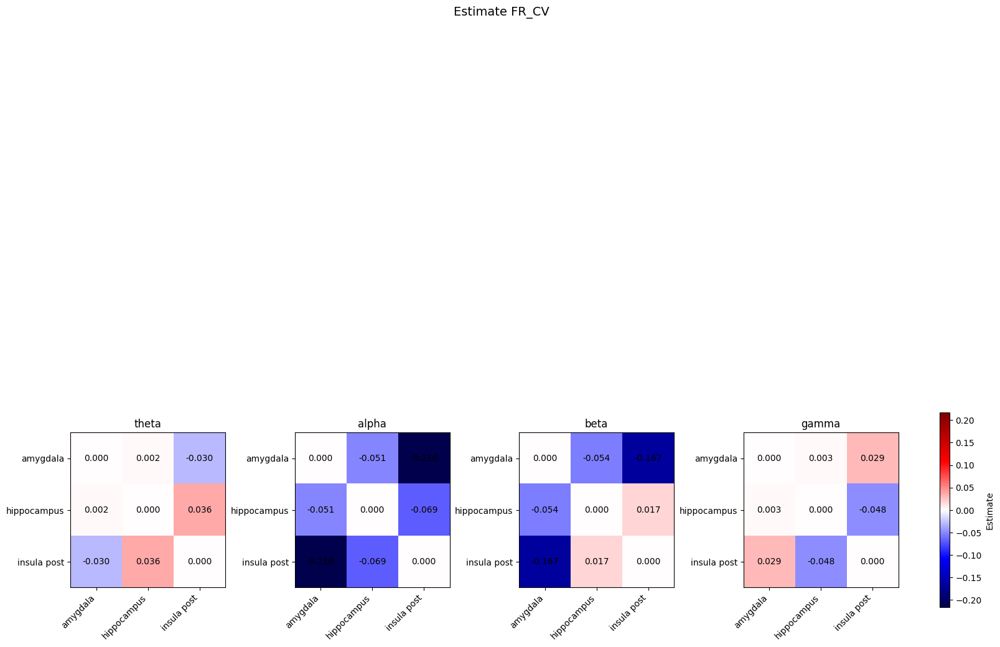

In [ ]:
bands = freq_band_dict_FC_lmm['wb']

vlim = np.abs([df_phase_FR_CV_pval['estimate'].min(), df_phase_FR_CV_pval['estimate'].max()]).max()
fig, axs = plt.subplots(ncols=len(bands), figsize=(16, 16), constrained_layout=True)

# Loop through each band to plot
for col_i, band in enumerate(bands):

    ax = axs[col_i]
    _estimate = np.zeros((len(ROI_list_dfc), len(ROI_list_dfc)))
    mask_p = np.zeros((len(ROI_list_dfc), len(ROI_list_dfc)), dtype=bool)

    # Fill matrix with estimates
    for _, row in df_phase_FR_CV_pval.query(f"band == '{band}'").iterrows():
        r1, r2 = row['pair'].split('-')
        i1 = ROI_list_dfc.index(r1)
        i2 = ROI_list_dfc.index(r2)
        _estimate[i1, i2] = row['estimate']
        _estimate[i2, i1] = row['estimate']
        mask_p[i1, i2] = row['p'] == 1
        mask_p[i2, i1] = row['p'] == 1

    im = ax.imshow(_estimate, cmap='seismic', vmin=-vlim, vmax=vlim)

    # Add text + green highlight if significant
    for x in range(3):
        for y in range(3):
            val = _estimate[x, y]
            if not np.isnan(val):
                ax.text(y, x, f"{val:.3f}", va='center', ha='center', color='black')
                if mask_p[x, y]:
                    rect = plt.Rectangle((y - 0.5, x - 0.5), 1, 1, edgecolor='green', linewidth=3, facecolor='none')
                    ax.add_patch(rect)

    ax.set_xticks(range(3))
    ax.set_xticklabels(ROI_list_dfc, rotation=45, ha='right')
    ax.set_yticks(range(3))
    ax.set_yticklabels(ROI_list_dfc)
    ax.set_title(f"{band}")

# Colorbar (shared)
cbar = fig.colorbar(im, ax=axs.ravel().tolist(), shrink=0.2, orientation='vertical')
cbar.set_label('Estimate')

plt.suptitle("Estimate FR_CV", fontsize=14)
plt.show()


### LMM PHASE

In [ ]:
pairs_to_compute = []

for pair_A_i, pair_A in enumerate(ROI_list_dfc):
    
    for pair_B_i, pair_B in enumerate(ROI_list_dfc):

        if pair_A == pair_B or f'{pair_A}-{pair_B}' in pairs_to_compute or f'{pair_B}-{pair_A}' in pairs_to_compute:
            continue

        pairs_to_compute.append(f'{pair_A}-{pair_B}')


pair_list = ['-'.join(sorted(pair.split('-'))) for pair in pairs_to_compute]

In [ ]:
os.chdir(os.path.join(path_results, 'allplot', 'LMM', 'FC', 'df_lmm'))
df_lmm_FR_CV = pd.DataFrame()

for pair in pair_list:

    for band in freq_band_dict_FC_lmm['wb']:

        _df = pd.read_excel(f'lmm_{pair}_{band}_res_FC_FR_CV.xlsx')
        _df['pair'] = [pair] * _df.shape[0]
        _df['band'] = [band] * _df.shape[0]
        df_lmm_FR_CV = pd.concat([df_lmm_FR_CV, _df])

In [ ]:
data = {'pair' : [], 'band' : [], 'phase' : [], 'estimate' : [], 'pval' : [], 'p' : []}

for pair in pair_list:

    for band in freq_band_dict_FC_lmm['wb']:

        for phase in ['I', 'IE', 'E', 'EI']:

            if phase == 'I':
                    
                _term = '(Intercept)'

            else:

                _term = f"phase{phase}"

            df = df_lmm_FR_CV.query(f"pair == '{pair}' and band == '{band}'")
            _estimate = df.query(f"term == '{_term}'")['estimate'].iloc[0]
            pval = df.query(f"term == '{_term}'")['p.value'].iloc[0]
            if pval < 0.05:
                p = 1
            else:
                p = 0

            data['pair'].append(pair)
            data['band'].append(band)
            data['phase'].append(phase)
            data['estimate'].append(_estimate)
            data['pval'].append(pval)
            data['p'].append(p)

df_phase_FR_CV_pval = pd.DataFrame(data)
df_phase_FR_CV_pval

,pair,band,phase,estimate,pval,p
0,amygdala-hippocampus,theta,I,0.004841,0.747676,0
1,amygdala-hippocampus,theta,IE,-0.000717,0.973100,0
2,amygdala-hippocampus,theta,E,-0.004246,0.841831,0
3,amygdala-hippocampus,theta,EI,-0.005310,0.802958,0
4,amygdala-hippocampus,alpha,I,0.001701,0.907394,0
5,amygdala-hippocampus,alpha,IE,0.000242,0.990676,0
6,amygdala-hippocampus,alpha,E,0.015938,0.441253,0
7,amygdala-hippocampus,alpha,EI,-0.028361,0.171134,0
8,amygdala-hippocampus,beta,I,-0.004165,0.784513,0
9,amygdala-hippocampus,beta,IE,0.033683,0.118768,0


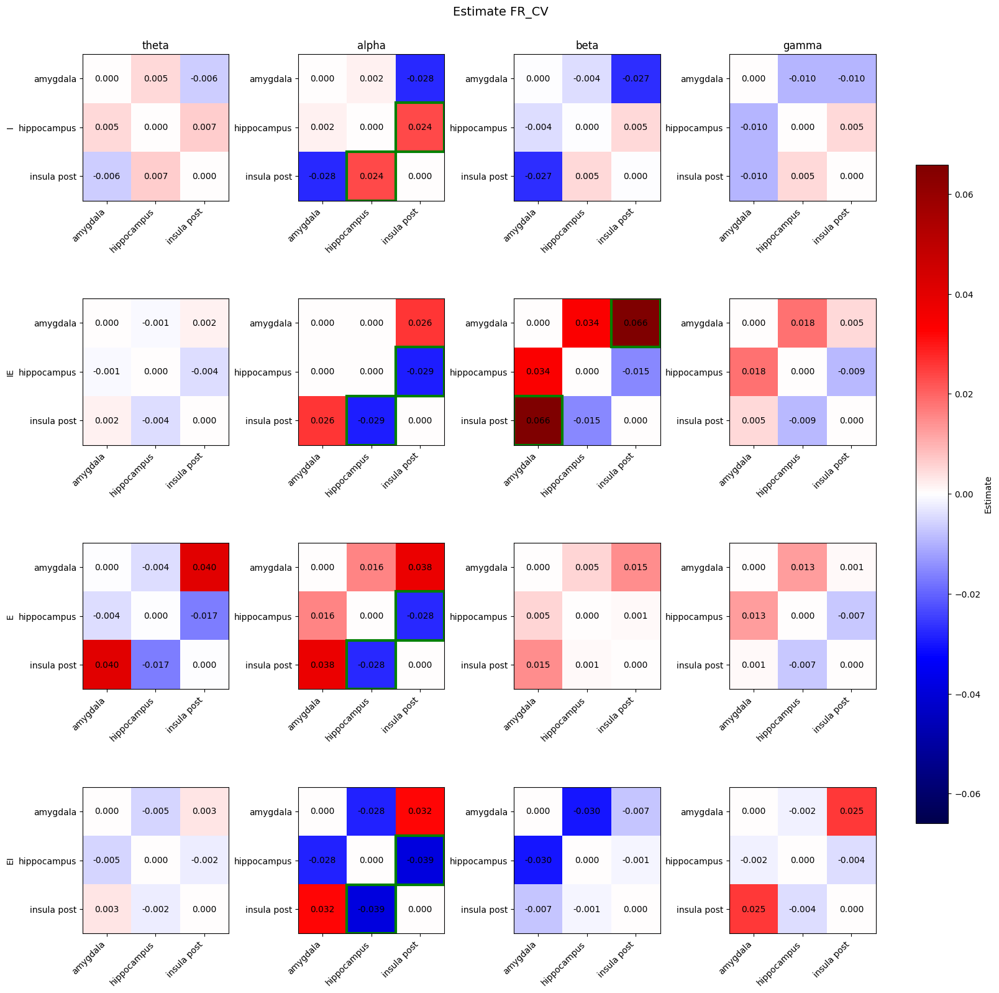

In [ ]:
bands = freq_band_dict_FC_lmm['wb']

vlim = np.abs([df_phase_FR_CV_pval['estimate'].min(), df_phase_FR_CV_pval['estimate'].max()]).max()
fig, axs = plt.subplots(4, len(bands), figsize=(16, 16), constrained_layout=True)

# Loop through each band to plot
for col_i, band in enumerate(bands):

    for row_i, phase in enumerate(['I', 'IE', 'E', 'EI']):

        ax = axs[row_i, col_i]
        _estimate = np.zeros((len(ROI_list_dfc), len(ROI_list_dfc)))
        mask_p = np.zeros((len(ROI_list_dfc), len(ROI_list_dfc)), dtype=bool)

        # Fill matrix with estimates
        for _, row in df_phase_FR_CV_pval.query(f"band == '{band}' and phase == '{phase}'").iterrows():
            r1, r2 = row['pair'].split('-')
            i1 = ROI_list_dfc.index(r1)
            i2 = ROI_list_dfc.index(r2)
            _estimate[i1, i2] = row['estimate']
            _estimate[i2, i1] = row['estimate']
            mask_p[i1, i2] = row['p'] == 1
            mask_p[i2, i1] = row['p'] == 1

        im = ax.imshow(_estimate, cmap='seismic', vmin=-vlim, vmax=vlim)

        # Add text + green highlight if significant
        for x in range(3):
            for y in range(3):
                val = _estimate[x, y]
                if not np.isnan(val):
                    ax.text(y, x, f"{val:.3f}", va='center', ha='center', color='black')
                    if mask_p[x, y]:
                        rect = plt.Rectangle((y - 0.5, x - 0.5), 1, 1, edgecolor='green', linewidth=3, facecolor='none')
                        ax.add_patch(rect)

        ax.set_xticks(range(3))
        ax.set_xticklabels(ROI_list_dfc, rotation=45, ha='right')
        ax.set_yticks(range(3))
        ax.set_yticklabels(ROI_list_dfc)
        if row_i == 0:
            ax.set_title(f"{band}")
        if col_i == 0:
            ax.set_ylabel(phase)

# Colorbar (shared)
cbar = fig.colorbar(im, ax=axs.ravel().tolist(), shrink=0.7, orientation='vertical')
cbar.set_label('Estimate')

plt.suptitle("Estimate FR_CV", fontsize=14)
plt.show()


### CLUSTER BASED

In [ ]:
phase_list = df_fc_FR_CV['phase'].unique()
band_list = df_fc_FR_CV['band'].unique()
pair_list = df_fc_FR_CV['pair'].unique()
sujet_list_fc = df_fc_FR_CV['sujet'].unique()
print(phase_list)
print(band_list)
print(pair_list)
print(sujet_list_fc)

['EI' 'I' 'IE' 'E']
['theta' 'alpha' 'beta' 'gamma']
['amygdala-hippocampus' 'amygdala-insula post' 'hippocampus-insula post']
['BANc' 'CHEe' 'GOBc' 'LEMl' 'MUGa' 'POTm' 'pat_03083_1527'
 'pat_03105_1551' 'pat_03174_1634']


In [ ]:
df_fc_stats_FR_CV = pd.DataFrame()

for band in band_list:

    for pair in pair_list:

        print(band, pair)

        data_baseline = df_fc_FR_CV.query(f"band == '{band}' and pair == '{pair}' and phase == 'I'")['fc'].values
        _df_fc = pd.DataFrame({'band' : [band], 'pair' : [pair], 'phase' : ['I'], 'fc' : [np.median(data_baseline)], 'signi' : [False]})
        df_fc_stats_FR_CV = pd.concat([df_fc_stats_FR_CV, _df_fc])

        for phase in phase_list:

            if phase == 'I':
                continue

            data_cond = df_fc_FR_CV.query(f"band == '{band}' and pair == '{pair}' and phase == '{phase}'")['fc'].values

            stats_res = get_permutation_2groups(data_baseline, data_cond, n_surr_fc, stat_design='within', mode_grouped='median', mode_generate_surr='percentile', percentile_thresh=fc_percentile_thresh)

            _df_fc = pd.DataFrame({'band' : [band], 'pair' : [pair], 'phase' : [phase], 'fc' : [np.median(data_cond)], 'signi' : [stats_res]})

            df_fc_stats_FR_CV = pd.concat([df_fc_stats_FR_CV, _df_fc])

theta amygdala-hippocampus
theta amygdala-insula post
theta hippocampus-insula post
alpha amygdala-hippocampus
alpha amygdala-insula post
alpha hippocampus-insula post
beta amygdala-hippocampus
beta amygdala-insula post
beta hippocampus-insula post
gamma amygdala-hippocampus
gamma amygdala-insula post
gamma hippocampus-insula post


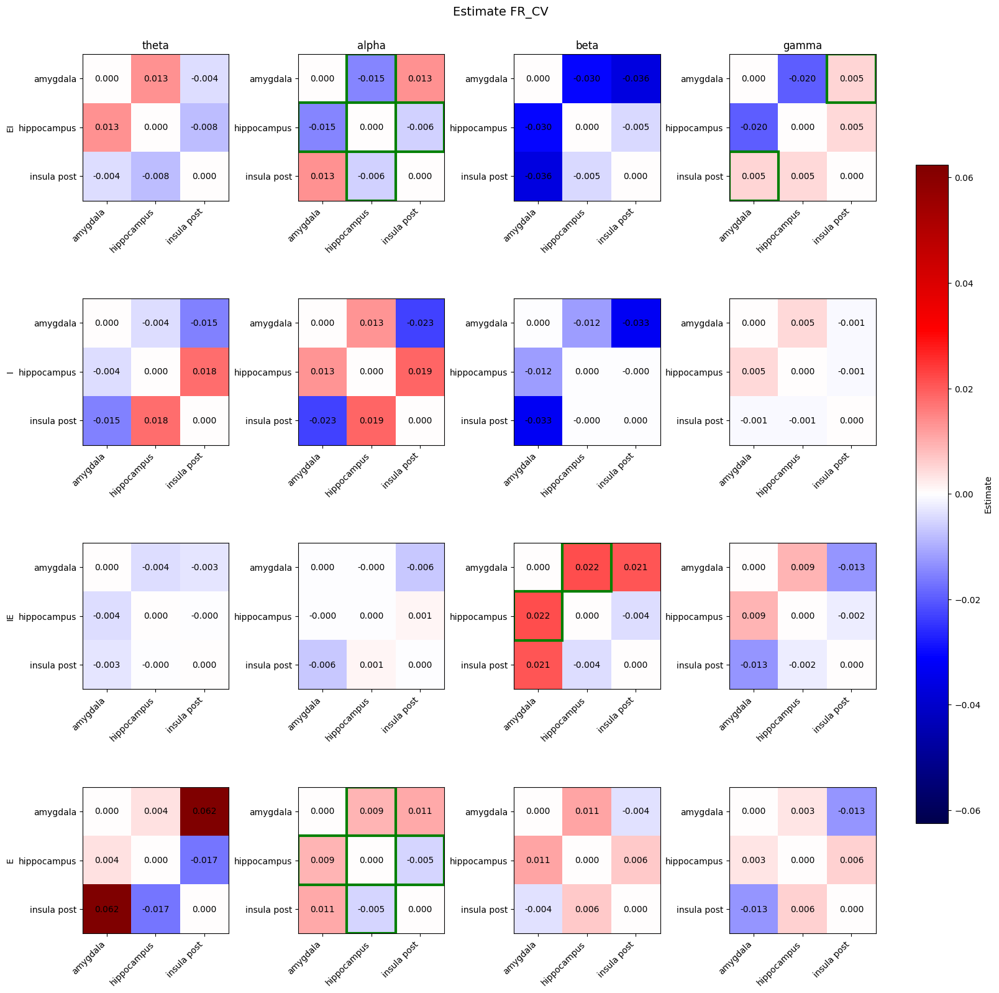

In [ ]:
bands = freq_band_dict_FC_lmm['wb']

vlim = np.abs([df_fc_stats_FR_CV['fc'].min(), df_fc_stats_FR_CV['fc'].max()]).max()
fig, axs = plt.subplots(4, len(bands), figsize=(16, 16), constrained_layout=True)

# Loop through each band to plot
for col_i, band in enumerate(band_list):

    for row_i, phase in enumerate(phase_list):

        ax = axs[row_i, col_i]
        _fc = np.zeros((len(ROI_list_dfc), len(ROI_list_dfc)))
        mask_p = np.zeros((len(ROI_list_dfc), len(ROI_list_dfc)), dtype=bool)

        # Fill matrix with estimates
        for _, row in df_fc_stats_FR_CV.query(f"band == '{band}' and phase == '{phase}'").iterrows():
            r1, r2 = row['pair'].split('-')
            i1 = ROI_list_dfc.index(r1)
            i2 = ROI_list_dfc.index(r2)
            _estimate[i1, i2] = row['fc']
            _estimate[i2, i1] = row['fc']
            mask_p[i1, i2] = row['signi'] == 1
            mask_p[i2, i1] = row['signi'] == 1

        im = ax.imshow(_estimate, cmap='seismic', vmin=-vlim, vmax=vlim)

        # Add text + green highlight if significant
        for x in range(3):
            for y in range(3):
                val = _estimate[x, y]
                if not np.isnan(val):
                    ax.text(y, x, f"{val:.3f}", va='center', ha='center', color='black')
                    if mask_p[x, y]:
                        rect = plt.Rectangle((y - 0.5, x - 0.5), 1, 1, edgecolor='green', linewidth=3, facecolor='none')
                        ax.add_patch(rect)

        ax.set_xticks(range(3))
        ax.set_xticklabels(ROI_list_dfc, rotation=45, ha='right')
        ax.set_yticks(range(3))
        ax.set_yticklabels(ROI_list_dfc)
        if row_i == 0:
            ax.set_title(f"{band}")
        if col_i == 0:
            ax.set_ylabel(phase)

# Colorbar (shared)
cbar = fig.colorbar(im, ax=axs.ravel().tolist(), shrink=0.7, orientation='vertical')
cbar.set_label('Estimate')

plt.suptitle("Estimate FR_CV", fontsize=14)
plt.show()


## ALL CONDITIONS

### ANATOMY

In [ ]:
df_Cxy_ALLCOND['ROI'].unique()

array(['temporal sup', 'hippocampus', 'temporal inf', 'temporal med',
       'pole temporal', 'precuneus', 'lingual', 'insula post', 'amygdala',
       'precentral', 'cuneus', 'occipital lat', 'insula ant',
       'postcentral', 'pars opercularis', 'frontal sup',
       'cingulaire ant rostral', 'frontal inf', 'WM', 'supramarginal',
       'parietal sup', 'cingulaire post'], dtype=object)

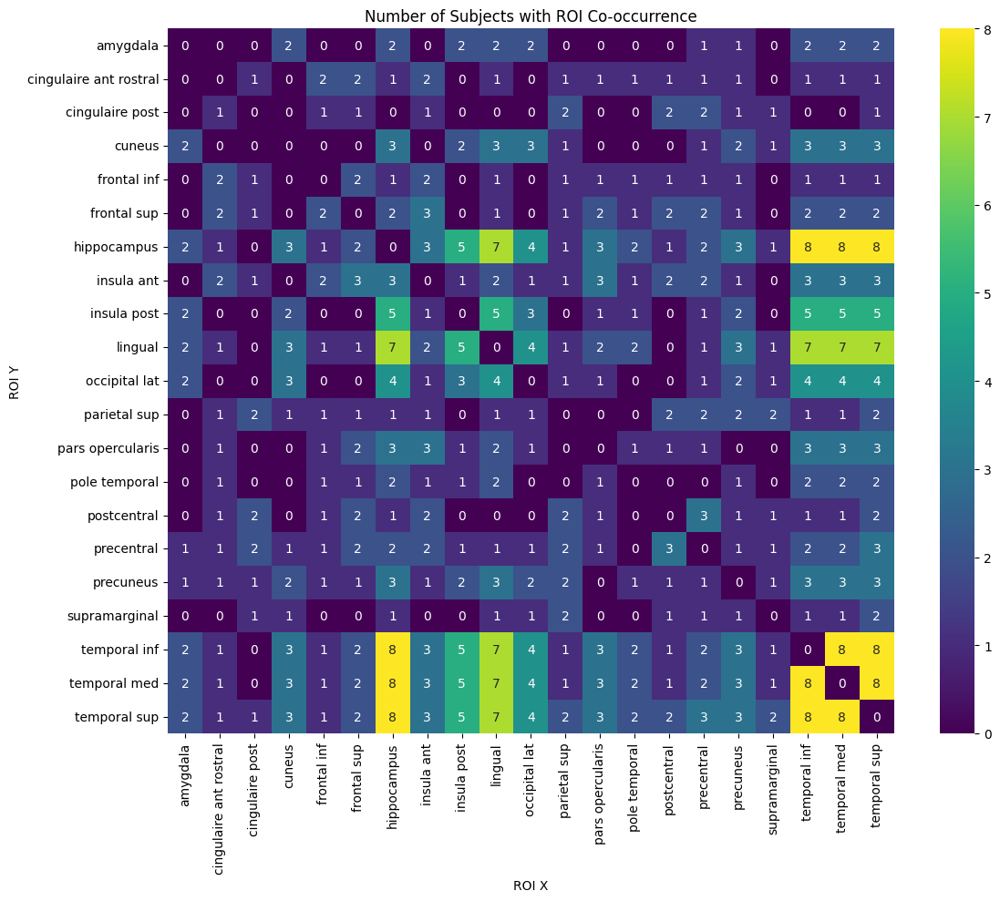

In [ ]:
sujet_roi_map = df_Cxy_ALLCOND.query(f"ROI != 'WM'").groupby('sujet')['ROI'].unique()

# Get the full unique ROI list
all_rois = np.unique(df_Cxy_ALLCOND.query(f"ROI != 'WM'")['ROI'])

# Create an empty DataFrame to store counts
roi_matrix = pd.DataFrame(0, index=all_rois, columns=all_rois)

# Count co-occurrence
for rois in sujet_roi_map:
    for roi1 in rois:
        for roi2 in rois:
            if roi1 == roi2:
                continue
            roi_matrix.loc[roi1, roi2] += 1

plt.figure(figsize=(12, 10))
sns.heatmap(roi_matrix, annot=True, fmt="d", cmap="viridis")
plt.title("Number of Subjects with ROI Co-occurrence")
plt.ylabel("ROI Y")
plt.xlabel("ROI X")
plt.tight_layout()
plt.show()

In [ ]:
ROI_dfc = ['frontal sup', 'frontal inf']
df_Cxy_ALLCOND.query(f"ROI in {ROI_dfc}").groupby(['sujet', 'ROI']).count().groupby(['sujet']).count().query(f"cond >= {len(ROI_dfc)}").reset_index()['sujet'].iloc[:]

0    BOUt
1    TREt
Name: sujet, dtype: object

In [ ]:
ROI_dfc = ['amygdala', 'hippocampus', 'insula post']
df_Cxy_ALLCOND.query(f"ROI in {ROI_dfc}").groupby(['sujet', 'ROI']).count().groupby(['sujet']).count().query(f"cond >= {len(ROI_dfc)}").reset_index()['sujet'].iloc[:]

0    GOBc
1    POTm
Name: sujet, dtype: object

In [ ]:
ROI_dfc = ['amygdala', 'hippocampus', 'insula post']
sujet_sel_dfc = ['CHEe', 'GOBc', 'POTm']
df_Cxy_ALLCOND.query(f"ROI in {ROI_dfc} and sujet in {sujet_sel_dfc}").groupby(['sujet', 'ROI']).count()['cond']

sujet  ROI        
CHEe   amygdala        4
       hippocampus    28
       insula post    16
GOBc   amygdala       16
       hippocampus    28
       insula post    32
POTm   amygdala       16
       hippocampus    48
       insula post    16
Name: cond, dtype: int64

### LMM WHOLE PHASE

In [ ]:
pairs_to_compute = []

for pair_A_i, pair_A in enumerate(ROI_list_dfc):
    
    for pair_B_i, pair_B in enumerate(ROI_list_dfc):

        if pair_A == pair_B or f'{pair_A}-{pair_B}' in pairs_to_compute or f'{pair_B}-{pair_A}' in pairs_to_compute:
            continue

        pairs_to_compute.append(f'{pair_A}-{pair_B}')


pair_list = ['-'.join(sorted(pair.split('-'))) for pair in pairs_to_compute]

In [ ]:
os.chdir(os.path.join(path_results, 'allplot', 'LMM', 'FC', 'df_lmm'))
df_lmm_ALLCOND = pd.DataFrame()

for pair in pair_list:

    for band in freq_band_dict_FC_lmm['wb']:

        _df = pd.read_excel(f'lmm_{pair}_{band}_res_FC_ALLCOND.xlsx')
        _df['pair'] = [pair] * _df.shape[0]
        _df['band'] = [band] * _df.shape[0]
        df_lmm_ALLCOND = pd.concat([df_lmm_ALLCOND, _df])

In [ ]:
data_cond = {'pair' : [], 'band' : [], 'estimate' : [], 'pval' : [], 'p' : []}

for pair in pair_list:

    for band in freq_band_dict_FC_lmm['wb']:

        for cond in conditions:

            df = df_lmm_ALLCOND.query(f"pair == '{pair}' and band == '{band}'")
            _estimate = df.query(f"term == 'resp'")['estimate'].iloc[0]
            pval = df.query(f"term == 'resp'")['p.value'].iloc[0]
            if pval < 0.05:
                p = 1
            else:
                p = 0

            data_cond['pair'].append(pair)
            data_cond['band'].append(band)
            data_cond['estimate'].append(_estimate)
            data_cond['pval'].append(pval)
            data_cond['p'].append(p)

df_ALLCOND_pval = pd.DataFrame(data_cond)

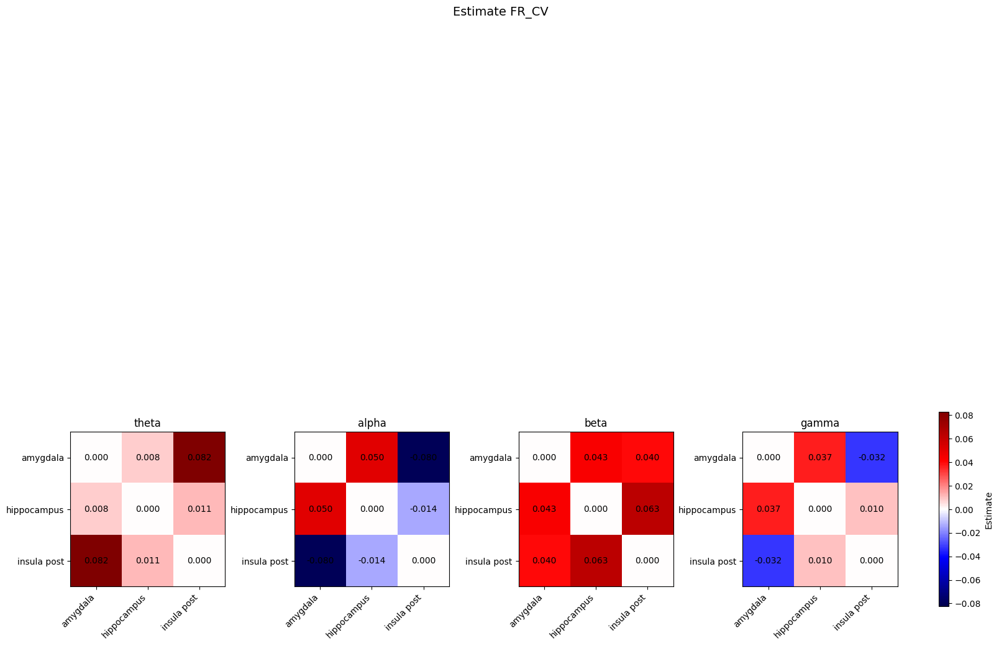

In [ ]:
bands = freq_band_dict_FC_lmm['wb']

vlim = np.abs([df_ALLCOND_pval['estimate'].min(), df_ALLCOND_pval['estimate'].max()]).max()
fig, axs = plt.subplots(ncols=len(bands), figsize=(16, 16), constrained_layout=True)

# Loop through each band to plot
for col_i, band in enumerate(bands):

    ax = axs[col_i]
    _estimate = np.zeros((len(ROI_list_dfc), len(ROI_list_dfc)))
    mask_p = np.zeros((len(ROI_list_dfc), len(ROI_list_dfc)), dtype=bool)

    # Fill matrix with estimates
    for _, row in df_ALLCOND_pval.query(f"band == '{band}'").iterrows():
        r1, r2 = row['pair'].split('-')
        i1 = ROI_list_dfc.index(r1)
        i2 = ROI_list_dfc.index(r2)
        _estimate[i1, i2] = row['estimate']
        _estimate[i2, i1] = row['estimate']
        mask_p[i1, i2] = row['p'] == 1
        mask_p[i2, i1] = row['p'] == 1

    im = ax.imshow(_estimate, cmap='seismic', vmin=-vlim, vmax=vlim)

    # Add text + green highlight if significant
    for x in range(3):
        for y in range(3):
            val = _estimate[x, y]
            if not np.isnan(val):
                ax.text(y, x, f"{val:.3f}", va='center', ha='center', color='black')
                if mask_p[x, y]:
                    rect = plt.Rectangle((y - 0.5, x - 0.5), 1, 1, edgecolor='green', linewidth=3, facecolor='none')
                    ax.add_patch(rect)

    ax.set_xticks(range(3))
    ax.set_xticklabels(ROI_list_dfc, rotation=45, ha='right')
    ax.set_yticks(range(3))
    ax.set_yticklabels(ROI_list_dfc)
    ax.set_title(f"{band}")

# Colorbar (shared)
cbar = fig.colorbar(im, ax=axs.ravel().tolist(), shrink=0.2, orientation='vertical')
cbar.set_label('Estimate')

plt.suptitle("Estimate FR_CV", fontsize=14)
plt.show()


### LMM PHASE

In [ ]:
pairs_to_compute = []

for pair_A_i, pair_A in enumerate(ROI_list_dfc):
    
    for pair_B_i, pair_B in enumerate(ROI_list_dfc):

        if pair_A == pair_B or f'{pair_A}-{pair_B}' in pairs_to_compute or f'{pair_B}-{pair_A}' in pairs_to_compute:
            continue

        pairs_to_compute.append(f'{pair_A}-{pair_B}')


pair_list = ['-'.join(sorted(pair.split('-'))) for pair in pairs_to_compute]

In [ ]:
os.chdir(os.path.join(path_results, 'allplot', 'LMM', 'FC', 'df_lmm'))
df_lmm_ALLCOND = pd.DataFrame()

for pair in pair_list:

    for band in freq_band_dict_FC_lmm['wb']:

        _df = pd.read_excel(f'lmm_{pair}_{band}_res_FC_ALLCOND.xlsx')
        _df['pair'] = [pair] * _df.shape[0]
        _df['band'] = [band] * _df.shape[0]
        df_lmm_ALLCOND = pd.concat([df_lmm_ALLCOND, _df])

In [ ]:
data_cond = {'pair' : [], 'band' : [], 'phase' : [], 'cond' : [], 'estimate' : [], 'pval' : [], 'p' : []}

for pair in pair_list:

    for band in freq_band_dict_FC_lmm['wb']:

        for cond in conditions:

            for phase in ['I', 'IE', 'E', 'EI']:

                if cond == 'FR_CV' and phase == 'I':
                    
                    _term = '(Intercept)'

                elif cond == 'FR_CV':

                    _term = f'phase{phase}'

                elif phase == 'I':

                    _term = f'cond{cond}'

                else:

                    _term = f"phase{phase}:cond{cond}"

                df = df_lmm_ALLCOND.query(f"pair == '{pair}' and band == '{band}'")
                _estimate = df.query(f"term == '{_term}'")['estimate'].iloc[0]
                pval = df.query(f"term == '{_term}'")['p.value'].iloc[0]
                if pval < 0.05:
                    p = 1
                else:
                    p = 0

                data_cond['pair'].append(pair)
                data_cond['band'].append(band)
                data_cond['cond'].append(cond)
                data_cond['phase'].append(phase)
                data_cond['estimate'].append(_estimate)
                data_cond['pval'].append(pval)
                data_cond['p'].append(p)

df_FR_CV_pval_cond_phase = pd.DataFrame(data_cond)

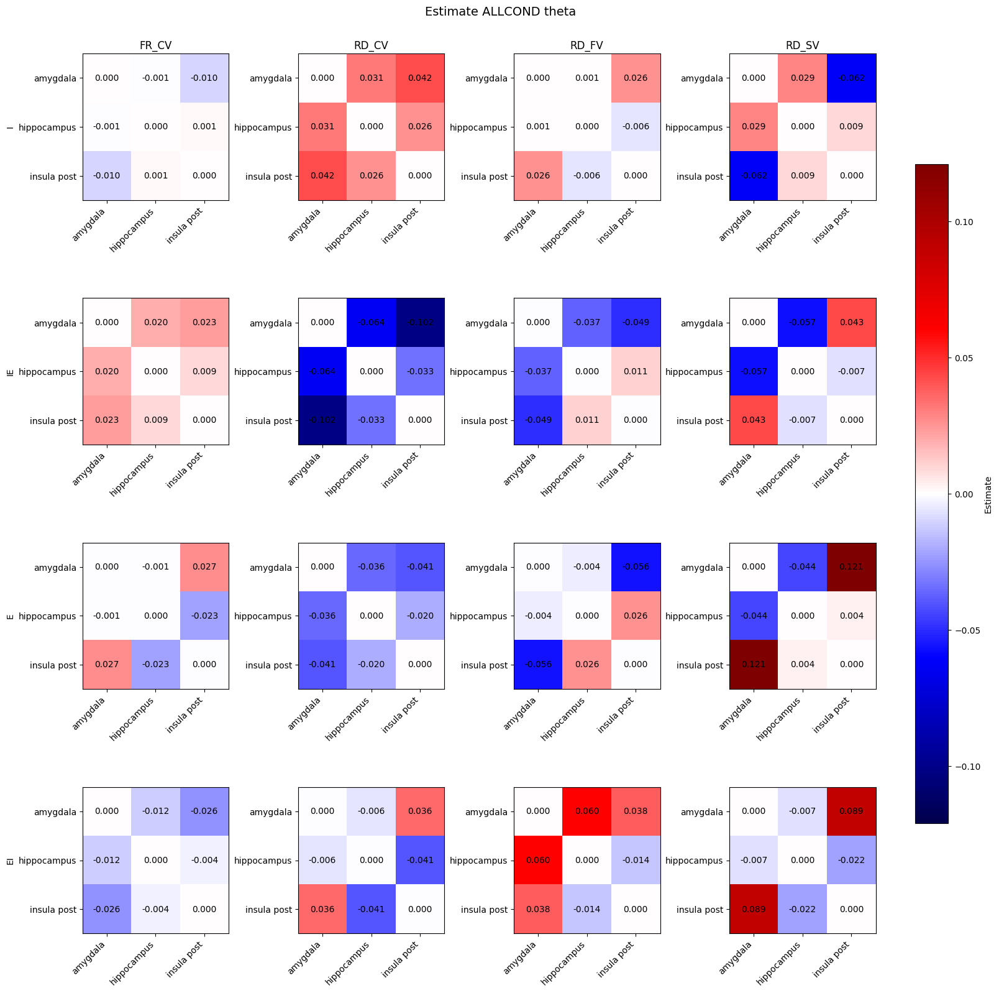

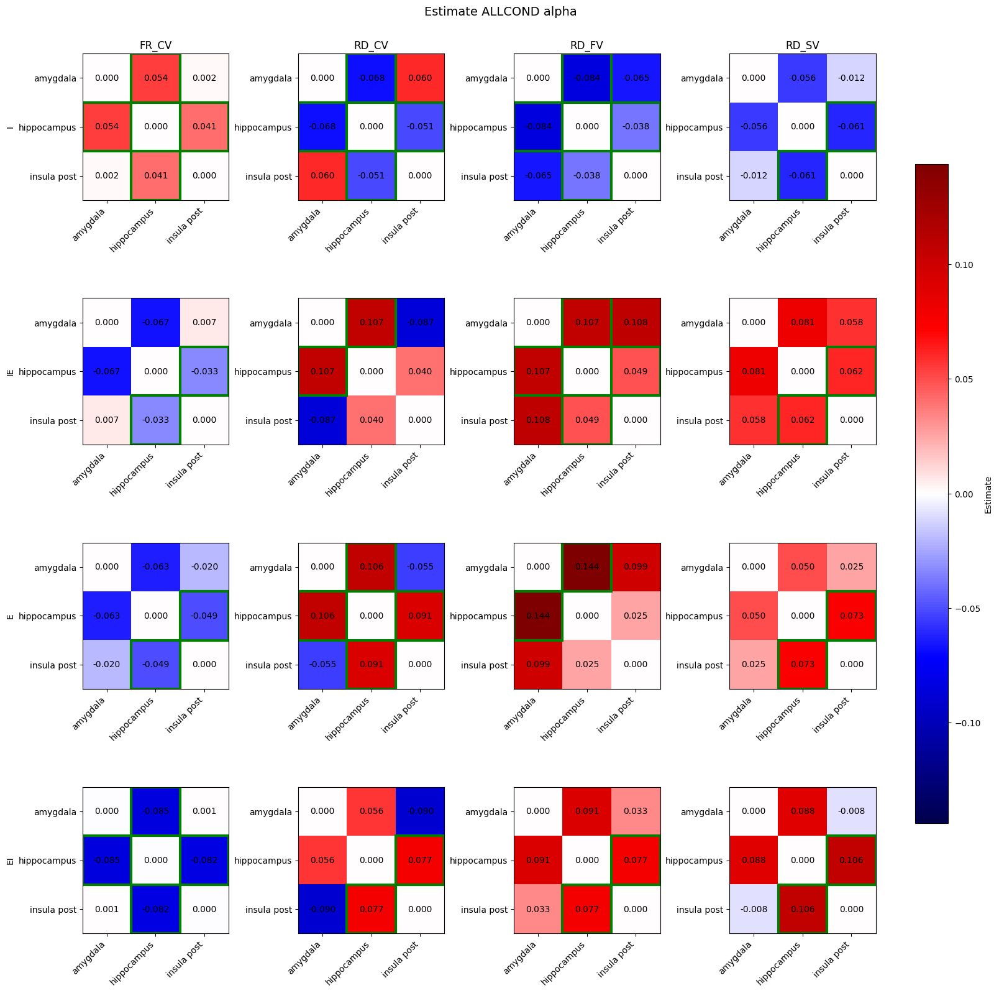

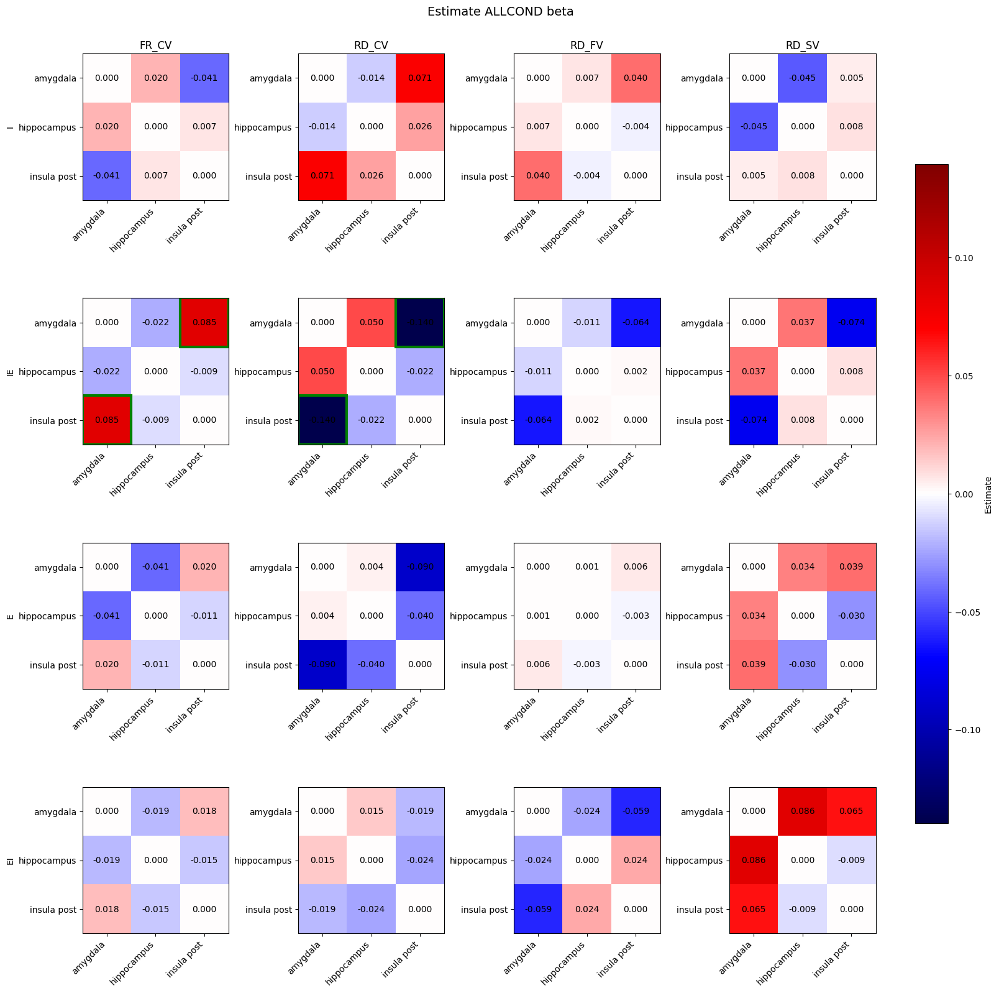

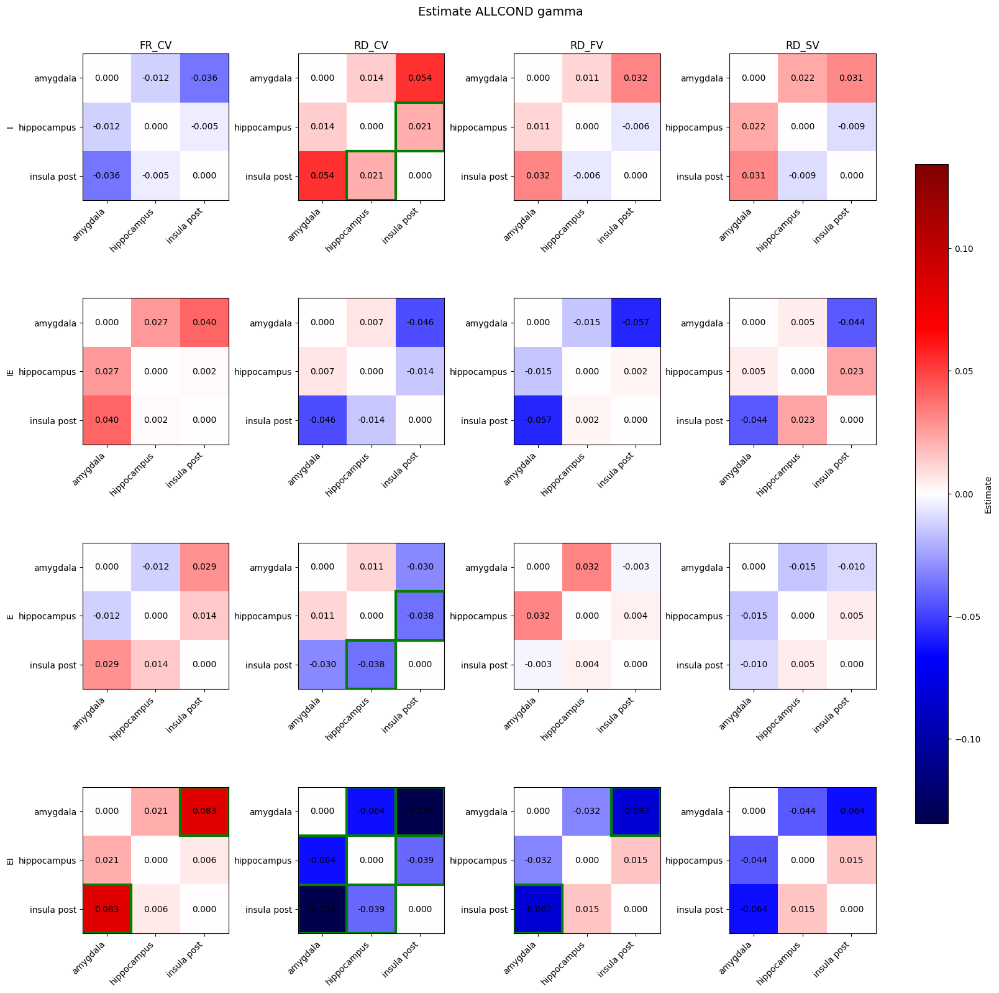

In [ ]:
bands = freq_band_dict_FC_lmm['wb']

for i, band in enumerate(bands):

    df_plot = df_FR_CV_pval_cond_phase.query(f"band == '{band}'")

    vlim = np.abs([df_plot['estimate'].min(), df_plot['estimate'].max()]).max()
    fig, axs = plt.subplots(4, len(conditions), figsize=(16, 16), constrained_layout=True)

    # Loop through each band to plot
    for col_i, cond in enumerate(conditions):

        for row_i, phase in enumerate(['I', 'IE', 'E', 'EI']):

            ax = axs[row_i, col_i]
            _estimate = np.zeros((len(ROI_list_dfc), len(ROI_list_dfc)))
            mask_p = np.zeros((len(ROI_list_dfc), len(ROI_list_dfc)), dtype=bool)

            # Fill matrix with estimates
            for _, row in df_plot.query(f"cond == '{cond}' and phase == '{phase}'").iterrows():
                r1, r2 = row['pair'].split('-')
                i1 = ROI_list_dfc.index(r1)
                i2 = ROI_list_dfc.index(r2)
                _estimate[i1, i2] = row['estimate']
                _estimate[i2, i1] = row['estimate']
                mask_p[i1, i2] = row['p'] == 1
                mask_p[i2, i1] = row['p'] == 1

            im = ax.imshow(_estimate, cmap='seismic', vmin=-vlim, vmax=vlim)

            # Add text + green highlight if significant
            for x in range(3):
                for y in range(3):
                    val = _estimate[x, y]
                    if not np.isnan(val):
                        ax.text(y, x, f"{val:.3f}", va='center', ha='center', color='black')
                        if mask_p[x, y]:
                            rect = plt.Rectangle((y - 0.5, x - 0.5), 1, 1, edgecolor='green', linewidth=3, facecolor='none')
                            ax.add_patch(rect)

            ax.set_xticks(range(3))
            ax.set_xticklabels(ROI_list_dfc, rotation=45, ha='right')
            ax.set_yticks(range(3))
            ax.set_yticklabels(ROI_list_dfc)
            if row_i == 0:
                ax.set_title(cond)
            if col_i == 0:
                ax.set_ylabel(phase)

    # Colorbar (shared)
    cbar = fig.colorbar(im, ax=axs.ravel().tolist(), shrink=0.7, orientation='vertical')
    cbar.set_label('Estimate')

    plt.suptitle(f"Estimate ALLCOND {band}", fontsize=14)
    plt.show()


### CLUSTER BASED WHOLE PHASE

In [ ]:
band_list = df_fc_ALLCOND['band'].unique()
pair_list = df_fc_ALLCOND['pair'].unique()
sujet_list_fc = df_fc_ALLCOND['sujet'].unique()
cond_list = df_fc_ALLCOND['cond'].unique()
print(band_list)
print(pair_list)
print(sujet_list_fc)
print(cond_list)

['theta' 'alpha' 'beta' 'gamma']
['amygdala-hippocampus' 'amygdala-insula post' 'hippocampus-insula post']
['CHEe' 'GOBc' 'POTm']
['FR_CV' 'RD_CV' 'RD_FV' 'RD_SV']


In [ ]:
df_fc_stats_ALLCOND = pd.DataFrame()

for band in band_list:

    for pair in pair_list:

        print(band, pair)

        data_baseline = df_fc_ALLCOND.query(f"band == '{band}' and pair == '{pair}' and phase == 'W' and cond == 'FR_CV'")['fc'].values
        _df_fc = pd.DataFrame({'band' : [band], 'pair' : [pair], 'cond' : ['FR_CV'], 'fc' : [np.median(data_baseline)], 'signi' : [False]})
        df_fc_stats_ALLCOND = pd.concat([df_fc_stats_ALLCOND, _df_fc])

        for cond in cond_list:

            if cond == 'FR_CV':
                continue

            data_cond = df_fc_ALLCOND.query(f"band == '{band}' and pair == '{pair}' and phase == 'W' and cond == '{cond}'")['fc'].values

            stats_res = get_permutation_2groups(data_baseline, data_cond, n_surr_fc, stat_design='within', mode_grouped='median', mode_generate_surr='percentile', percentile_thresh=fc_percentile_thresh)

            _df_fc = pd.DataFrame({'band' : [band], 'pair' : [pair], 'cond' : [cond], 'fc' : [np.median(data_cond)], 'signi' : [stats_res]})

            df_fc_stats_ALLCOND = pd.concat([df_fc_stats_ALLCOND, _df_fc])

theta amygdala-hippocampus
theta amygdala-insula post
theta hippocampus-insula post
alpha amygdala-hippocampus
alpha amygdala-insula post
alpha hippocampus-insula post
beta amygdala-hippocampus
beta amygdala-insula post
beta hippocampus-insula post
gamma amygdala-hippocampus
gamma amygdala-insula post
gamma hippocampus-insula post


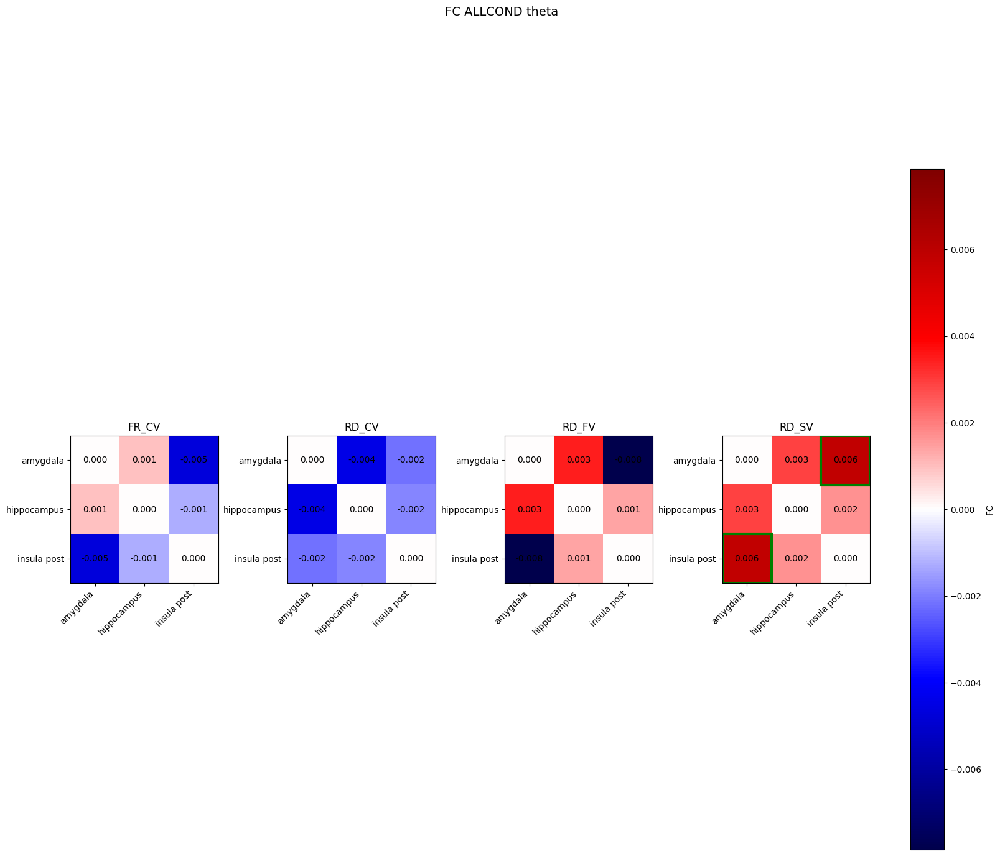

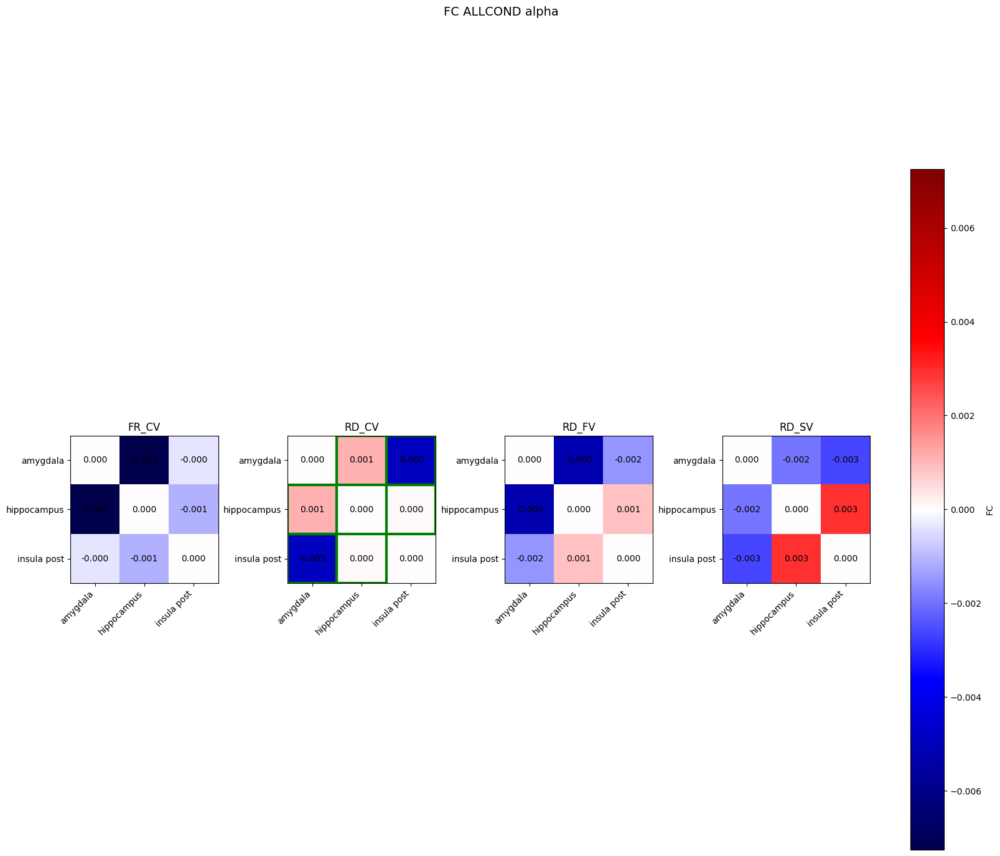

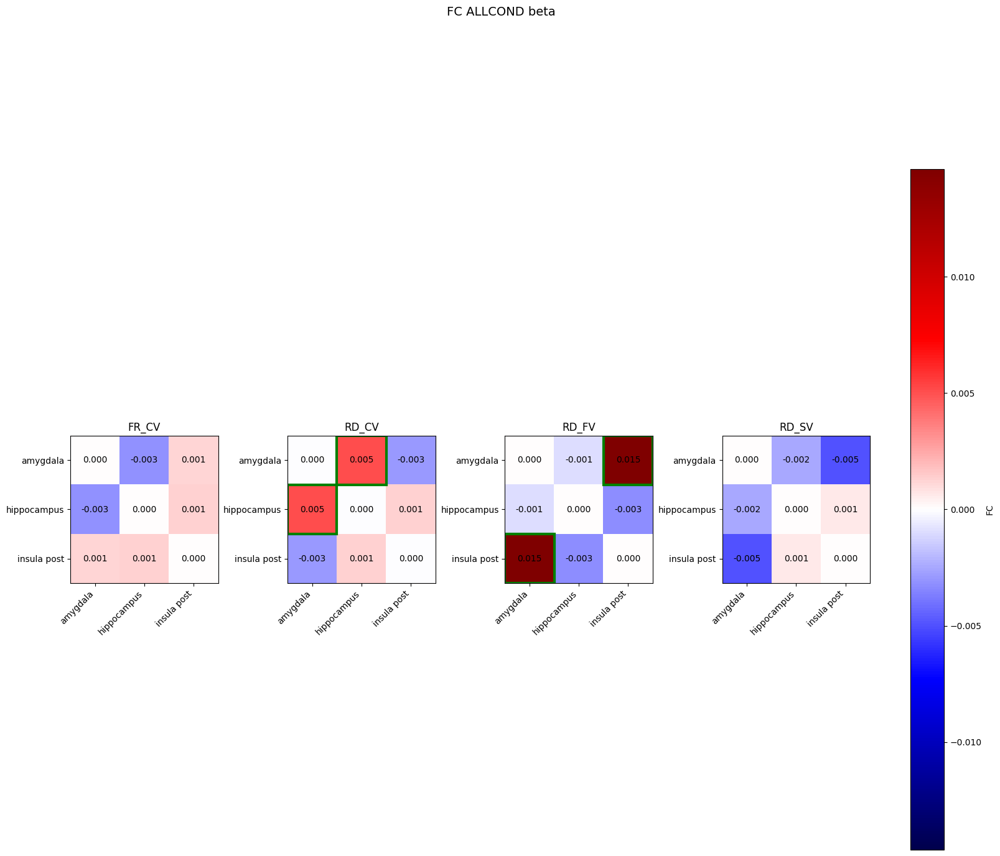

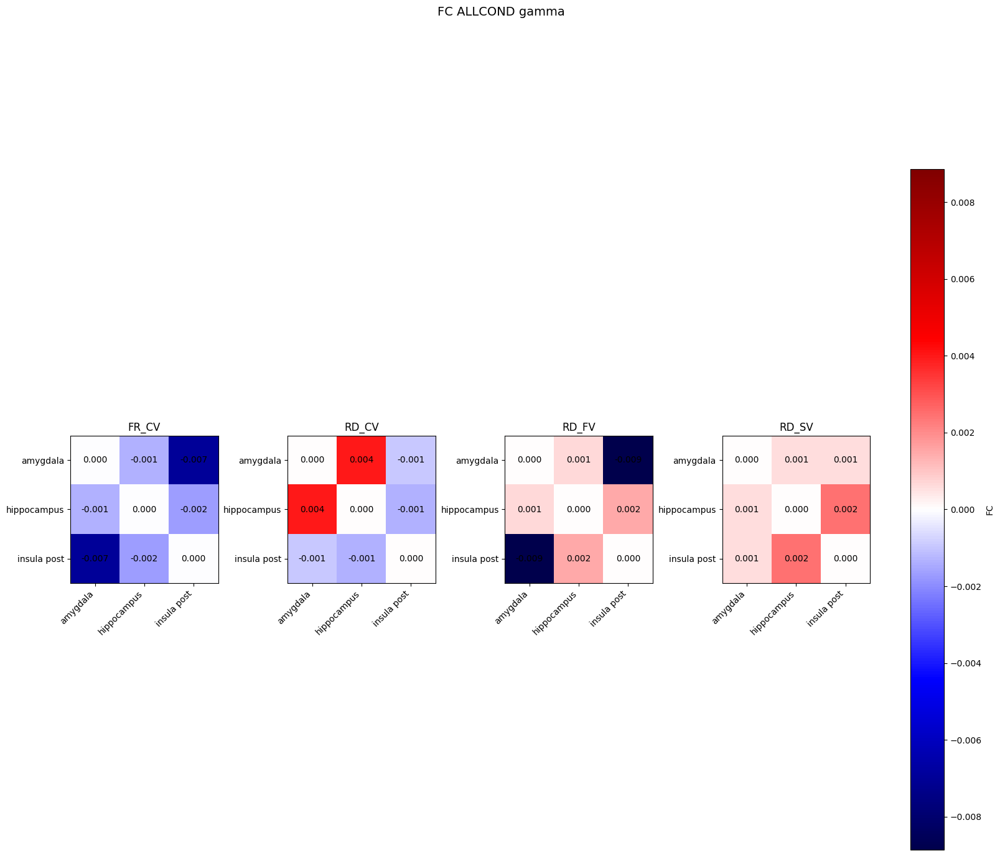

In [ ]:
for i, band in enumerate(band_list):

    df_plot = df_fc_stats_ALLCOND.query(f"band == '{band}'")

    vlim = np.abs([df_plot['fc'].min(), df_plot['fc'].max()]).max()
    fig, axs = plt.subplots(ncols=len(conditions), figsize=(16, 16), constrained_layout=True)

    # Loop through each band to plot
    for col_i, cond in enumerate(conditions):

        ax = axs[col_i]
        _fc = np.zeros((len(ROI_list_dfc), len(ROI_list_dfc)))
        mask_p = np.zeros((len(ROI_list_dfc), len(ROI_list_dfc)), dtype=bool)

        # Fill matrix with estimates
        for _, row in df_plot.query(f"cond == '{cond}'").iterrows():
            r1, r2 = row['pair'].split('-')
            i1 = ROI_list_dfc.index(r1)
            i2 = ROI_list_dfc.index(r2)
            _estimate[i1, i2] = row['fc']
            _estimate[i2, i1] = row['fc']
            mask_p[i1, i2] = row['signi'] == 1
            mask_p[i2, i1] = row['signi'] == 1

        im = ax.imshow(_estimate, cmap='seismic', vmin=-vlim, vmax=vlim)

        # Add text + green highlight if significant
        for x in range(3):
            for y in range(3):
                val = _estimate[x, y]
                if not np.isnan(val):
                    ax.text(y, x, f"{val:.3f}", va='center', ha='center', color='black')
                    if mask_p[x, y]:
                        rect = plt.Rectangle((y - 0.5, x - 0.5), 1, 1, edgecolor='green', linewidth=3, facecolor='none')
                        ax.add_patch(rect)

        ax.set_xticks(range(3))
        ax.set_xticklabels(ROI_list_dfc, rotation=45, ha='right')
        ax.set_yticks(range(3))
        ax.set_yticklabels(ROI_list_dfc)
        ax.set_title(cond)

    # Colorbar (shared)
    cbar = fig.colorbar(im, ax=axs.ravel().tolist(), shrink=0.7, orientation='vertical')
    cbar.set_label('FC')

    plt.suptitle(f"FC ALLCOND {band}", fontsize=14)
    plt.show()

### CLUSTER BASED PHASE

In [ ]:
phase_list = df_fc_ALLCOND['phase'].unique()
band_list = df_fc_ALLCOND['band'].unique()
pair_list = df_fc_ALLCOND['pair'].unique()
sujet_list_fc = df_fc_ALLCOND['sujet'].unique()
cond_list = df_fc_ALLCOND['cond'].unique()
print(phase_list)
print(band_list)
print(pair_list)
print(sujet_list_fc)
print(cond_list)

['EI' 'I' 'IE' 'E']
['theta' 'alpha' 'beta' 'gamma']
['amygdala-hippocampus' 'amygdala-insula post' 'hippocampus-insula post']
['CHEe' 'GOBc' 'POTm']
['FR_CV' 'RD_CV' 'RD_FV' 'RD_SV']


In [ ]:
df_fc_stats_ALLCOND = pd.DataFrame()

for band in band_list:

    for pair in pair_list:

        print(band, pair)

        for phase in phase_list:

            data_baseline = df_fc_ALLCOND.query(f"band == '{band}' and pair == '{pair}' and phase == '{phase}' and cond == 'FR_CV'")['fc'].values
            _df_fc = pd.DataFrame({'band' : [band], 'pair' : [pair], 'phase' : [phase], 'cond' : ['FR_CV'], 'fc' : [np.median(data_baseline)], 'signi' : [False]})
            df_fc_stats_ALLCOND = pd.concat([df_fc_stats_ALLCOND, _df_fc])

            for cond in cond_list:

                if cond == 'FR_CV':
                    continue

                data_cond = df_fc_ALLCOND.query(f"band == '{band}' and pair == '{pair}' and phase == '{phase}' and cond == '{cond}'")['fc'].values

                stats_res = get_permutation_2groups(data_baseline, data_cond, n_surr_fc, stat_design='within', mode_grouped='median', mode_generate_surr='percentile', percentile_thresh=fc_percentile_thresh)

                _df_fc = pd.DataFrame({'band' : [band], 'pair' : [pair], 'phase' : [phase], 'cond' : [cond], 'fc' : [np.median(data_cond)], 'signi' : [stats_res]})

                df_fc_stats_ALLCOND = pd.concat([df_fc_stats_ALLCOND, _df_fc])

theta amygdala-hippocampus
theta amygdala-insula post
theta hippocampus-insula post
alpha amygdala-hippocampus
alpha amygdala-insula post
alpha hippocampus-insula post
beta amygdala-hippocampus
beta amygdala-insula post
beta hippocampus-insula post
gamma amygdala-hippocampus
gamma amygdala-insula post
gamma hippocampus-insula post


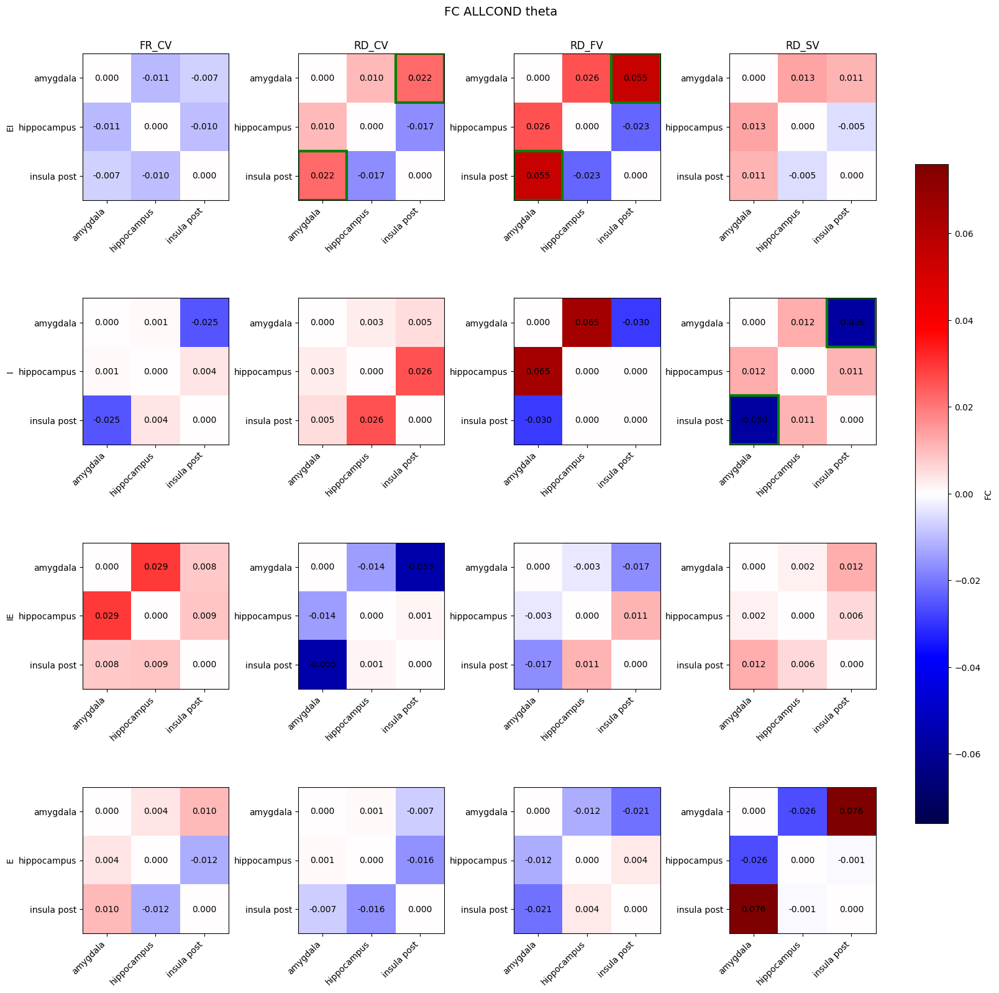

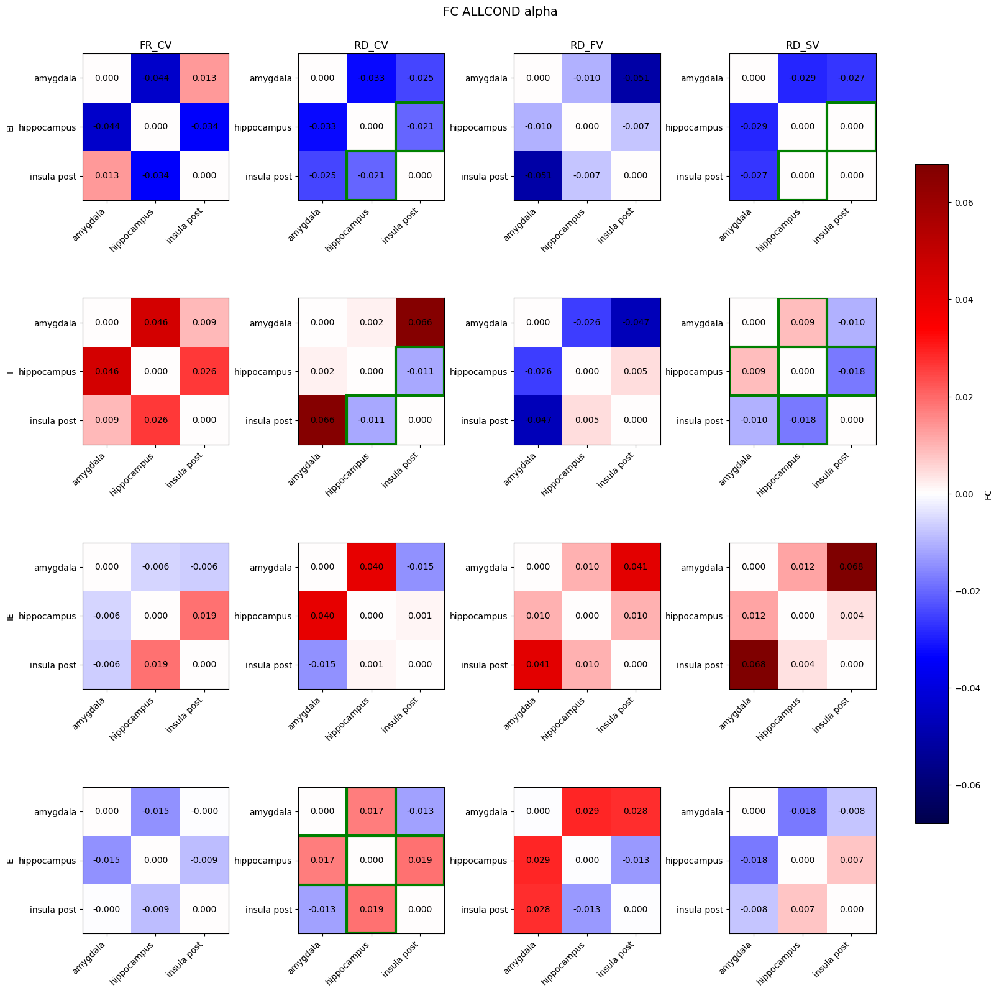

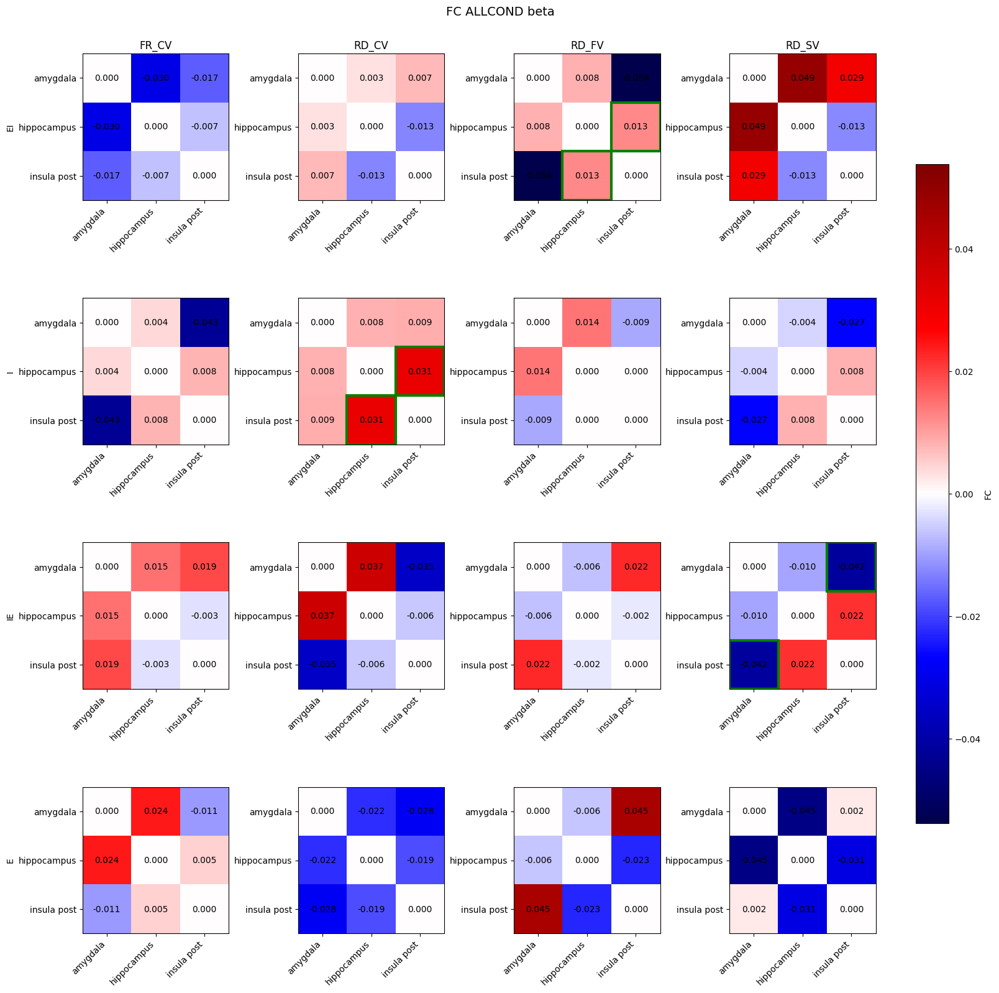

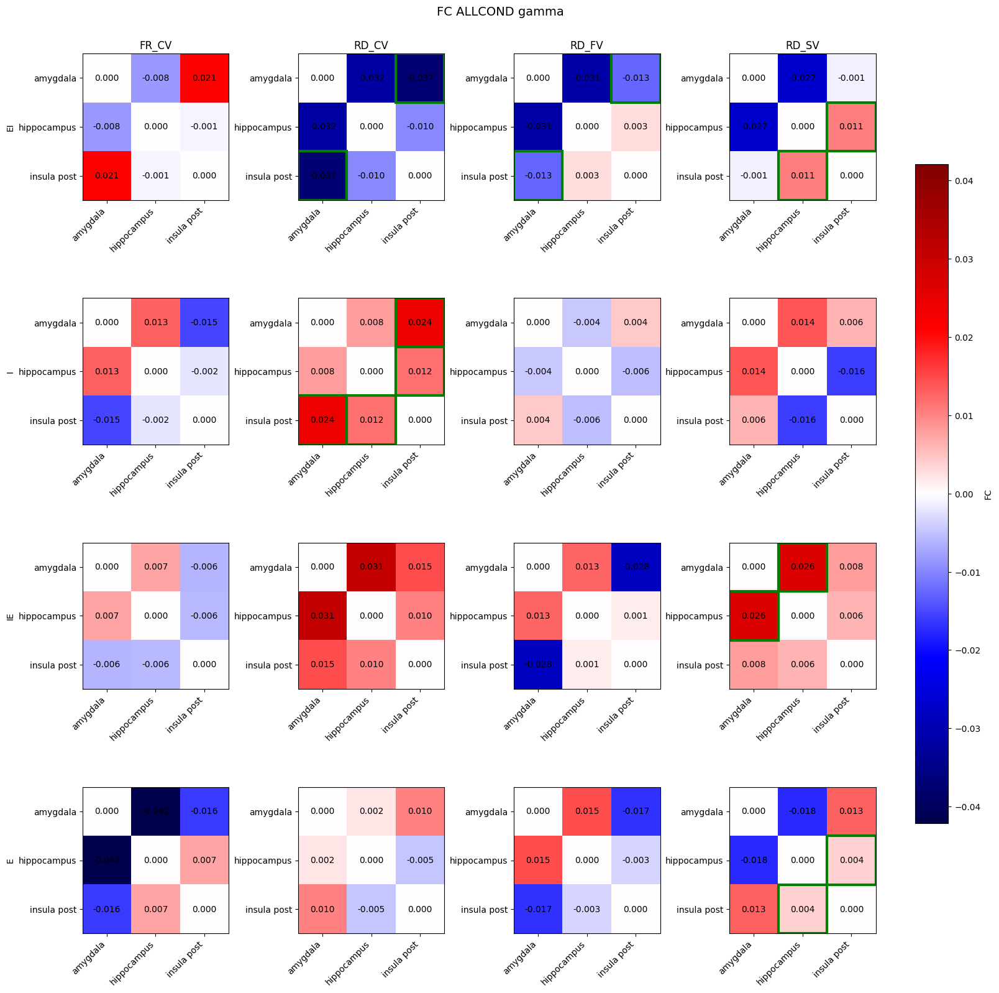

In [ ]:
for i, band in enumerate(band_list):

    df_plot = df_fc_stats_ALLCOND.query(f"band == '{band}'")

    vlim = np.abs([df_plot['fc'].min(), df_plot['fc'].max()]).max()
    fig, axs = plt.subplots(4, len(conditions), figsize=(16, 16), constrained_layout=True)

    # Loop through each band to plot
    for col_i, cond in enumerate(conditions):

        for row_i, phase in enumerate(phase_list):

            ax = axs[row_i, col_i]
            _fc = np.zeros((len(ROI_list_dfc), len(ROI_list_dfc)))
            mask_p = np.zeros((len(ROI_list_dfc), len(ROI_list_dfc)), dtype=bool)

            # Fill matrix with estimates
            for _, row in df_plot.query(f"cond == '{cond}' and phase == '{phase}'").iterrows():
                r1, r2 = row['pair'].split('-')
                i1 = ROI_list_dfc.index(r1)
                i2 = ROI_list_dfc.index(r2)
                _estimate[i1, i2] = row['fc']
                _estimate[i2, i1] = row['fc']
                mask_p[i1, i2] = row['signi'] == 1
                mask_p[i2, i1] = row['signi'] == 1

            im = ax.imshow(_estimate, cmap='seismic', vmin=-vlim, vmax=vlim)

            # Add text + green highlight if significant
            for x in range(3):
                for y in range(3):
                    val = _estimate[x, y]
                    if not np.isnan(val):
                        ax.text(y, x, f"{val:.3f}", va='center', ha='center', color='black')
                        if mask_p[x, y]:
                            rect = plt.Rectangle((y - 0.5, x - 0.5), 1, 1, edgecolor='green', linewidth=3, facecolor='none')
                            ax.add_patch(rect)

            ax.set_xticks(range(3))
            ax.set_xticklabels(ROI_list_dfc, rotation=45, ha='right')
            ax.set_yticks(range(3))
            ax.set_yticklabels(ROI_list_dfc)
            if row_i == 0:
                ax.set_title(cond)
            if col_i == 0:
                ax.set_ylabel(phase)

    # Colorbar (shared)
    cbar = fig.colorbar(im, ax=axs.ravel().tolist(), shrink=0.7, orientation='vertical')
    cbar.set_label('FC')

    plt.suptitle(f"FC ALLCOND {band}", fontsize=14)
    plt.show()